# Set up


In [1]:
import requests
import json
import pandas as pd
import gspread
from google.auth.transport.requests import Request
from google.oauth2.service_account import Credentials
from google.colab import auth
from google.auth import default
from gspread_dataframe import set_with_dataframe
import pandas as pd
import datetime
import pytz
import numpy as np
auth.authenticate_user()
from sklearn.linear_model import LinearRegression
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np
from matplotlib.patches import Rectangle
# Lấy thông tin xác thực
creds, _ = default()

# Kết nối đến Google Sheets
client = gspread.authorize(creds)

tz = pytz.timezone('Asia/Ho_Chi_Minh')
today = datetime.datetime.now(tz).date()

In [2]:
def metabase_query(params, query_id, info, mtb_token):
    payload = f'parameters={params}'
    headers = {'Content-Type': 'application/x-www-form-urlencoded', 'X-Metabase-Session': mtb_token}
    url = f'https://metabase.ninjavan.co/api/card/{query_id}/query/json'


    print(f'Querying {info} data...')
    _r = requests.post(url=url, headers=headers, data=payload)

    if _r.status_code == 200:
        df = pd.DataFrame.from_dict(_r.json())
        print('Success!')
        return df
    else:
        print(f"Error: {response.status_code}")
        print(_r.text)
        return None

# call metabase_query
params = '[]'

info = 'imcoming'
# mtb_token = 'bac97246-d4c0-49a7-a629-4e0cc09cd9d5'
mtb_token = '48047ab8-35c6-4453-bc34-f84faebc228b'

In [3]:
spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1TbpwBb1l2k-P0qhdfk6pcPW1YfTzt2R_vHVoFjm4A5A/edit?gid=0#gid=0')
wks = spr.worksheet("Plot")
# Lấy dữ liệu từ range AA6:AB447
data = wks.get('A1:E446')

# AA6:AB6 là header, tách header và dữ liệu
header = data[0]  # Dòng đầu tiên là header
rows = data[1:]   # Các dòng còn lại là dữ liệu

# Chuyển đổi dữ liệu sang DataFrame
reference = pd.DataFrame(rows, columns=header)
# Ép kiểu dữ liệu cột X và Y sang số thực
reference['X'] = pd.to_numeric(reference['X'], errors='coerce')
reference['Y'] = pd.to_numeric(reference['Y'], errors='coerce')
# Hiển thị dữ liệu
# # Lọc dữ liệu chỉ lấy region là 'South'
# south_data = reference[reference['Region'] == 'South']
# print(south_data.head())

# Rider active

In [ ]:
open = client.open_by_url('https://docs.google.com/spreadsheets/d/1K_Zf5z7cd5nI4zh-2AYVo8_xTCvWxGUtCTm_9sdP0oo/edit#gid=0')
wks_rider = open.worksheet('Raw')
data_rider = wks_rider.get_all_values()
df_rider= pd.DataFrame(data_rider[1:], columns=data_rider[0])


In [ ]:
# Assuming 'df' is your DataFrame
df_rider['Month'] = pd.to_datetime(df_rider['Succes date'], errors='coerce').dt.month  # Extract month

# Remove rows with NaT (Not a Time) in the 'Month' column
df_rider = df_rider.dropna(subset=['Month'])

# Convert 'Month' column to integers
df_rider['Month'] = df_rider['Month'].astype(int)

<ipython-input-13-a963788766e2>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_rider['Month'] = pd.to_datetime(df_rider['Succes date'], errors='coerce').dt.month  # Extract month
<ipython-input-13-a963788766e2>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rider['Month'] = df_rider['Month'].astype(int)


In [ ]:
filtered_df = df_rider[
    (df_rider['Month'] == 3) & (df_rider['FT/PT excluse recuse'] == 'FT')
]

In [ ]:
grouped_df = filtered_df.groupby(
    ['DEST HUB', 'Hubs Enriched → ID', 'Delivery Success Driver ID',
     'Driver name', 'Region', 'Province', 'Month']
)['Succes date'].max().reset_index()

In [ ]:
spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1OhJ5LqK61K7RXsFbJYpoFC-JlRQWRyRAdiq_e_9IyRk/edit?gid=1226921776#gid=1226921776') ## updated_data
wks = spr.worksheet("Data -Rider-Mar")
# Xóa dữ liệu trong range A10:U
wks.batch_clear(['A:Z'])

# Select columns from 1 to 500000 (adjust if column names are different)


set_with_dataframe(wks, grouped_df, row= 1, col=1, include_index=False, include_column_header=True)


# Check Cheating


In [ ]:
import pandas as pd
from google.colab import files


# # Lấy tên file đã tải lên
# filename = "Raw cheating.csv"

# # Đọc file CSV vào DataFrame
# df = pd.read_csv(filename, encoding='utf-8')  # Thay đổi encoding nếu cần



In [ ]:
query_driver = 111423
# query_driver = 111484
meta_driver = metabase_query(params, query_driver, info, mtb_token)
# meta_driver['Delivery Success Datetime'] = pd.to_datetime(meta_driver['Delivery Success Datetime'])  # Ensure it's datetime

df = meta_driver

# Lưu danh sách cột gốc để sắp xếp lại
original_columns = df.columns.tolist()


Querying imcoming data...
Success!


In [ ]:
# Hiển thị 5 dòng đầu tiên của DataFrame
try:
    rename_dict = {
        "Transit Time Report → Dest Hub Name": "Dest Hub Name",
        "Transit Time Report → Start Clock Datetime": "Pickup Datetime",
        "Drivers Enriched → Display Name" : "Success Driver",
        "Transit Time Report → Origin Hub Name" : "Origin Hub Name"
    }
    # Attempt to rename columns using the first dictionary
    df = df.rename(columns=rename_dict)
except KeyError:
    # If a KeyError occurs (column not found), use the second dictionary
    rename_dict = {
        "Hubs Enriched → Name": "Dest Hub Name",
        "Transit Time Report → Start Clock Datetime": "Pickup Datetime",
        "Drivers Enriched → Display Name" : "Success Driver",
        "Transit Time Report → Origin Hub Name" : "Origin Hub Name"
    }
    df = df.rename(columns=rename_dict)

# Continue with your code...

original_columns = [
    "Order ID", "Tracking ID", "Cod Value", "Rts Flag", "Parcel Size",
    "Nv Width", "Nv Height", "Nv Length", "Nv Weight", "Items",
    "Dest Zone", "Creation Datetime", "Pickup Datetime",
    "Delivery Success Datetime", "Origin Hub Name", "Dest Hub Name",
    "Shippers group", "Status", "Granular Status", "PU _dest",
    "PU_suc", "Success Driver"
]

# Sắp xếp lại thứ tự cột theo bảng gốc
df = df[original_columns]

In [ ]:
df[df['Pickup Datetime']=="2025-03-29" ]

,Order ID,Tracking ID,Cod Value,Rts Flag,Parcel Size,Nv Width,Nv Height,Nv Length,Nv Weight,Items,...,Pickup Datetime,Delivery Success Datetime,Origin Hub Name,Dest Hub Name,Shippers group,Status,Granular Status,PU _dest,PU_suc,Success Driver
796,390536552,WNJVN00670631005,50231.0,0,xs,8.0,5.0,15.0,0.046,"[{""item_description"":""Bộ làm sạch tai xỏ lỗ, 6...",...,2025-03-29,None,HN - Long Bien - NOR,THN - Pho Yen - NOR - SUB 2,XB & NBU,Transit,Arrived at Sorting Hub,Không,Không,None
801,390536786,WNJVN00493831005,NaN,0,xs,16.0,16.0,20.0,0.070,"[{""item_description"":""Mũ chống nắng MJFT mũ lư...",...,2025-03-29,2025-03-29T12:19:00,HN - Long Bien - NOR,THN - Phu Luong - NOR - SUB 2,XB & NBU,Completed,Completed,Không,Không,None


In [ ]:


# Tạo cột CountIFS đếm số lượng items trùng nhau theo 'Dest Hub Name'
df["CountItems_Dup_ALL"] = df.groupby(["Dest Hub Name", "Items"])["Order ID"].transform("count")
# df['Pickup Datetime'] = pd.to_datetime(df['Pickup Datetime'], format='%Y-%m-%d', errors='coerce')
df['Pickup Datetime'] = pd.to_datetime(df['Pickup Datetime'], errors='coerce')  # Ensure it's datetime
df['Creation Datetime'] = pd.to_datetime(df['Creation Datetime'])  # Ensure it's datetime


In [ ]:
import ast  # Dùng để chuyển đổi chuỗi JSON thành list
import json
from collections import Counter

# Hàm xử lý chuyển đổi chuỗi JSON thành danh sách
def parse_items(items):
    try:
        if isinstance(items, str):  # Chỉ xử lý nếu items là chuỗi
            return json.loads(items)
        else:
            return []  # Trả về danh sách rỗng nếu giá trị không hợp lệ
    except json.JSONDecodeError:
        return []  # Bỏ qua lỗi nếu JSON bị lỗi

# Áp dụng hàm vào cột 'Items'
df["Items"] = df["Items"].apply(parse_items)

# Tạo cột 'Total_Items' để đếm số lượng phần tử trong danh sách
df["Total_Items"] = df["Items"].apply(len)

def most_frequent_item(items):
    if not items:
        return None, 0  # Trả về None nếu danh sách rỗng
    counter = Counter(item["item_description"] for item in items)
    most_common_item, count = counter.most_common(1)[0]  # Lấy sản phẩm lặp lại nhiều nhất
    return most_common_item, count

df[["Most_Frequent_Item", "Most_Frequent_Count"]] = df["Items"].apply(
    lambda x: pd.Series(most_frequent_item(x))
)

In [ ]:


spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1rkPDOmYKrtOg0IhtHAwGQLhRWGoqdwnhg0ue9K-ZC7I/edit?gid=0#gid=0') ## updated_data
wks = spr.worksheet("Raw")
# Xóa dữ liệu trong range A10:U
wks.batch_clear(['E:AE'])

# Select columns from 1 to 500000 (adjust if column names are different)


set_with_dataframe(wks, df, row= 1, col=5, include_index=False, include_column_header=True)


# Plot

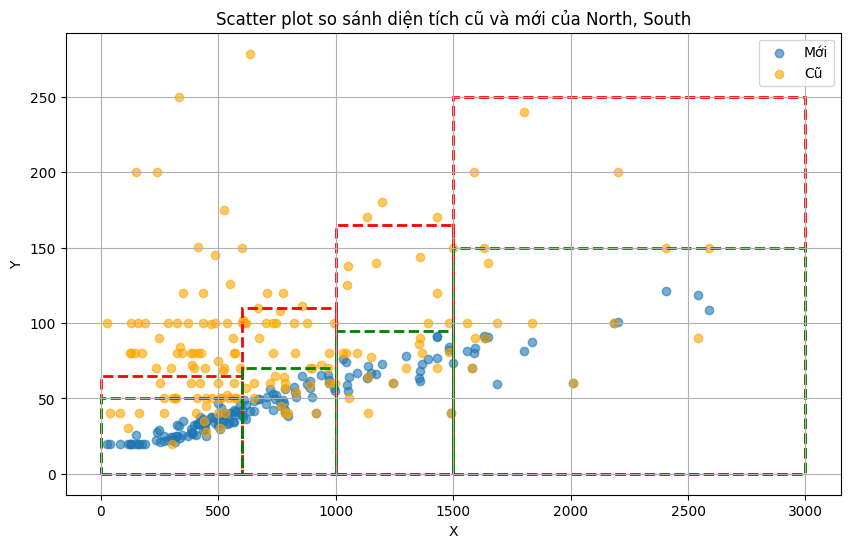

In [ ]:


# Giả sử reference chứa các cột X, Y, Y_old và Region
# Ép kiểu dữ liệu
reference['X'] = pd.to_numeric(reference['X'], errors='coerce')
reference['Y'] = pd.to_numeric(reference['Y'], errors='coerce')
reference['Y_old'] = pd.to_numeric(reference['Y_old'], errors='coerce')
reference['Y_past'] = pd.to_numeric(reference['Y_past'], errors='coerce')

# Lọc dữ liệu chỉ lấy Region là 'South' và X từ 0 đến 3000
south_data = reference[((reference['Region'] == 'South') | (reference['Region'] == 'North'))& (reference['X'] >= 0) & (reference['X'] <= 3000)& (reference['Y_old'] <= 300)]
# Scatter plot cho dữ liệu vùng South
X_south = south_data['X'].values.reshape(-1, 1)
Y_south = south_data['Y'].values
Y_old = south_data['Y_old'].values  # Lấy dữ liệu Y_old
Y_past = south_data['Y_past'].values  # Lấy dữ liệu Y_old

# Tạo mô hình hồi quy tuyến tính cho South
model_south = LinearRegression()
model_south.fit(X_south, Y_south)
X_range = np.linspace(X_south.min(), X_south.max(), 100).reshape(-1, 1)
Y_pred_south = model_south.predict(X_range)

# Vẽ scatter plot và đường hồi quy
plt.figure(figsize=(10, 6))
plt.scatter(X_south, Y_south, label="Mới", alpha=0.6)

# Vẽ scatter plot cho Y_old
plt.scatter(X_south, Y_old, label="Cũ", alpha=0.6, color='orange')

# Vẽ scatter plot cho Y_old
# plt.scatter(X_south, Y_past, label="Past", alpha=0.6, color='pink')
# Đường hồi quy tuyến tính
# plt.plot(X_range, Y_pred_south, color='red', label=f"Regression line\nY = {model_south.coef_[0]:.2f}X + {model_south.intercept_:.2f}")

# Thêm đường thẳng Y = 0.03X + 35 cho vùng South
Y_line = 0.03 * X_range + 35
# plt.plot(X_range, Y_line, color='blue', linestyle='--', label="Line: Y = 0.03X + 35")

# Định nghĩa các hình chữ nhật
rectangles = [
    {"X_min": 0, "X_max": 600, "Y_min": 20, "Y_max": 50},
    {"X_min": 600, "X_max": 1000, "Y_min": 50, "Y_max": 70},
    {"X_min": 1000, "X_max": 1500, "Y_min": 70, "Y_max": 95},
    {"X_min": 1500, "X_max": 3000, "Y_min": 95, "Y_max": 150},
]

# Định nghĩa các hình chữ nhật
rectangles = [
    {"X_min": 0, "X_max": 600, "Y_min": 0, "Y_max": 50},
    {"X_min": 600, "X_max": 1000, "Y_min": 0, "Y_max": 70},
    {"X_min": 1000, "X_max": 1500, "Y_min": 0, "Y_max": 95},
    {"X_min": 1500, "X_max": 3000, "Y_min": 0, "Y_max": 150},
]

rectangles_old = [
    {"X_min": 0, "X_max": 600, "Y_min": 0, "Y_max": 65},
    {"X_min": 600, "X_max": 1000, "Y_min": 0, "Y_max": 110},
    {"X_min": 1000, "X_max": 1500, "Y_min": 0, "Y_max": 165},
    {"X_min": 1500, "X_max": 3000, "Y_min": 0, "Y_max": 250},
]

# # Vẽ các hình chữ nhật lên đồ thị

for rect in rectangles_old:
    rectangle = Rectangle(
        (rect['X_min'], rect['Y_min']),
        rect['X_max'] - rect['X_min'],
        rect['Y_max'] - rect['Y_min'],
        linewidth=2, edgecolor='red', facecolor='none', linestyle='--'
    )
    plt.gca().add_patch(rectangle)

for rect in rectangles:
    rectangle = Rectangle(
        (rect['X_min'], rect['Y_min']),
        rect['X_max'] - rect['X_min'],
        rect['Y_max'] - rect['Y_min'],
        linewidth=2, edgecolor='green', facecolor='none', linestyle='--'
    )
    plt.gca().add_patch(rectangle)

# Tùy chỉnh đồ thị
plt.title("Scatter plot so sánh diện tích cũ và mới của North, South")
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.grid(True)

# Hiển thị đồ thị
plt.show()


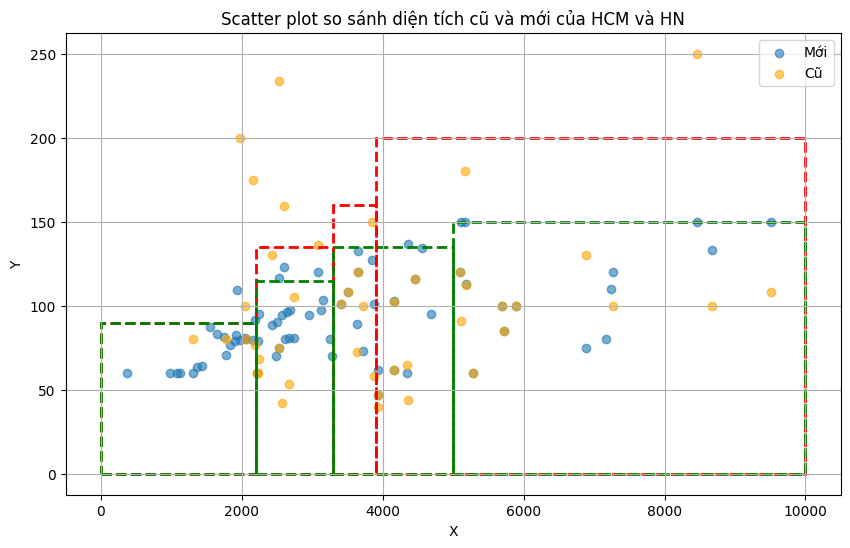

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np
from matplotlib.patches import Rectangle

# Giả sử reference chứa các cột X, Y, Y_old và Region
# Ép kiểu dữ liệu
reference['X'] = pd.to_numeric(reference['X'], errors='coerce')
reference['Y'] = pd.to_numeric(reference['Y'], errors='coerce')
reference['Y_old'] = pd.to_numeric(reference['Y_old'], errors='coerce')
reference['Y_past'] = pd.to_numeric(reference['Y_past'], errors='coerce')

# Lọc dữ liệu chỉ lấy Region là 'South' và X từ 0 đến 3000
south_data = reference[((reference['Region'] == 'HCM') | (reference['Region'] == 'HN'))& (reference['X'] >= 0) & (reference['X'] <= 20000)]
# Scatter plot cho dữ liệu vùng South
X_south = south_data['X'].values.reshape(-1, 1)
Y_south = south_data['Y'].values
Y_old = south_data['Y_old'].values  # Lấy dữ liệu Y_old
Y_past= south_data['Y_past'].values

# Tạo mô hình hồi quy tuyến tính cho South
model_south = LinearRegression()
model_south.fit(X_south, Y_south)
X_range = np.linspace(X_south.min(), X_south.max(), 100).reshape(-1, 1)
Y_pred_south = model_south.predict(X_range)

# Vẽ scatter plot và đường hồi quy
plt.figure(figsize=(10, 6))
plt.scatter(X_south, Y_south, label="Mới", alpha=0.6)

# Vẽ scatter plot cho Y_old
plt.scatter(X_south, Y_old, label="Cũ", alpha=0.6, color='orange')

# Vẽ scatter plot cho Y_Past
# plt.scatter(X_south, Y_past, label="Past", alpha=0.6, color='red')

# Định nghĩa các hình chữ nhật
rectangles = [
    {"X_min": 0, "X_max": 2200, "Y_min": 0, "Y_max": 90},
    {"X_min": 2200, "X_max": 3300, "Y_min": 0, "Y_max": 115},
    {"X_min": 3300, "X_max": 5000, "Y_min": 0, "Y_max": 135},
    {"X_min": 5000, "X_max": 10000, "Y_min": 0, "Y_max": 150},
]

rectangles_old = [
    {"X_min": 0, "X_max": 2200, "Y_min": 0, "Y_max": 90},
    {"X_min": 2200, "X_max": 3300, "Y_min": 0, "Y_max": 135},
    {"X_min": 3300, "X_max": 3900, "Y_min": 0, "Y_max": 160},
    {"X_min": 3900, "X_max": 10000, "Y_min": 0, "Y_max": 200},
]

# Vẽ các hình chữ nhật lên đồ thị

for rect in rectangles_old:
    rectangle = Rectangle(
        (rect['X_min'], rect['Y_min']),
        rect['X_max'] - rect['X_min'],
        rect['Y_max'] - rect['Y_min'],
        linewidth=2, edgecolor='red', facecolor='none', linestyle='--'
    )
    plt.gca().add_patch(rectangle)
for rect in rectangles:
    rectangle = Rectangle(
        (rect['X_min'], rect['Y_min']),
        rect['X_max'] - rect['X_min'],
        rect['Y_max'] - rect['Y_min'],
        linewidth=2, edgecolor='green', facecolor='none', linestyle='--'
    )
    plt.gca().add_patch(rectangle)


# Tùy chỉnh đồ thị
plt.title("Scatter plot so sánh diện tích cũ và mới của HCM và HN")
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.grid(True)

# Hiển thị đồ thị
plt.show()


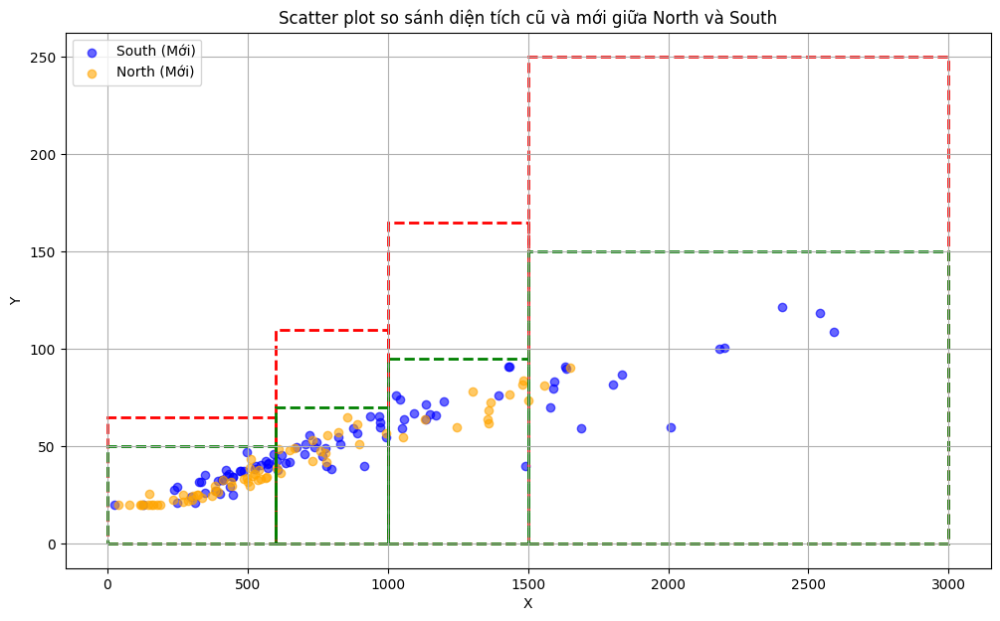

In [ ]:


# Giả sử reference chứa các cột X, Y, Y_old và Region
# Ép kiểu dữ liệu
reference['X'] = pd.to_numeric(reference['X'], errors='coerce')
reference['Y'] = pd.to_numeric(reference['Y'], errors='coerce')
reference['Y_old'] = pd.to_numeric(reference['Y_old'], errors='coerce')

# Lọc dữ liệu chỉ lấy Region là 'South' hoặc 'North' và các điều kiện bổ sung
data_filtered = reference[
    ((reference['Region'] == 'South') | (reference['Region'] == 'North')) &
    (reference['X'] >= 0) & (reference['X'] <= 3000) &
    (reference['Y_old'] <= 300)
]

# Lọc riêng từng vùng
south_data = data_filtered[data_filtered['Region'] == 'South']
north_data = data_filtered[data_filtered['Region'] == 'North']

# Scatter plot cho dữ liệu vùng South
X_south = south_data['X']
Y_south = south_data['Y']
Y_old_south = south_data['Y_old']

# Scatter plot cho dữ liệu vùng North
X_north = north_data['X']
Y_north = north_data['Y']
Y_old_north = north_data['Y_old']

# Tạo mô hình hồi quy tuyến tính cho South
model_south = LinearRegression()
model_south.fit(X_south.values.reshape(-1, 1), Y_south)
X_range = np.linspace(X_south.min(), X_south.max(), 100).reshape(-1, 1)
Y_pred_south = model_south.predict(X_range)

# Vẽ scatter plot và đường hồi quy
plt.figure(figsize=(12, 7))

# Scatter plot cho South
plt.scatter(X_south, Y_south, label="South (Mới)", color='blue', alpha=0.6)
# plt.scatter(X_south, Y_old_south, label="South (Cũ)", color='lightblue', alpha=0.6)

# Scatter plot cho North
plt.scatter(X_north, Y_north, label="North (Mới)", color='orange', alpha=0.6)
# plt.scatter(X_north, Y_old_north, label="North (Cũ)", color='yellow', alpha=0.6)



# Định nghĩa các hình chữ nhật
rectangles = [
    {"X_min": 0, "X_max": 600, "Y_min": 0, "Y_max": 50},
    {"X_min": 600, "X_max": 1000, "Y_min": 0, "Y_max": 70},
    {"X_min": 1000, "X_max": 1500, "Y_min": 0, "Y_max": 95},
    {"X_min": 1500, "X_max": 3000, "Y_min": 0, "Y_max": 150},
]

rectangles_old = [
    {"X_min": 0, "X_max": 600, "Y_min": 0, "Y_max": 65},
    {"X_min": 600, "X_max": 1000, "Y_min": 0, "Y_max": 110},
    {"X_min": 1000, "X_max": 1500, "Y_min": 0, "Y_max": 165},
    {"X_min": 1500, "X_max": 3000, "Y_min": 0, "Y_max": 250},
]

# Vẽ các hình chữ nhật lên đồ thị

for rect in rectangles_old:
    rectangle = Rectangle(
        (rect['X_min'], rect['Y_min']),
        rect['X_max'] - rect['X_min'],
        rect['Y_max'] - rect['Y_min'],
        linewidth=2, edgecolor='red', facecolor='none', linestyle='--'
    )
    plt.gca().add_patch(rectangle)

for rect in rectangles:
    rectangle = Rectangle(
        (rect['X_min'], rect['Y_min']),
        rect['X_max'] - rect['X_min'],
        rect['Y_max'] - rect['Y_min'],
        linewidth=2, edgecolor='green', facecolor='none', linestyle='--'
    )
    plt.gca().add_patch(rectangle)


# Tùy chỉnh đồ thị
plt.title("Scatter plot so sánh diện tích cũ và mới giữa North và South")
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.grid(True)

# Hiển thị đồ thị
plt.show()


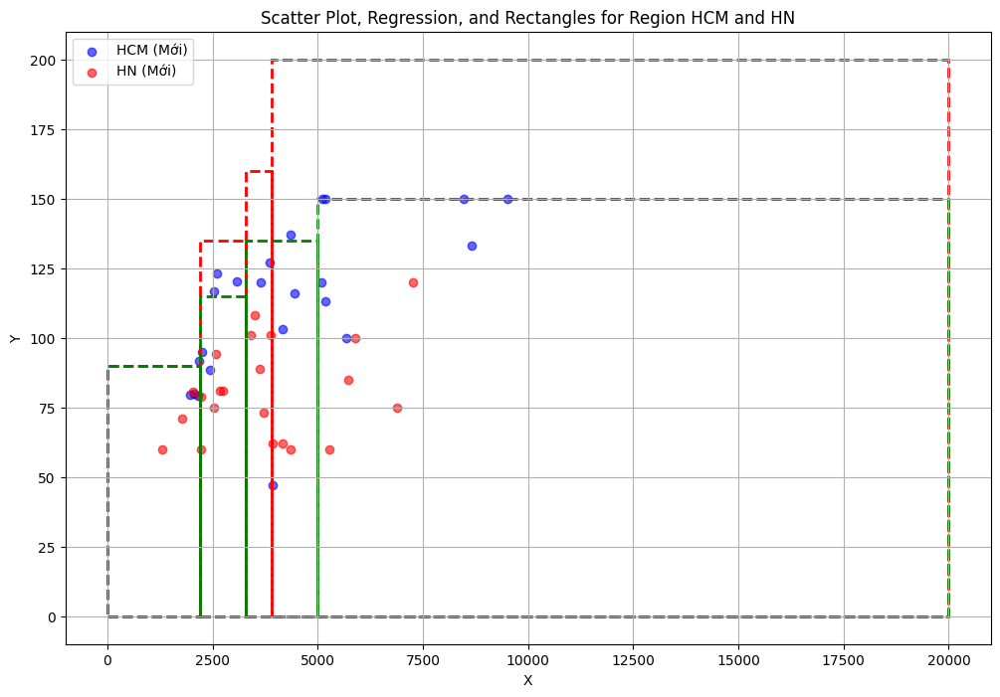

In [ ]:


# Giả sử reference chứa các cột X, Y, Y_old và Region
# Ép kiểu dữ liệu
reference['X'] = pd.to_numeric(reference['X'], errors='coerce')
reference['Y'] = pd.to_numeric(reference['Y'], errors='coerce')
reference['Y_old'] = pd.to_numeric(reference['Y_old'], errors='coerce')

# Lọc dữ liệu chỉ lấy Region là 'HN' hoặc 'HCM' và các điều kiện bổ sung
HCM_HN_data = reference[
    ((reference['Region'] == 'HN') | (reference['Region'] == 'HCM')) &
    (reference['X'] >= 0) & (reference['X'] <= 30000) &
    (reference['Y_old'] <= 3000)
]

# Lọc riêng từng vùng
HCM_data = HCM_HN_data[HCM_HN_data['Region'] == 'HCM']
HN_data = HCM_HN_data[HCM_HN_data['Region'] == 'HN']

# Scatter plot cho dữ liệu vùng HCM
X_HCM = HCM_data['X']
Y_HCM = HCM_data['Y']
Y_old_HCM = HCM_data['Y_old']

# Scatter plot cho dữ liệu vùng HN
X_HN = HN_data['X']
Y_HN = HN_data['Y']
Y_old_HN = HN_data['Y_old']

# Tạo mô hình hồi quy tuyến tính cho HCM
model_HCM = LinearRegression()
model_HCM.fit(X_HCM.values.reshape(-1, 1), Y_HCM)
X_range_HCM = np.linspace(X_HCM.min(), X_HCM.max(), 100).reshape(-1, 1)
Y_pred_HCM = model_HCM.predict(X_range_HCM)

# Tạo mô hình hồi quy tuyến tính cho HN
model_HN = LinearRegression()
model_HN.fit(X_HN.values.reshape(-1, 1), Y_HN)
X_range_HN = np.linspace(X_HN.min(), X_HN.max(), 100).reshape(-1, 1)
Y_pred_HN = model_HN.predict(X_range_HN)

# Vẽ scatter plot và đường hồi quy
plt.figure(figsize=(12, 8))

# Scatter plot cho HCM
plt.scatter(X_HCM, Y_HCM, label="HCM (Mới)", color='blue', alpha=0.6)
# plt.scatter(X_HCM, Y_old_HCM, label="HCM (Cũ)", color='lightblue', alpha=0.6)

# Scatter plot cho HN
plt.scatter(X_HN, Y_HN, label="HN (Mới)", color='red', alpha=0.6)
# plt.scatter(X_HN, Y_old_HN, label="HN (Cũ)", color='pink', alpha=0.6)


# Định nghĩa các hình chữ nhật
rectangles = [
    {"X_min": 0, "X_max": 2200, "Y_min": 0, "Y_max": 90},
    {"X_min": 2200, "X_max": 3300, "Y_min": 0, "Y_max": 115},
    {"X_min": 3300, "X_max": 5000, "Y_min": 0, "Y_max": 135},
    {"X_min": 5000, "X_max": 20000, "Y_min": 0, "Y_max": 150},
]

rectangles_old = [
    {"X_min": 0, "X_max": 2200, "Y_min": 0, "Y_max": 90},
    {"X_min": 2200, "X_max": 3300, "Y_min": 0, "Y_max": 135},
    {"X_min": 3300, "X_max": 3900, "Y_min": 0, "Y_max": 160},
    {"X_min": 3900, "X_max": 20000, "Y_min": 0, "Y_max": 200},
]

# Vẽ các hình chữ nhật lên đồ thị

for rect in rectangles_old:
    rectangle = Rectangle(
        (rect['X_min'], rect['Y_min']),
        rect['X_max'] - rect['X_min'],
        rect['Y_max'] - rect['Y_min'],
        linewidth=2, edgecolor='red', facecolor='none', linestyle='--'
    )
    plt.gca().add_patch(rectangle)
for rect in rectangles:
    rectangle = Rectangle(
        (rect['X_min'], rect['Y_min']),
        rect['X_max'] - rect['X_min'],
        rect['Y_max'] - rect['Y_min'],
        linewidth=2, edgecolor='green', facecolor='none', linestyle='--'
    )
    plt.gca().add_patch(rectangle)

# Tùy chỉnh đồ thị
plt.title("Scatter Plot, Regression, and Rectangles for Region HCM and HN")
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.grid(True)

# Hiển thị đồ thị
plt.show()


In [ ]:
import pandas as pd

# Giả sử reference chứa các cột X, Y, Region
# Ép kiểu dữ liệu
reference['X'] = pd.to_numeric(reference['X'], errors='coerce')
reference['Y'] = pd.to_numeric(reference['Y'], errors='coerce')

# Lọc dữ liệu chỉ lấy region là 'South'
south_data = reference[reference['Region'] == 'South']

# Tổng số điểm trong Region 'South'
total_points_south = len(south_data)

# Định nghĩa các hình chữ nhật
rectangles = [
    {"X_min": 0, "X_max": 600, "Y_min": 20, "Y_max": 65},
    {"X_min": 600, "X_max": 1000, "Y_min": 65, "Y_max": 110},
    {"X_min": 1000, "X_max": 1500, "Y_min": 110, "Y_max": 150},
    {"X_min": 1500, "X_max": 3000, "Y_min": 150, "Y_max": 220},
]

# Hàm kiểm tra điểm trong hình chữ nhật
def count_points_in_rectangle(data, rect):
    return data[
        (data['X'] >= rect['X_min']) & (data['X'] <= rect['X_max']) &
        (data['Y'] >= rect['Y_min']) & (data['Y'] <= rect['Y_max'])
    ]

# Đếm số điểm trong mỗi hình chữ nhật
results = []
for i, rect in enumerate(rectangles):
    points_in_rect = count_points_in_rectangle(south_data, rect)
    points_count = len(points_in_rect)
    ratio = points_count / total_points_south if total_points_south > 0 else 0  # Tỉ lệ gom nhóm

    results.append({
        "Rectangle": f"Rect {i+1}",
        "X Range": f"{rect['X_min']} - {rect['X_max']}",
        "Y Range": f"{rect['Y_min']} - {rect['Y_max']}",
        "Points Count": points_count,
        "Ratio": f"{ratio:.2%}",  # Tỉ lệ gom nhóm dưới dạng phần trăm
        "Data": points_in_rect,  # Lưu lại điểm trong vùng này nếu cần xử lý thêm
    })

# Hiển thị kết quả
results_df = pd.DataFrame(results)
print(results_df[['Rectangle', 'X Range', 'Y Range', 'Points Count', 'Ratio']])

# Tổng số điểm trong Region 'South'
print(f"Tổng số điểm trong Region 'South': {total_points_south}")
# Tổng số điểm nằm trong các hình chữ nhật
total_points_in = results_df['Points Count'].sum()
print(f"Tổng số điểm chính xác 'South': {total_points_in}")
print(f"Tỉ lệ chính xác': {total_points_in/total_points_south}")


  Rectangle      X Range    Y Range  Points Count   Ratio
0    Rect 1      0 - 600    20 - 65            94  48.21%
1    Rect 2   600 - 1000   65 - 110             3   1.54%
2    Rect 3  1000 - 1500  110 - 150             0   0.00%
3    Rect 4  1500 - 3000  150 - 220             0   0.00%
Tổng số điểm trong Region 'South': 195
Tổng số điểm chính xác 'South': 97
Tỉ lệ chính xác': 0.49743589743589745


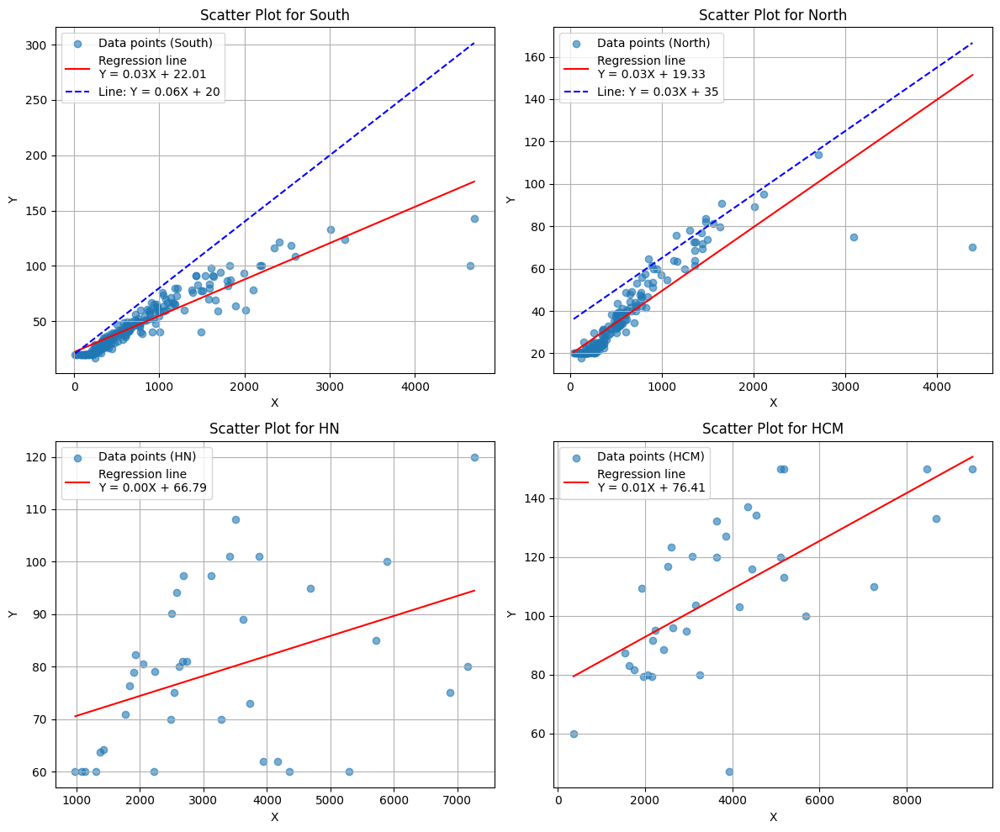

In [ ]:


# Giả sử reference có các cột: X, Y, Region
# Ép kiểu dữ liệu
reference['X'] = pd.to_numeric(reference['X'], errors='coerce')
reference['Y'] = pd.to_numeric(reference['Y'], errors='coerce')

# Loại bỏ các giá trị NaN nếu có
reference.dropna(subset=['X', 'Y', 'Region'], inplace=True)

# Lấy danh sách các Region
regions = reference['Region'].unique()

# Tạo subplot 2x2
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for i, region in enumerate(regions):
    # Lọc dữ liệu theo Region
    region_data = reference[reference['Region'] == region]
    X = region_data['X'].values.reshape(-1, 1)
    Y = region_data['Y'].values

    # Vẽ scatter plot
    axes[i].scatter(X, Y, label=f"Data points ({region})", alpha=0.6)

    # Hồi quy tuyến tính
    model = LinearRegression()
    model.fit(X, Y)
    X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
    Y_pred = model.predict(X_range)

    # Vẽ đường hồi quy
    axes[i].plot(X_range, Y_pred, color='red', label=f"Regression line\nY = {model.coef_[0]:.2f}X + {model.intercept_:.2f}")

    # Thêm đường line `0.03X + 35` cho `North` và `South`
    if region in ['South']:
        Y_given = 0.06 * X_range + 20
        axes[i].plot(X_range, Y_given, color='blue', linestyle='--', label="Line: Y = 0.06X + 20")
    if region in ['North']:
        Y_given = 0.03 * X_range + 35
        axes[i].plot(X_range, Y_given, color='blue', linestyle='--', label="Line: Y = 0.03X + 35")
    # Tùy chỉnh đồ thị
    axes[i].set_title(f"Scatter Plot for {region}")
    axes[i].set_xlabel("X")
    axes[i].set_ylabel("Y")
    axes[i].legend()
    axes[i].grid(True)

# Ẩn các ô subplot trống (nếu có)
for j in range(len(regions), len(axes)):
    fig.delaxes(axes[j])

# Tăng khoảng cách giữa các subplot
plt.tight_layout()

# Hiển thị đồ thị
plt.show()


In [ ]:
reference

,Region,X,Y,Y_old,Y_past
0,South,635,43.5,NaN,100.0
1,South,570,41.1,50.0,75.0
2,South,386,36.5,NaN,60.0
3,South,363,31.1,NaN,52.0
4,South,395,32.3,NaN,146.0
...,...,...,...,...,...
440,HN,1367,63.7,NaN,88.0
441,HN,1832,76.4,NaN,0.0
442,HCM,1928,109.4,NaN,0.0
443,HCM,3646,132.3,NaN,200.0


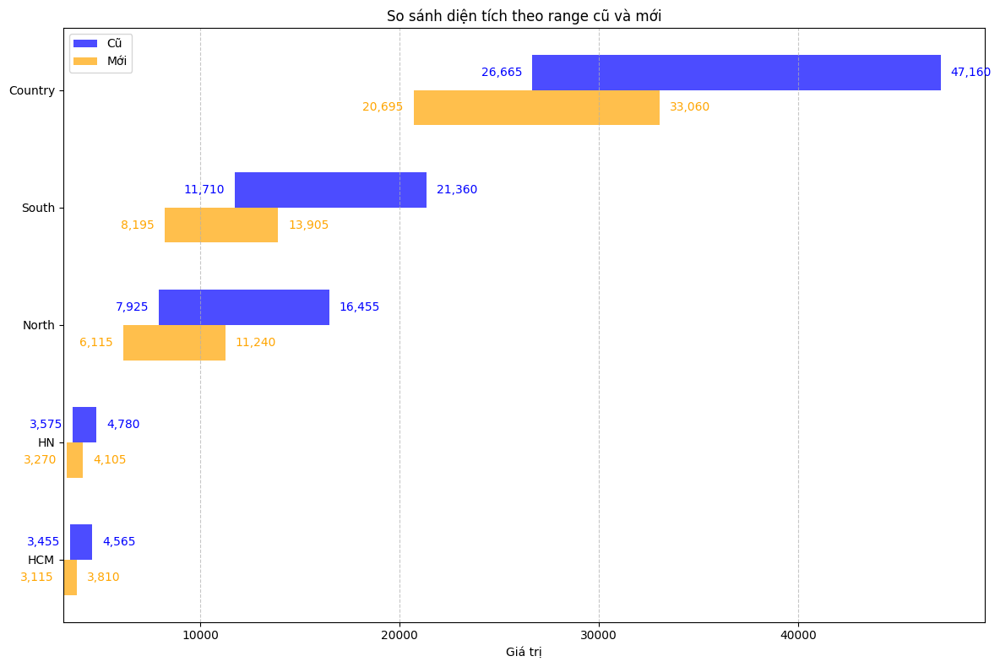

In [ ]:


# Re-importing necessary libraries due to reset
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1UrrQCljZxWn-QR-p1P6Kgxu75i3qZY9OBn28eAY1c7w')
wks = spr.worksheet("Plot")
# Lấy dữ liệu từ range AA6:AB447
data_S = wks.get('G1:K6')
data_C = wks.get('G8:K13')

# Chuyển đổi dữ liệu sang DataFrame
reference_S = pd.DataFrame(data_S[1:] , columns=data_S[0])
reference_C = pd.DataFrame(data_C[1:] , columns=data_C[0])



# Dữ liệu đầu vào
data = reference_S

# Tạo DataFrame và xử lý dữ liệu
df = pd.DataFrame(data)
df.iloc[:, 1:] = df.iloc[:, 1:].replace(",", "", regex=True).astype(int)  # Loại bỏ dấu phẩy và chuyển sang số nguyên

# Chuẩn bị dữ liệu cho biểu đồ
regions = df["Region"]
min_cu = df["min_cũ"]
max_cu = df["Max_cũ"]
min_moi = df["Min_mới"]
max_moi = df["Max_Mới"]

ranges_cu = max_cu - min_cu
ranges_moi = max_moi - min_moi

# Tạo biểu đồ
plt.figure(figsize=(12, 8))
y_positions = np.arange(len(regions))  # Vị trí cho từng region
bar_height = 0.3

# Vẽ stacked bar cho dòng "Cũ" ở trên
bars_cu = plt.barh(
    y_positions + bar_height / 2, ranges_cu, left=min_cu,
    height=bar_height, color='blue', alpha=0.7, label='Cũ'
)

# Vẽ stacked bar cho dòng "Mới" ở dưới
bars_moi = plt.barh(
    y_positions - bar_height / 2, ranges_moi, left=min_moi,
    height=bar_height, color='orange', alpha=0.7, label='Mới'
)

# Hiển thị giá trị min và max trên thanh
for i, bar in enumerate(bars_cu):
    plt.text(min_cu[i] - 500, bar.get_y() + bar.get_height() / 2, f"{min_cu[i]:,}",
             va='center', ha='right', color='blue', fontsize=10)
    plt.text(max_cu[i] + 500, bar.get_y() + bar.get_height() / 2, f"{max_cu[i]:,}",
             va='center', ha='left', color='blue', fontsize=10)

for i, bar in enumerate(bars_moi):
    plt.text(min_moi[i] - 500, bar.get_y() + bar.get_height() / 2, f"{min_moi[i]:,}",
             va='center', ha='right', color='orange', fontsize=10)
    plt.text(max_moi[i] + 500, bar.get_y() + bar.get_height() / 2, f"{max_moi[i]:,}",
             va='center', ha='left', color='orange', fontsize=10)

# Tùy chỉnh trục và nhãn
plt.yticks(y_positions, regions)
plt.xlabel('Giá trị')
plt.title('So sánh diện tích theo range cũ và mới')
plt.legend()

# Thêm lưới và hiển thị đồ thị
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


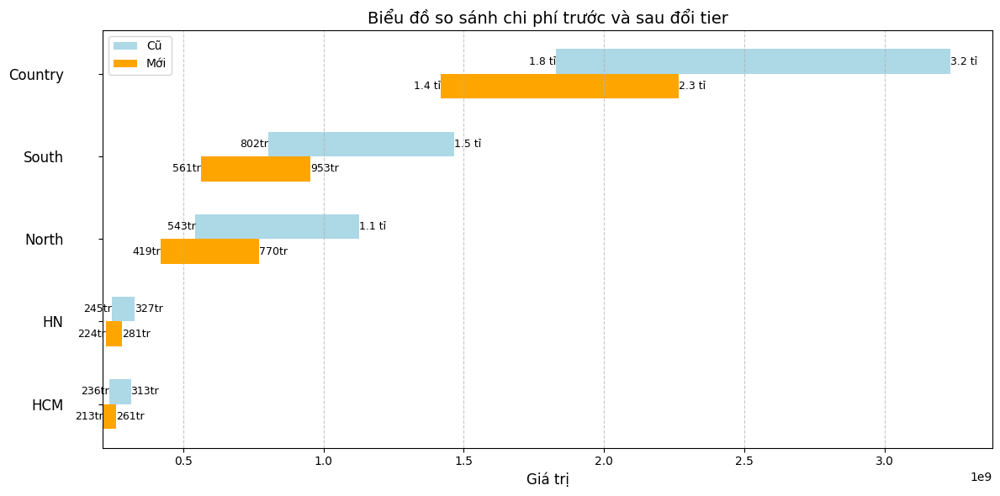

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Dữ liệu đầu vào
data = reference_C

# Chuyển đổi dữ liệu
df = pd.DataFrame(data)
for col in ["min_cũ", "Max_cũ", "Min_mới", "Max_Mới"]:
    df[col] = df[col].astype(str).str.replace(",", "").astype(float)

# Hàm định dạng giá trị
def format_currency(value):
    if value >= 1e9:  # Trên 1 tỉ
        return f"{value / 1e9:.1f} tỉ"
    elif value >= 1e6:  # Trên 1 triệu
        return f"{int(value / 1e6)}tr"
    else:
        return f"{int(value):,}"

# Vẽ biểu đồ
fig, ax = plt.subplots(figsize=(12, 6))

y_positions = np.arange(len(df)) * 2  # Khoảng cách giữa các thanh
bar_height = 0.6

for i, row in df.iterrows():
    # Giá trị cũ
    ax.barh(
        y_positions[i] + bar_height / 2,
        row["Max_cũ"] - row["min_cũ"],
        left=row["min_cũ"],
        height=bar_height,
        color="lightblue",
        label="Cũ" if i == 0 else None,
    )
    ax.text(
        row["min_cũ"],
        y_positions[i] + bar_height / 2,
        format_currency(row["min_cũ"]),
        va="center",
        ha="right",
        fontsize=9,
    )
    ax.text(
        row["Max_cũ"],
        y_positions[i] + bar_height / 2,
        format_currency(row["Max_cũ"]),
        va="center",
        ha="left",
        fontsize=9,
    )

    # Giá trị mới
    ax.barh(
        y_positions[i] - bar_height / 2,
        row["Max_Mới"] - row["Min_mới"],
        left=row["Min_mới"],
        height=bar_height,
        color="orange",
        label="Mới" if i == 0 else None,
    )
    ax.text(
        row["Min_mới"],
        y_positions[i] - bar_height / 2,
        format_currency(row["Min_mới"]),
        va="center",
        ha="right",
        fontsize=9,
    )
    ax.text(
        row["Max_Mới"],
        y_positions[i] - bar_height / 2,
        format_currency(row["Max_Mới"]),
        va="center",
        ha="left",
        fontsize=9,
    )

# Tùy chỉnh trục y
ax.set_yticks(y_positions)
ax.set_yticklabels(df["Region"], fontsize=12, ha='right')  # Tăng font và căn phải
ax.tick_params(axis="y", pad=30)  # Tăng khoảng cách giữa nhãn và trục y
ax.set_xlabel("Giá trị", fontsize=12)
ax.set_title("Biểu đồ so sánh chi phí trước và sau đổi tier", fontsize=14)
ax.legend(fontsize=10)

plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


# Rider prod


In [ ]:
import pandas as pd

# Đọc sheet "Pivot" từ file Excel
df = pd.read_excel("/content/Prod_Python.xlsx", sheet_name="Pivot", usecols="A:M")
df_distance = pd.read_excel("/content/Prod_Python.xlsx", sheet_name="Dis", usecols="A:H")
# Hiển thị 5 dòng đầu tiên của dataframe
df.head()


,Delivery Success Datetime (Day),Sub_region,Region,Province,OPS Group,Dest hub name,Rider Name,Prod,StartHour,EndHour,Dis/Vol,Thời gian làm việc,Prod/hour
0,1-Dec,Bắc Trung Bộ,North,Hà Tĩnh,OP2,HAT - Ky Anh - NOR - SUB 2,606-NEXT-HD THACH1,18,10,12,26.600000,2,9.000
1,1-Dec,Bắc Trung Bộ,North,Hà Tĩnh,OP2,HAT - Ky Anh - NOR - SUB 2,606-NEXT-TN HOANG,11,8,13,20.654545,5,2.200
2,1-Dec,Bắc Trung Bộ,North,Nghệ An,OP1,NGA - Nghe An - NOR,281-NEXT-TH NGAN,26,8,12,1.400000,4,6.500
3,1-Dec,Bắc Trung Bộ,North,Nghệ An,OP1,NGA - Nghe An - NOR,281-NEXT-TV Doan,31,10,18,6.690323,8,3.875
4,1-Dec,Bắc Trung Bộ,North,Nghệ An,OP2,NGA - Hung Nguyen - NOR - SUB 2,103924-NEXT-PTT LINH,2,11,12,6.700000,1,2.000


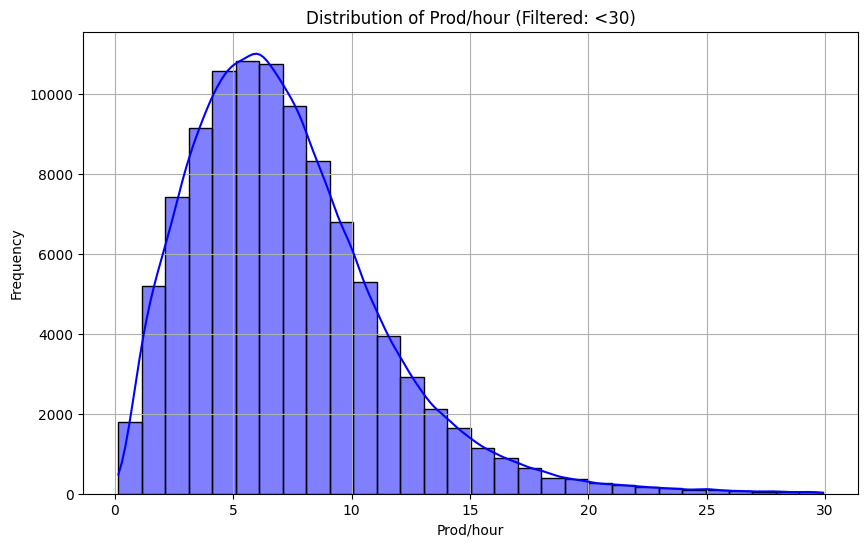

In [ ]:
# Convert necessary columns to numeric
df["Prod/hour"] = pd.to_numeric(df["Prod/hour"], errors="coerce")
df["Dis/Vol"] = pd.to_numeric(df["Dis/Vol"], errors="coerce")

# Filter data where Prod/hour < 30
df_filtered = df[df["Prod/hour"] < 30]

# Plot histogram
plt.figure(figsize=(10, 6))
sns.histplot(df_filtered["Prod/hour"], bins=30, kde=True, color="blue")

# Customize plot
plt.title("Distribution of Prod/hour (Filtered: <30)")
plt.xlabel("Prod/hour")
plt.ylabel("Frequency")
plt.grid(True)

# Show plot
plt.show()

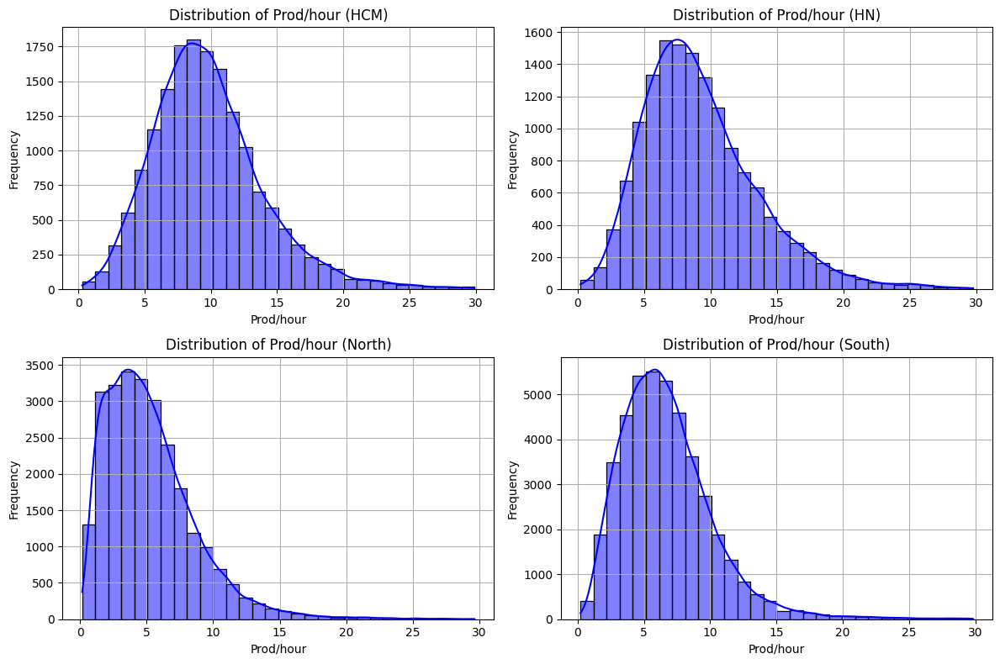

In [ ]:
# Convert "Prod/hour" column to numeric
df["Prod/hour"] = pd.to_numeric(df["Prod/hour"], errors="coerce")

# Filter out values where Prod/hour < 30
df_filtered = df[df["Prod/hour"] < 30]

# Define unique regions
regions = ["HCM", "HN", "North", "South"]

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # 2 rows, 2 cols

# Flatten axes for easy iteration
axes = axes.flatten()

# Loop through each region and plot histogram
for i, region in enumerate(regions):
    region_data = df_filtered[df_filtered["Region"] == region]

    # Plot histogram
    sns.histplot(region_data["Prod/hour"], bins=30, kde=True, color="blue", ax=axes[i])

    # Customize each subplot
    axes[i].set_title(f"Distribution of Prod/hour ({region})")
    axes[i].set_xlabel("Prod/hour")
    axes[i].set_ylabel("Frequency")
    axes[i].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
# Group by province
df_filtered = df[df["Region"] != "(blank)"]

# Function to calculate percentiles and 8-hour equivalent
def calculate_percentiles(groupby_col):
    percentiles = df_filtered.groupby(groupby_col)["Prod/hour"].quantile([0.25, 0.75]).unstack()
    percentiles.columns = ["P25", "P75"]
    percentiles["8Hour P25"] = percentiles["P25"] * 8
    percentiles["8Hour P75"] = percentiles["P75"] * 8

    # Round all values to 0 decimal places
    percentiles = percentiles.round(0)

    return percentiles

# Calculate percentiles for Province
province_percentiles = calculate_percentiles("Province")

# Group data from df_distance to calculate Dis/Vol
df_distance_grouped = df_distance.groupby("Province").agg({"Dis": "sum", "Vols": "sum"}).reset_index()
df_distance_grouped["Dis/Vol"] = df_distance_grouped["Dis"] / df_distance_grouped["Vols"]

# Merge with province_percentiles
province_final = province_percentiles.merge(df_distance_grouped[["Province", "Dis/Vol"]], on="Province", how="left")

# Display result
print(province_final)


             Province  P25   P75  8Hour P25  8Hour P75    Dis/Vol
0            An Giang  5.0   9.0       44.0       70.0  15.150768
1   Bà Rịa - Vũng Tàu  5.0   8.0       38.0       66.0   7.264369
2          Bình Dương  4.0   8.0       28.0       61.0   5.234011
3          Bình Phước  3.0   7.0       27.0       53.0  11.726283
4          Bình Thuận  6.0  10.0       45.0       84.0  14.869370
..                ...  ...   ...        ...        ...        ...
58            Đà Nẵng  6.0  10.0       46.0       76.0   4.574013
59            Đắk Lắk  3.0   8.0       24.0       60.0  10.719464
60           Đắk Nông  2.0   5.0       19.0       42.0  16.507053
61           Đồng Nai  5.0   9.0       37.0       69.0   9.945878
62          Đồng Tháp  6.0  10.0       45.0       76.0  10.496908

[63 rows x 6 columns]


In [ ]:
# Group by province and OPs group
df_filtered = df[df["Region"] != "(blank)"]

# Function to calculate percentiles and 8-hour equivalent
def calculate_percentiles(groupby_cols):
    percentiles = df_filtered.groupby(groupby_cols)["Prod/hour"].quantile([0.25, 0.75]).unstack()
    percentiles.columns = ["P25", "P75"]
    percentiles["8Hour P25"] = percentiles["P25"] * 8
    percentiles["8Hour P75"] = percentiles["P75"] * 8
    # Round all values to 0 decimal places
    percentiles = percentiles

    return percentiles

# Calculate percentiles for Province & OPS Group
province_ops_percentiles = calculate_percentiles(["Province", "OPS Group"])

# Group data from df_distance to calculate Dis/Vol
df_distance_grouped = df_distance.groupby(["Province", "OPS Group"]).agg({"Dis": "sum", "Vols": "sum"}).reset_index()
df_distance_grouped["Dis/Vol"] = df_distance_grouped["Dis"] / df_distance_grouped["Vols"]

# Merge with province_ops_percentiles
province_ops_final = province_ops_percentiles.merge(df_distance_grouped[["Province", "OPS Group", "Dis/Vol"]],
                                                    on=["Province", "OPS Group"], how="left")

# Display result
print(province_ops_final)


              Province OPS Group       P25       P75  8Hour P25  8Hour P75  \
0             An Giang       OP1  6.000000  9.000000  48.000000  72.000000   
1             An Giang       OP2  5.666667  9.212500  45.333333  73.700000   
2             An Giang       OP3  4.350000  7.500000  34.800000  60.000000   
3    Bà Rịa - Vũng Tàu       OP1  5.222222  8.666667  41.777778  69.333333   
4    Bà Rịa - Vũng Tàu       OP2  4.333333  8.000000  34.666667  64.000000   
..                 ...       ...       ...       ...        ...        ...   
158           Đắk Nông       OP3  2.381250  5.228632  19.050000  41.829060   
159           Đồng Nai       OP1  5.000000  9.000000  40.000000  72.000000   
160           Đồng Nai       OP2  4.300000  8.000000  34.400000  64.000000   
161          Đồng Tháp       OP1  5.444444  9.428571  43.555556  75.428571   
162          Đồng Tháp       OP2  5.875000  9.500000  47.000000  76.000000   

       Dis/Vol  
0    10.909727  
1    21.396478  
2    17.5790

In [ ]:
# Group by Region and Dest hub name
df_filtered = df[df["Region"] != "(blank)"]

# Function to calculate percentiles and 8-hour equivalent
def calculate_percentiles(groupby_cols):
    percentiles = df_filtered.groupby(groupby_cols)["Prod/hour"].quantile([0.25, 0.75, 0.5]).unstack()
    percentiles.columns = ["P25", "P75", "P50"]
    percentiles["8Hour P25"] = percentiles["P25"] * 8
    percentiles["8Hour P75"] = percentiles["P75"] * 8
    percentiles["8Hour P50"] = percentiles["P50"] * 8

    return percentiles

# Calculate percentiles for Region & Dest hub name
hub_percentiles = calculate_percentiles(["Region", "Dest hub name"])

# Group data from df_distance to calculate Dis/Vol
df_distance_grouped = df_distance.groupby(["Region", "Dest hub name"]).agg({"Dis": "sum", "Vols": "sum"}).reset_index()
df_distance_grouped["Dis/Vol"] = df_distance_grouped["Dis"] / df_distance_grouped["Vols"]

# Merge with hub_percentiles
hub_final = hub_percentiles.merge(df_distance_grouped[["Region", "Dest hub name", "Dis/Vol"]],
                                  on=["Region", "Dest hub name"], how="left")

# Display result
print(hub_final)

spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1Y29-wRETJjxKfM2S-SSqlwTE1cGYYTimYLtKHzADrkI/edit?gid=0#gid=0') ## updated_data
wks = spr.worksheet('Định mức')

# Convert DataFrame to Google Sheets
df_hub_final = hub_final.reset_index()
set_with_dataframe(wks, df_hub_final, row=1, col=14, include_index=False, include_column_header=True)


    Region                  Dest hub name       P25        P75        P50  \
0      HCM  HCM - Binh Chanh 1 - SOU - DP  5.258929  10.000000   7.612500   
1      HCM  HCM - Binh Chanh 2 - SOU - DP  5.444444  10.250000   7.727273   
2      HCM  HCM - Binh Chanh 3 - SOU - DP  4.660714   7.160714   5.333333   
3      HCM  HCM - Binh Thanh 1 - SOU - DP  7.904167  13.000000  10.444444   
4      HCM  HCM - Binh Thanh 2 - SOU - DP  8.183333  13.866071  10.666667   
..     ...                            ...       ...        ...        ...   
615  South   VT - Long Dien - SOU - SUB 2  6.308036  11.000000   8.414286   
616  South      VT - Phu My - SOU - SUB 2  3.666667   7.411111   5.590278   
617  South   VT - Thang Nhi - SOU - SUB 2  4.700000   8.400000   6.333333   
618  South            VT - Vung Tau - SOU  5.708333   9.062500   7.125000   
619  South   VT - Xuyen Moc - SOU - SUB 2  6.285714   9.000000   7.555556   

     8Hour P25   8Hour P75  8Hour P50    Dis/Vol  
0    42.071429   80.0000

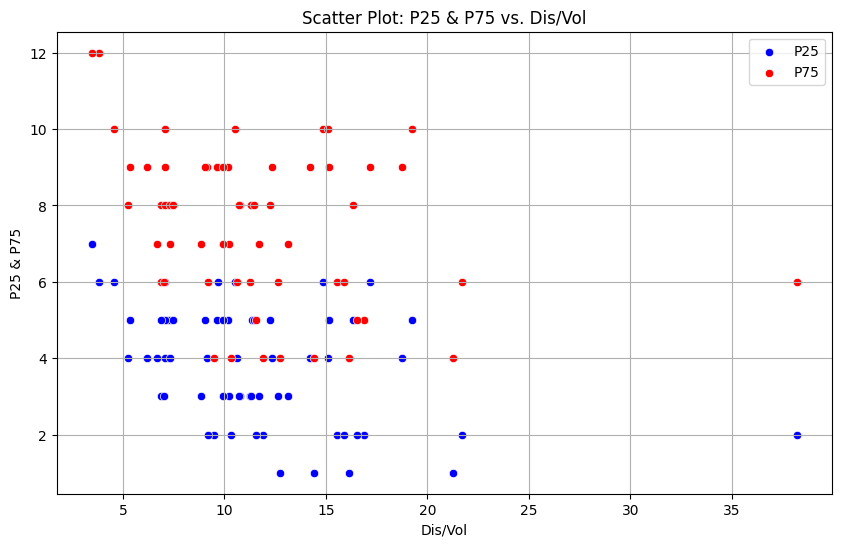

In [ ]:

# Tạo scatter plot
plt.figure(figsize=(10, 6))

# Vẽ P25
sns.scatterplot(data=province_final, x="Dis/Vol", y="P25", color="blue", label="P25")

# Vẽ P75
sns.scatterplot(data=province_final, x="Dis/Vol", y="P75", color="red", label="P75")

# Thêm tiêu đề và nhãn
plt.title("Scatter Plot: P25 & P75 vs. Dis/Vol")
plt.xlabel("Dis/Vol")
plt.ylabel("P25 & P75")
plt.legend()
plt.grid(True)

# Hiển thị biểu đồ
plt.show()



🔹 HỒI QUY TUYẾN TÍNH:
  🔹 P25: y = -0.1056x + 5.1459
  🔹 P75: y = -0.1231x + 8.6332

🔹 HỒI QUY PHI TUYẾN (1/x):
  🔹 P25: y = 9.7200/x + 2.7609
  🔹 P75: y = 12.4712/x + 5.7176

🔹 HỒI QUY PHI TUYẾN (EXPONENTIAL):
  🔹 P25: y = 5.6610 * exp(-0.0338 * x)
  🔹 P75: y = 9.0467 * exp(-0.0204 * x)


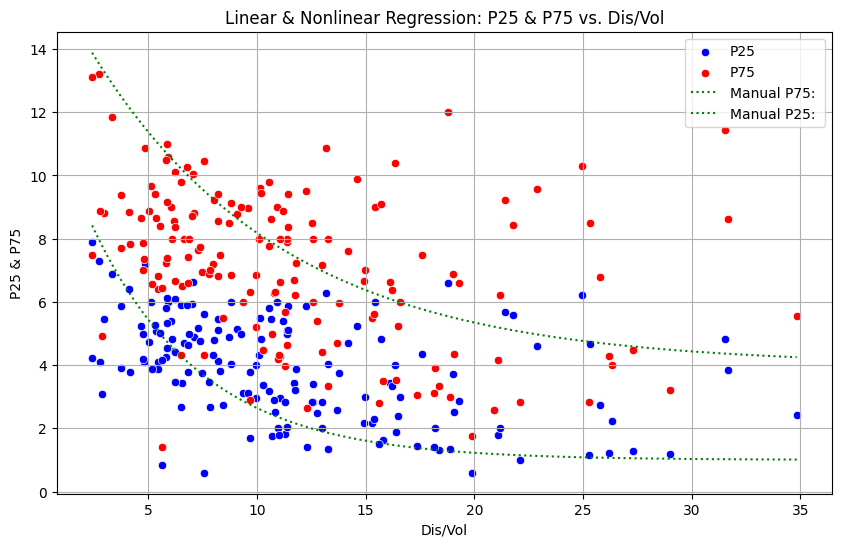

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit
from sklearn.linear_model import LinearRegression

# Hàm mô hình phi tuyến (1/x)
def inverse_function(x, a, b):
    return a / x + b

# Hàm mô hình hàm mũ (Exponential)
def exponential_function(x, a, b):
    return a * np.exp(b * x)

# Hàm mô hình tuyến tính (Exponential)
def linear_function(x, a, b):
    return a * x +b

def power_function(x, a, b,c):
    return a*(b)**(-x) + c

# Lọc dữ liệu để giới hạn X < 40 và Y < 20
filtered_data = province_ops_final[(province_ops_final["Dis/Vol"] < 40) & (province_ops_final["P75"] < 20)]

# Lấy giá trị X và Y
X = filtered_data["Dis/Vol"].values.reshape(-1, 1)  # Reshape để dùng LinearRegression
y_P25 = filtered_data["P25"].values
y_P75 = filtered_data["P75"].values

# Hồi quy tuyến tính
lin_reg_P25 = LinearRegression().fit(X, y_P25)
lin_reg_P75 = LinearRegression().fit(X, y_P75)

# Hệ số hồi quy tuyến tính
a_linear_P25, b_linear_P25 = lin_reg_P25.coef_[0], lin_reg_P25.intercept_
a_linear_P75, b_linear_P75 = lin_reg_P75.coef_[0], lin_reg_P75.intercept_

# Hồi quy phi tuyến (1/x)
params_P25_inv, _ = curve_fit(inverse_function, X.ravel(), y_P25)
params_P75_inv, _ = curve_fit(inverse_function, X.ravel(), y_P75)

# Hệ số hồi quy phi tuyến (1/x)
a_nonlinear_P25, b_nonlinear_P25 = params_P25_inv
a_nonlinear_P75, b_nonlinear_P75 = params_P75_inv

# Hồi quy phi tuyến (Exponential)
params_P25_exp, _ = curve_fit(exponential_function, X.ravel(), y_P25, p0=(1, -0.1))
params_P75_exp, _ = curve_fit(exponential_function, X.ravel(), y_P75, p0=(1, -0.1))

# Hệ số hồi quy hàm mũ (exp)
a_exp_P25, b_exp_P25 = params_P25_exp
a_exp_P75, b_exp_P75 = params_P75_exp



# Tạo giá trị X để vẽ đường hồi quy
X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)

# Dự đoán giá trị y từ mô hình hồi quy
y_pred_linear_P25 = lin_reg_P25.predict(X_range)
y_pred_linear_P75 = lin_reg_P75.predict(X_range)

y_pred_nonlinear_P25 = inverse_function(X_range.ravel(), *params_P25_inv)
y_pred_nonlinear_P75 = inverse_function(X_range.ravel(), *params_P75_inv)

y_pred_exp_P25 = exponential_function(X_range.ravel(), *params_P25_exp)
y_pred_exp_P75 = exponential_function(X_range.ravel(), *params_P75_exp)



# In kết quả hồi quy
print("\n🔹 HỒI QUY TUYẾN TÍNH:")
print(f"  🔹 P25: y = {a_linear_P25:.4f}x + {b_linear_P25:.4f}")
print(f"  🔹 P75: y = {a_linear_P75:.4f}x + {b_linear_P75:.4f}")

print("\n🔹 HỒI QUY PHI TUYẾN (1/x):")
print(f"  🔹 P25: y = {a_nonlinear_P25:.4f}/x + {b_nonlinear_P25:.4f}")
print(f"  🔹 P75: y = {a_nonlinear_P75:.4f}/x + {b_nonlinear_P75:.4f}")

print("\n🔹 HỒI QUY PHI TUYẾN (EXPONENTIAL):")
print(f"  🔹 P25: y = {a_exp_P25:.4f} * exp({b_exp_P25:.4f} * x)")
print(f"  🔹 P75: y = {a_exp_P75:.4f} * exp({b_exp_P75:.4f} * x)")

# print("\n🔹 HỒI QUY PHI TUYẾN (1/x) VỚI THÔNG SỐ NHẬP TAY:")
# print(f"  🔹 P25 & P75: y = {a_manual:.4f}/x + {b_manual:.4f}")

# Vẽ scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=filtered_data, x="Dis/Vol", y="P25", color="blue", label="P25")
sns.scatterplot(data=filtered_data, x="Dis/Vol", y="P75", color="red", label="P75")

# # Vẽ đường hồi quy tuyến tính
# plt.plot(X_range, y_pred_linear_P25, color="blue", linestyle="-", label="Linear Regression P25")
# plt.plot(X_range, y_pred_linear_P75, color="red", linestyle="-", label="Linear Regression P75")

# # Vẽ đường hồi quy phi tuyến (1/x)
# plt.plot(X_range, y_pred_nonlinear_P25, color="blue", linestyle="--", label="Nonlinear Regression P25 (1/x)")
# plt.plot(X_range, y_pred_nonlinear_P75, color="red", linestyle="--", label="Nonlinear Regression P75 (1/x)")

# # Vẽ đường hồi quy phi tuyến (Exponential)
# plt.plot(X_range, y_pred_exp_P25, color="blue", linestyle="-.", label="Exponential Regression P25")
# plt.plot(X_range, y_pred_exp_P75, color="red", linestyle="-.", label="Exponential Regression P75")

# Nhập thủ công thông số cho mô hình 1/x
a_manualP75 = -0.4231
b_manualP75 = 13

a_manualP25 = -0.5031
b_manualP25 = 8.5

# Đường hồi quy phi tuyến với thông số nhập tay
# y_pred_manualP75 = linear_function(X_range.ravel(), a_manualP75, b_manualP75)
# y_pred_manualP25 = linear_function(X_range.ravel(), a_manualP25, b_manualP25)

# Vẽ đường hồi quy phi tuyến với thông số nhập tay

# plt.plot(X_range, y_pred_manualP75, color="green", linestyle=":", label=f"Manual P75: {a_manualP75}*x + {b_manualP75}")
# plt.plot(X_range, y_pred_manualP25, color="green", linestyle=":", label=f"Manual P25: {a_manualP25}*x + {b_manualP25}")


# Nhập thủ công thông số cho mô hình power
a_manualP75 = 13
b_manualP75 = 1.12
c_manualP75 = 4


a_manualP25 = 12
b_manualP25 = 1.22
c_manualP25 = 1

# Đường hồi quy phi tuyến với thông số nhập tay
y_pred_manualP75_power = power_function(X_range.ravel(), a_manualP75, b_manualP75, c_manualP75)
y_pred_manualP25_power = power_function(X_range.ravel(), a_manualP25, b_manualP25, c_manualP25)

# Vẽ đường hồi quy phi tuyến với thông số nhập tay

plt.plot(X_range, y_pred_manualP75_power, color="green", linestyle=":", label=f"Manual P75: ")
plt.plot(X_range, y_pred_manualP25_power, color="green", linestyle=":", label=f"Manual P25: ")


# Thêm tiêu đề và nhãn
plt.title("Linear & Nonlinear Regression: P25 & P75 vs. Dis/Vol")
plt.xlabel("Dis/Vol")
plt.ylabel("P25 & P75")
plt.legend()
plt.grid(True)

# Hiển thị biểu đồ
plt.show()


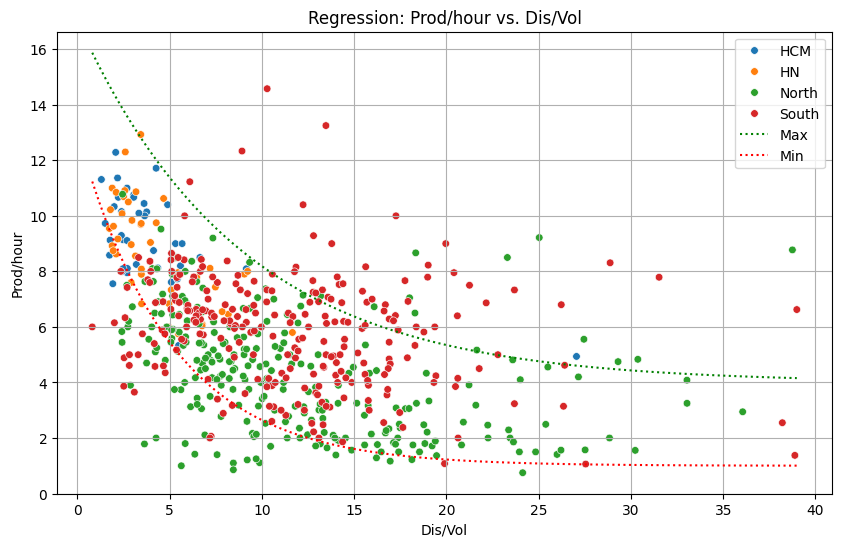

In [ ]:
# Plot station with color by Region
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Hàm mô hình power
def power_function(x, a, b, c):
    return a * (b) ** (-x) + c

# Lọc dữ liệu để giới hạn X < 40 và Y < 20
filtered_data = hub_final[(hub_final["Dis/Vol"] < 40) & (hub_final["P50"] < 20)]

# Lấy giá trị X và Y
X = filtered_data["Dis/Vol"].values.reshape(-1, 1)
y_P50 = filtered_data["P50"].values

# Tạo giá trị X để vẽ đường hồi quy
X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)

# Nhập thủ công thông số cho mô hình power
a_manualP75 = 13
b_manualP75 = 1.12
c_manualP75 = 4

a_manualP25 = 12
b_manualP25 = 1.22
c_manualP25 = 1

# Đường hồi quy phi tuyến với thông số nhập tay
y_pred_manualP75_power = power_function(X_range.ravel(), a_manualP75, b_manualP75, c_manualP75)
y_pred_manualP25_power = power_function(X_range.ravel(), a_manualP25, b_manualP25, c_manualP25)

# Vẽ scatter plot với màu theo Region
plt.figure(figsize=(10, 6))
sns.scatterplot(data=filtered_data, x="Dis/Vol", y="P50", hue="Region", palette="tab10", s=30)

# Vẽ đường hồi quy phi tuyến với thông số nhập tay
plt.plot(X_range, y_pred_manualP75_power, color="green", linestyle=":", label="Max")
plt.plot(X_range, y_pred_manualP25_power, color="red", linestyle=":", label="Min")

# Thêm tiêu đề và nhãn
plt.title("Regression: Prod/hour vs. Dis/Vol")
plt.xlabel("Dis/Vol")
plt.ylabel("Prod/hour")
plt.legend()
plt.grid(True)

# Hiển thị biểu đồ
plt.show()


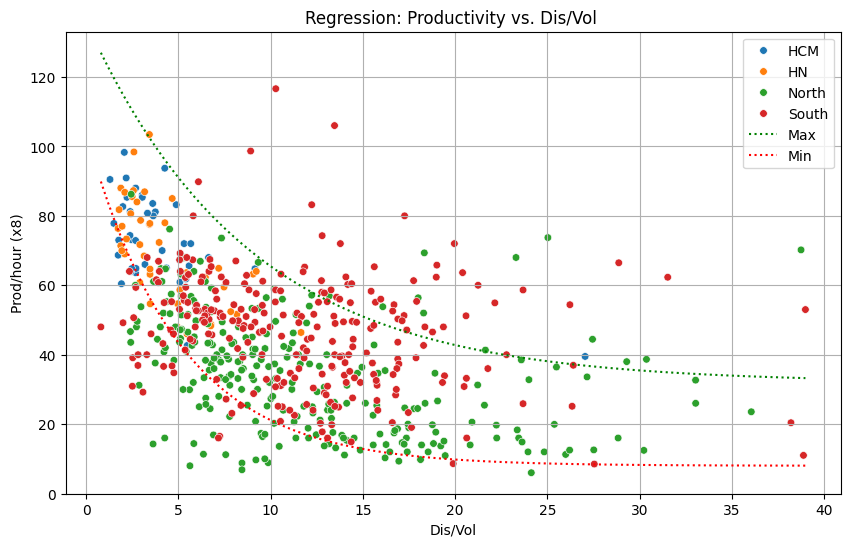

In [ ]:
# Plot station with color by Region
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Hàm mô hình power
def power_function(x, a, b, c):
    return a * (b) ** (-x) + c

# Lọc dữ liệu để giới hạn X < 40 và Y < 20
filtered_data = hub_final[(hub_final["Dis/Vol"] < 40) & (hub_final["P50"] < 20)].copy()

# Lấy giá trị X và Y (nhân 8 lần)
X = filtered_data["Dis/Vol"].values.reshape(-1, 1)
filtered_data["P50"] *= 8  # Nhân tất cả giá trị P50 với 8
y_P50 = filtered_data["P50"].values  # Cập nhật y_P50 đã nhân 8

# Tạo giá trị X để vẽ đường hồi quy
X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)

# Nhập thủ công thông số cho mô hình power
a_manualP75 = 13
b_manualP75 = 1.12
c_manualP75 = 4

a_manualP25 = 12
b_manualP25 = 1.22
c_manualP25 = 1

# Đường hồi quy phi tuyến với thông số nhập tay (nhân 8 lần)
y_pred_manualP75_power = power_function(X_range.ravel(), a_manualP75, b_manualP75, c_manualP75) * 8
y_pred_manualP25_power = power_function(X_range.ravel(), a_manualP25, b_manualP25, c_manualP25) * 8

# Vẽ scatter plot với màu theo Region
plt.figure(figsize=(10, 6))
sns.scatterplot(data=filtered_data, x="Dis/Vol", y="P50", hue="Region", palette="tab10", s=30)

# Vẽ đường hồi quy phi tuyến với thông số nhập tay
plt.plot(X_range, y_pred_manualP75_power, color="green", linestyle=":", label="Max")
plt.plot(X_range, y_pred_manualP25_power, color="red", linestyle=":", label="Min")

# Thêm tiêu đề và nhãn
plt.title("Regression: Productivity vs. Dis/Vol ")
plt.xlabel("Dis/Vol")
plt.ylabel("Prod/hour (x8)")
plt.legend()
plt.grid(True)

# Hiển thị biểu đồ
plt.show()


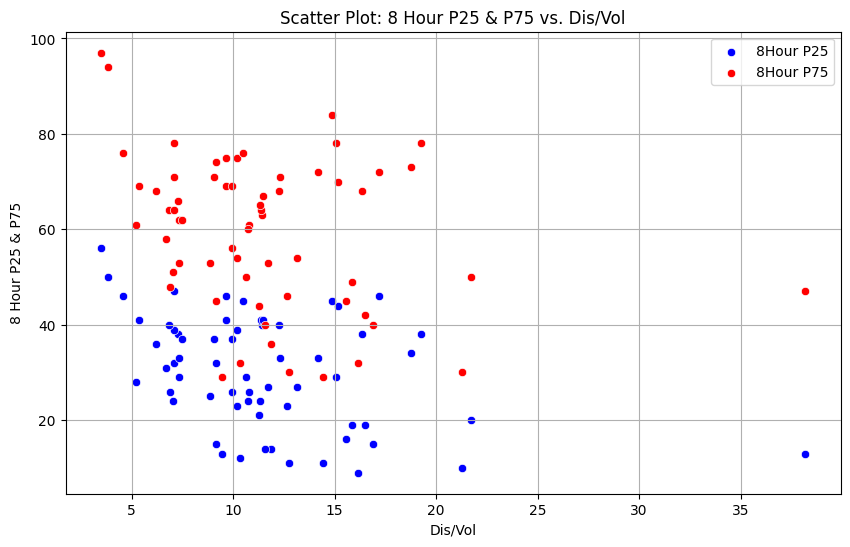

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Tạo scatter plot
plt.figure(figsize=(10, 6))

# Vẽ P25
sns.scatterplot(data=province_final, x="Dis/Vol", y="8Hour P25", color="blue", label="8Hour P25")

# Vẽ P75
sns.scatterplot(data=province_final, x="Dis/Vol", y="8Hour P75", color="red", label="8Hour P75")

# Thêm tiêu đề và nhãn
plt.title("Scatter Plot: 8 Hour P25 & P75 vs. Dis/Vol")
plt.xlabel("Dis/Vol")
plt.ylabel("8 Hour P25 & P75")
plt.legend()
plt.grid(True)

# Hiển thị biểu đồ
plt.show()


In [ ]:
# Remove "(blank)" values in "Region"
df_filtered = df[df["Region"] != "(blank)"]

# Function to calculate percentiles and 8-hour equivalent
def calculate_percentiles(groupby_cols):
    percentiles = df_filtered.groupby(groupby_cols)["Prod/hour"].quantile([0.25, 0.75]).unstack()
    percentiles.columns = ["P25", "P75"]
    percentiles["8Hour P25"] = percentiles["P25"] * 8
    percentiles["8Hour P75"] = percentiles["P75"] * 8

    # Round all values to 0 decimal places
    percentiles = percentiles.round(0)

    return percentiles

# Calculate percentiles for OPS Group and Region
ops_region_percentiles = calculate_percentiles(["OPS Group", "Region"])

# Display results
print("\nPercentiles by OPS Group and Region:")
print(ops_region_percentiles)



Percentiles by OPS Group and Region:
                  P25   P75  8Hour P25  8Hour P75
OPS Group Region                                 
OP1       HCM     8.0  13.0       63.0      105.0
          HN      7.0  13.0       58.0      106.0
          North   4.0   8.0       35.0       66.0
          South   5.0   9.0       39.0       72.0
OP2       HCM     7.0  12.0       55.0       95.0
          HN      5.0   9.0       42.0       75.0
          North   3.0   6.0       21.0       48.0
          South   4.0   8.0       34.0       68.0
OP3       HCM     6.0  11.0       48.0       85.0
          HN      5.0   9.0       41.0       68.0
          North   2.0   5.0       19.0       43.0
          South   3.0   7.0       25.0       58.0
OP4       North   1.0   4.0       11.0       29.0
          South   2.0   7.0       20.0       53.0


In [ ]:
spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1Y29-wRETJjxKfM2S-SSqlwTE1cGYYTimYLtKHzADrkI/edit?gid=0#gid=0') ## updated_data
wks = spr.worksheet('KQ')
# Xóa dữ liệu trong range A10:U
# wks.delete_rows(10, 500000)

# Select columns from 1 to 500000 (adjust if column names are different)
df_province_percentiles = province_percentiles.reset_index()
df_region_percentiles = region_percentiles.reset_index()
df_Subregion_percentiles = Subregion_percentiles.reset_index()
df_ops_region_percentiles = ops_region_percentiles.reset_index()

set_with_dataframe(wks, df_province_percentiles, row=1, col=1, include_index=False, include_column_header=True)
set_with_dataframe(wks, df_region_percentiles, row=1, col=7, include_index=False, include_column_header=True)
set_with_dataframe(wks, df_Subregion_percentiles, row=1, col=24, include_index=False, include_column_header=True)
set_with_dataframe(wks, df_ops_region_percentiles, row=1, col=30, include_index=False, include_column_header=True)

NameError: name 'region_percentiles' is not defined

In [ ]:
# Convert "Thời gian làm việc" to numeric
df_filtered["Thời gian làm việc"] = pd.to_numeric(df_filtered["Thời gian làm việc"], errors="coerce")

# Define Regions
regions = ["HCM", "HN", "North", "South"]

# Set up subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # 2x2 grid
axes = axes.flatten()  # Flatten to loop easily

# Plot histograms for each region
for i, region in enumerate(regions):
    region_data = df_filtered[df_filtered["Region"] == region]["Thời gian làm việc"].dropna()

    sns.histplot(region_data, bins=20, kde=True, ax=axes[i], color="royalblue", edgecolor="black")

    axes[i].set_title(f"Histogram of Work Time ({region})")
    axes[i].set_xlabel("Thời gian làm việc (hours)")
    axes[i].set_ylabel("Frequency")
    axes[i].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
# Convert "Dis/Vol" to numeric
df_filtered["Dis/Vol"] = pd.to_numeric(df_filtered["Dis/Vol"], errors="coerce")

# Define Regions
regions = ["HCM", "HN", "North", "South"]

# Set up subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # 2x2 grid
axes = axes.flatten()  # Flatten to loop easily

# Plot histograms for each region
for i, region in enumerate(regions):
    region_data = df_filtered[df_filtered["Region"] == region]["Dis/Vol"].dropna()

    sns.histplot(region_data, bins=20, kde=True, ax=axes[i], color="royalblue", edgecolor="black")

    axes[i].set_title(f"Histogram of Dis/Vol ({region})")
    axes[i].set_xlabel("Dis/Vol")
    axes[i].set_ylabel("Frequency")
    axes[i].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:


# Filter data where Prod/hour < 30
# Filter data: Remove "(blank)" in Region and keep only Prod/hour < 30
df_filtered = df[(df["Prod/hour"] < 30) & (df["Region"] != "(blank)")]


# Create scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_filtered, x="Dis/Vol", y="Prod/hour", hue="Region", alpha=0.7)

# Customize plot
plt.title("Scatter Plot of Prod/hour vs Dis/Vol")
plt.xlabel("Dis/Vol")
plt.ylabel("Prod/hour")
plt.legend(title="Region")
plt.grid(True)

# Show plot
plt.show()

In [ ]:


# Filter data where Prod/hour < 30
# Filter data: Remove "(blank)" in Region and keep only Prod/hour < 30
df_filtered = df[(df["Prod/hour"] < 30) & (df["Region"] != "(blank)")]


# Create scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_filtered, x="Dis/Vol", y="Prod", hue="Region", alpha=0.7)

# Customize plot
plt.title("Scatter Plot of Prod vs Dis/Vol")
plt.xlabel("Dis/Vol")
plt.ylabel("Prod")
plt.legend(title="Region")
plt.grid(True)

# Show plot
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter data: Remove "(blank)" in Region and keep only Prod/hour < 30
df_filtered = df[(df["Prod/hour"] < 30) & (df["Region"] != "(blank)")]

# Define regions
regions = ["HCM", "HN", "North", "South"]

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()  # Flatten to 1D array for easy iteration

# Loop through regions and plot scatter plots with regression line
for i, region in enumerate(regions):
    subset = df_filtered[df_filtered["Region"] == region]

    # Scatter plot with regression line
    sns.regplot(data=subset, x="Dis/Vol", y="Prod/hour", ax=axes[i], scatter_kws={'alpha': 0.6}, line_kws={'color': 'red'})

    axes[i].set_title(f"Scatter Plot with Regression Line for {region}")
    axes[i].set_xlabel("Dis/Vol")
    axes[i].set_ylabel("Prod/hour")
    axes[i].grid(True)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter data: Remove "(blank)" in Region and keep only Prod/hour < 30
df_filtered = df[(df["Prod/hour"] < 30) & (df["Region"] != "(blank)")]

# Define regions and their corresponding threshold functions
region_thresholds = {
    "HCM": lambda x: -4/3 * x + 20,
    "HN": lambda x: -20/12.5 * x + 20,
    "North": lambda x: -15/80 * x + 15,
    "South": lambda x: -20/60 * x + 20
}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()  # Flatten to 1D array for easy iteration

# Loop through regions and plot scatter plots with linear regression
for i, region in enumerate(region_thresholds.keys()):
    subset = df_filtered[df_filtered["Region"] == region]

    # Compute the threshold line for this region
    threshold_y = region_thresholds[region](subset["Dis/Vol"])

    # Filter data for regression (only points above the threshold)
    subset_reg = subset[subset["Prod/hour"] > threshold_y]

    # Scatter plot (Full dataset)
    sns.scatterplot(data=subset, x="Dis/Vol", y="Prod/hour", ax=axes[i], alpha=0.6)

    # Regression plot (Filtered dataset)
    sns.regplot(data=subset_reg, x="Dis/Vol", y="Prod/hour", ax=axes[i], scatter=False, line_kws={'color': 'red'})

    # Draw threshold line
    x_vals = subset["Dis/Vol"]
    y_vals = threshold_y
    axes[i].plot(x_vals, y_vals, linestyle="--", color="blue", label="Threshold Line")

    # Giới hạn Y > 0
    max_y_value = subset["Prod/hour"].max()  # Lấy giá trị Y lớn nhất của tập dữ liệu
    axes[i].set_ylim(0, max_y_value + 5)  # Giới hạn Y từ 0 đến max_y_value + một khoảng nhỏ để đẹp hơn

    axes[i].set_title(f"Scatter Plot with Regression for {region}")
    axes[i].set_xlabel("Dis/Vol")
    axes[i].set_ylabel("Prod/hour")
    axes[i].legend()
    axes[i].grid(True)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


In [ ]:
# Filter data: Remove "(blank)" in Region and keep only Prod/hour < 30
df_filtered = df[(df["Prod/hour"] < 30) & (df["Region"] != "(blank)")]

# Define regions
regions = ["HCM", "HN", "North", "South"]

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()  # Flatten to 1D array for easy iteration

# Loop through regions and plot scatter plots
for i, region in enumerate(regions):
    subset = df_filtered[df_filtered["Region"] == region]
    sns.scatterplot(data=subset, x="Dis/Vol", y="Prod", ax=axes[i], alpha=0.7)

    axes[i].set_title(f"Scatter Plot for {region}")
    axes[i].set_xlabel("Dis/Vol")
    axes[i].set_ylabel("Prod")
    axes[i].grid(True)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

# Rider Coverage


In [ ]:
import pandas as pd

# Đọc sheet "Pivot" từ file Excel
df_station = pd.read_excel("/content/Prod_Python.xlsx", sheet_name="Station", usecols="A:M")
df_rider = pd.read_excel("/content/Prod_Python.xlsx", sheet_name="Pivot", usecols="A:P")
df_coverage = pd.read_excel("/content/Prod_Python.xlsx", sheet_name="Coverage", usecols="A:N")
df_coverage_rider = pd.read_excel("/content/Prod_Python.xlsx", sheet_name="Coverage_rider", usecols="A:O")
# Hiển thị 5 dòng đầu tiên của dataframe
df_station.head()


,Delivery Success Datetime (Day),Sub_region,Region,Province,OPS Group,Dest hub name,Dis/Vol,Dis,Vols,District_count,S_vols,S_unique,Rider_count
0,1-Dec,Bắc Trung Bộ,North,Hà Tĩnh,OP2,HAT - Ky Anh - NOR - SUB 2,24.344828,706.0,29.0,4.0,22.903448,88.1,2
1,1-Dec,Bắc Trung Bộ,North,Nghệ An,OP1,NGA - Nghe An - NOR,4.277193,243.8,57.0,4.0,4.142105,17.5,2
2,1-Dec,Bắc Trung Bộ,North,Nghệ An,OP2,NGA - Hung Nguyen - NOR - SUB 2,6.700000,13.4,2.0,1.0,18.900000,18.9,1
3,1-Dec,Bắc Trung Bộ,North,Nghệ An,OP2,NGA - Nghi Loc - NOR - SUB 2,17.907692,1164.0,65.0,8.0,24.540000,160.9,2
4,1-Dec,Bắc Trung Bộ,North,Nghệ An,OP2,NGA - Thanh Chuong - NOR - SUB 2,21.930357,1228.1,56.0,11.0,80.530357,303.4,2


In [ ]:
df_coverage_rider.head()

,Delivery Success Datetime (Day),Sub_region,Region,Province,OPS Group,Dest hub name,Dest Zone,Rider Name,Dis/Vol,Dis,Vols,District_count,S_vols,S_unique,Rider_count
0,1-Dec,Bắc Trung Bộ,North,Hà Tĩnh,OP2,HAT - Ky Anh - NOR - SUB 2,N - HAT - Kỳ Anh - Kỳ Bắc,606-NEXT-HD THACH1,31.4,188.4,6.0,1.0,19.9,19.9,1
1,1-Dec,Bắc Trung Bộ,North,Hà Tĩnh,OP2,HAT - Ky Anh - NOR - SUB 2,N - HAT - Kỳ Anh - Kỳ Phong,606-NEXT-HD THACH1,24.2,290.4,12.0,1.0,30.2,30.2,1
2,1-Dec,Bắc Trung Bộ,North,Hà Tĩnh,OP2,HAT - Ky Anh - NOR - SUB 2,N - HAT - Kỳ Anh - Kỳ Phú,606-NEXT-TN HOANG,19.0,171.0,9.0,1.0,15.2,15.2,1
3,1-Dec,Bắc Trung Bộ,North,Hà Tĩnh,OP2,HAT - Ky Anh - NOR - SUB 2,N - HAT - Kỳ Anh - Kỳ Xuân,606-NEXT-TN HOANG,28.1,56.2,2.0,1.0,22.8,22.8,1
4,1-Dec,Bắc Trung Bộ,North,Nghệ An,OP1,NGA - Nghe An - NOR,N - NGA - Vinh - Đội Cung,281-NEXT-TH NGAN,1.4,36.4,26.0,1.0,0.7,0.7,1


In [ ]:
import pandas as pd

# Sample data (use your actual df_coverage_rider)
df = df_coverage_rider.copy()

# Step 1: Group by required columns and sum specified columns
grouped_df = df.groupby([
    "Delivery Success Datetime (Day)", "Sub_region", "Region", "Province",
    "OPS Group", "Dest hub name", "Rider Name"
]).agg({
    "Dis/Vol": "sum",
    "Dis": "sum",
    "Vols": "sum",
    "District_count": "sum",
    "S_vols": "sum",
    "S_unique": "sum"
}).reset_index()

# Step 2: Adjust S_unique by Rider count per Dest Zone and day
df["Rider_count_per_zone"] = df.groupby(["Delivery Success Datetime (Day)", "Dest Zone"])["Rider Name"].transform("nunique")
df["Adjusted_S_unique"] = df["S_unique"] / df["Rider_count_per_zone"]

# Step 3: Sum Adjusted S_unique for each Rider
adjusted_s_unique_df = df.groupby([
    "Delivery Success Datetime (Day)", "Sub_region", "Region", "Province",
    "OPS Group", "Dest hub name", "Rider Name"
])["Adjusted_S_unique"].sum().reset_index()

# Step 4: Merge with the original grouped dataframe
final_df = grouped_df.merge(adjusted_s_unique_df, on=[
    "Delivery Success Datetime (Day)", "Sub_region", "Region", "Province",
    "OPS Group", "Dest hub name", "Rider Name"
], how="left")


# Merge df_rider with final_df using the specified keys
final_df = final_df.merge(
    df_rider[[
        "Delivery Success Datetime (Day)", "Sub_region", "Region", "Province",
        "OPS Group", "Dest hub name", "Rider Name", "Prod/hour"
    ]],
    on=[
        "Delivery Success Datetime (Day)", "Sub_region", "Region", "Province",
        "OPS Group", "Dest hub name", "Rider Name"
    ],
    how="left"
)

# Display the final dataframe
print(final_df)


# Display final result
print(final_df)


       Delivery Success Datetime (Day)           Sub_region Region   Province  \
0                                1-Dec         Bắc Trung Bộ  North    Hà Tĩnh   
1                                1-Dec         Bắc Trung Bộ  North    Hà Tĩnh   
2                                1-Dec         Bắc Trung Bộ  North    Nghệ An   
3                                1-Dec         Bắc Trung Bộ  North    Nghệ An   
4                                1-Dec         Bắc Trung Bộ  North    Nghệ An   
...                                ...                  ...    ...        ...   
104009                           9-Dec  Đồng Bằng Sông Hồng  North  Vĩnh Phúc   
104010                           9-Dec  Đồng Bằng Sông Hồng  North  Vĩnh Phúc   
104011                           9-Dec  Đồng Bằng Sông Hồng  North  Vĩnh Phúc   
104012                           9-Dec  Đồng Bằng Sông Hồng  North  Vĩnh Phúc   
104013                           9-Dec  Đồng Bằng Sông Hồng  North  Vĩnh Phúc   

       OPS Group           

IndexError: index 4 is out of bounds for axis 0 with size 4

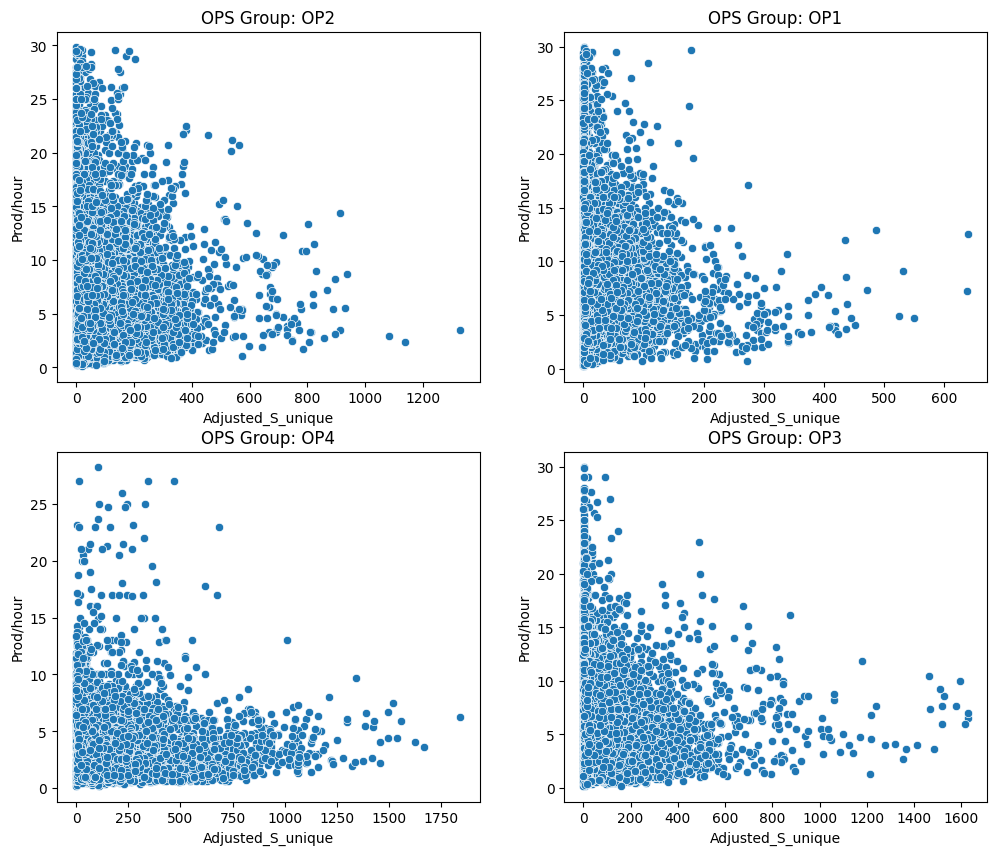

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data where Prod/hour < 30
filtered_df = final_df[final_df["Prod/hour"] < 30]

# Get unique OPS Groups
ops_groups = filtered_df["OPS Group"].unique()

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # Adjust grid size if needed
axes = axes.flatten()  # Flatten the 2D array to 1D for easy iteration

# Loop through each OPS Group and plot
for i, ops_group in enumerate(ops_groups):
    subset = filtered_df[filtered_df["OPS Group"] == ops_group]

    sns.scatterplot(
        data=subset,
        x="Adjusted_S_unique",
        y="Prod/hour",
        ax=axes[i]
    )

    axes[i].set_title(f"OPS Group: {ops_group}")
    axes[i].set_xlabel("Adjusted_S_unique")
    axes[i].set_ylabel("Prod/hour")

# Adjust layout
plt.tight_layout()
plt.show()


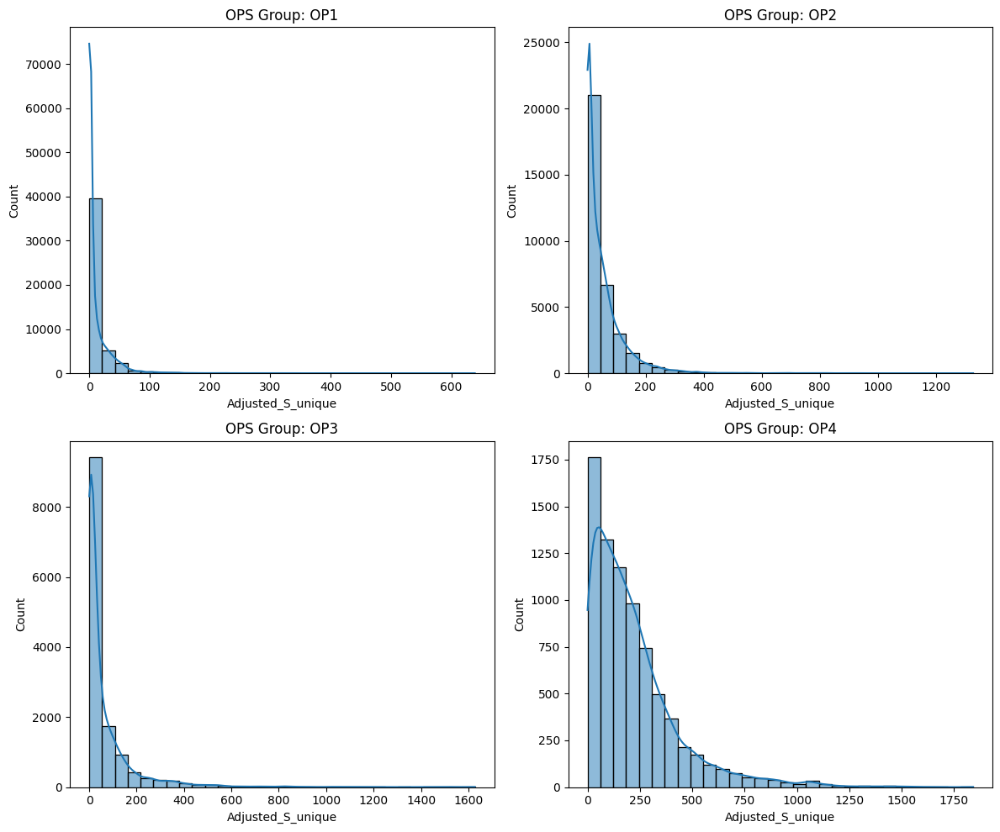

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the order of OPS Groups
ops_groups_order = ["OP1", "OP2", "OP3", "OP4"]

# Remove "(blank)" from the data
final_df = final_df[final_df["OPS Group"] != "(blank)"]

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 2x2 grid for 4 histograms
axes = axes.flatten()  # Flatten for easy iteration

# Loop through the ordered OPS Groups and plot histograms
for i, ops_group in enumerate(ops_groups_order):
    subset = final_df[final_df["OPS Group"] == ops_group]

    sns.histplot(
        subset["Adjusted_S_unique"],
        bins=30,
        kde=True,
        ax=axes[i]
    )

    axes[i].set_title(f"OPS Group: {ops_group}")
    axes[i].set_xlabel("Adjusted_S_unique")
    axes[i].set_ylabel("Count")

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
# Calculate P75 and P90 for each combination of OPS Group and Region
p75_values = final_df.groupby(["OPS Group", "Region"])["Adjusted_S_unique"].quantile(0.75)
p90_values = final_df.groupby(["OPS Group", "Region"])["Adjusted_S_unique"].quantile(0.90)

# Display results
print("P75 Values:\n", p75_values)
print("\nP90 Values:\n", p90_values)



P75 Values:
 OPS Group  Region
OP1        HCM         0.425625
           HN          0.667633
           North      31.804167
           South      15.708229
OP2        HCM         0.847368
           HN          8.586875
           North     125.475000
           South      80.606667
OP3        HCM         3.648810
           HN         20.895000
           North     184.000000
           South     141.450000
OP4        North     274.275000
           South     471.395833
Name: Adjusted_S_unique, dtype: float64

P90 Values:
 OPS Group  Region
OP1        HCM         0.699348
           HN          1.280107
           North      50.123333
           South      41.511667
OP2        HCM         1.433906
           HN         14.557500
           North     201.505000
           South     137.085000
OP3        HCM         9.000039
           HN         32.862242
           North     363.400000
           South     277.600000
OP4        North     400.810000
           South     753.500000
N

In [ ]:
# Calculate P75 and P90 for each combination of OPS Group and Region
p75_values = final_df.groupby(["OPS Group", "Province"])["Adjusted_S_unique"].quantile(0.75)
p90_values = final_df.groupby(["OPS Group", "Province"])["Adjusted_S_unique"].quantile(0.90)

# Display results
print("P75 Values:\n", p75_values)
print("\nP90 Values:\n", p90_values)
spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1Y29-wRETJjxKfM2S-SSqlwTE1cGYYTimYLtKHzADrkI/edit?gid=0#gid=0') ## updated_data
wks = spr.worksheet('Diện tích')

# Convert DataFrame to Google Sheets
p90_values = p90_values.reset_index()
set_with_dataframe(wks, p90_values, row=1, col=1, include_index=False, include_column_header=True)

P75 Values:
 OPS Group  Province         
OP1        An Giang              54.236667
           Bà Rịa - Vũng Tàu      9.795833
           Bình Dương             3.198718
           Bình Thuận             4.350000
           Bình Định             92.100000
                                   ...    
OP4        Thừa Thiên Huế       516.850000
           Tuyên Quang          390.037500
           Yên Bái              336.033333
           Điện Biên            329.617500
           Đắk Lắk              589.466667
Name: Adjusted_S_unique, Length: 163, dtype: float64

P90 Values:
 OPS Group  Province         
OP1        An Giang              77.767500
           Bà Rịa - Vũng Tàu     19.788333
           Bình Dương             5.051852
           Bình Thuận            12.259429
           Bình Định            127.900000
                                   ...    
OP4        Thừa Thiên Huế       616.800000
           Tuyên Quang          569.530000
           Yên Bái              484.183333
  

In [ ]:
# Calculate P75 and P90 for each combination of OPS Group and Region
p50_values = final_df.groupby(["OPS Group"])["Adjusted_S_unique"].quantile(0.50)
p75_values = final_df.groupby(["OPS Group"])["Adjusted_S_unique"].quantile(0.75)
p90_values = final_df.groupby(["OPS Group"])["Adjusted_S_unique"].quantile(0.90)

# Display results
print("P50 Values:\n", p50_values)
print("P75 Values:\n", p75_values)
print("\nP90 Values:\n", p90_values)

# Combine into a single DataFrame
summary_df = pd.DataFrame({
    "P90": p90_values,
    "P75": p75_values,
    "P50": p50_values
}).reset_index()
summary_df = summary_df[summary_df["OPS Group"] != "(blank)"]


spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1Y29-wRETJjxKfM2S-SSqlwTE1cGYYTimYLtKHzADrkI/edit?gid=0#gid=0') ## updated_data
wks = spr.worksheet('Diện tích')

# Convert DataFrame to Google Sheets

set_with_dataframe(wks, summary_df, row=1, col=5, include_index=False, include_column_header=True)

P50 Values:
 OPS Group
(blank)      0.000000
OP1          2.263158
OP2         27.400000
OP3         15.841667
OP4        164.883333
Name: Adjusted_S_unique, dtype: float64
P75 Values:
 OPS Group
(blank)      0.000000
OP1         13.624965
OP2         70.165000
OP3         72.750000
OP4        294.691667
Name: Adjusted_S_unique, dtype: float64

P90 Values:
 OPS Group
(blank)      0.000000
OP1         36.950000
OP2        133.520000
OP3        172.435000
OP4        477.423333
Name: Adjusted_S_unique, dtype: float64


,OPS Group,P90,P75,P50
1,OP1,36.950000,13.624965,2.263158
2,OP2,133.520000,70.165000,27.400000
3,OP3,172.435000,72.750000,15.841667
4,OP4,477.423333,294.691667,164.883333


In [ ]:
# Calculate P75 and P90 for each combination of OPS Group and Region
p50_values = final_df.groupby(["OPS Group"])["District_count"].quantile(0.50)
p75_values = final_df.groupby(["OPS Group"])["District_count"].quantile(0.75)
p90_values = final_df.groupby(["OPS Group"])["District_count"].quantile(0.95)

# Display results
print("P50 Values:\n", p50_values)
print("P75 Values:\n", p75_values)
print("\nP90 Values:\n", p90_values)

# Combine into a single DataFrame
summary_df = pd.DataFrame({
    "P90": p90_values,
    "P75": p75_values,
    "P50": p50_values
}).reset_index()
summary_df = summary_df[summary_df["OPS Group"] != "(blank)"]

spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1Y29-wRETJjxKfM2S-SSqlwTE1cGYYTimYLtKHzADrkI/edit?gid=0#gid=0') ## updated_data
wks = spr.worksheet('Diện tích')

# Convert DataFrame to Google Sheets
# p90_values = p90_values.reset_index()
set_with_dataframe(wks, summary_df, row=7, col=5, include_index=False, include_column_header=True)

P50 Values:
 OPS Group
(blank)    0.0
OP1        3.0
OP2        3.0
OP3        3.0
OP4        4.0
Name: District_count, dtype: float64
P75 Values:
 OPS Group
(blank)    0.0
OP1        5.0
OP2        5.0
OP3        4.0
OP4        6.0
Name: District_count, dtype: float64

P90 Values:
 OPS Group
(blank)    0.0
OP1        8.0
OP2        9.0
OP3        7.0
OP4        9.0
Name: District_count, dtype: float64


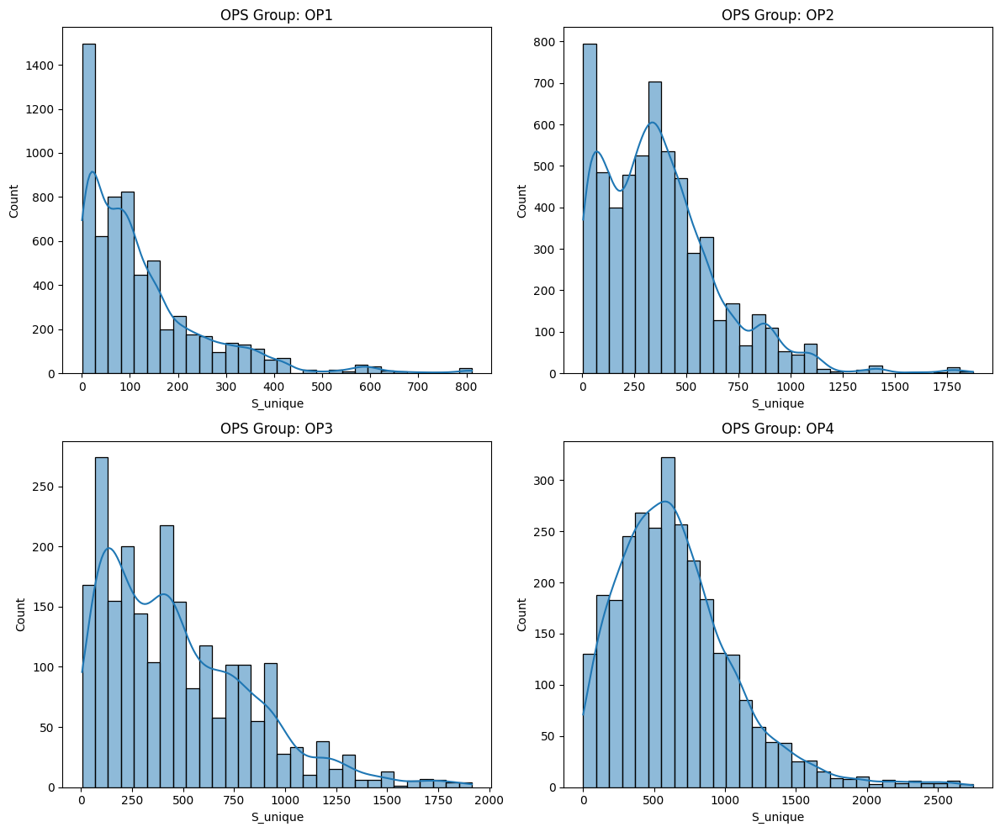

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the order of OPS Groups
ops_groups_order = ["OP1", "OP2", "OP3", "OP4"]

# Remove "(blank)" from the data
df_station = df_station[df_station["OPS Group"] != "(blank)"]

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 2x2 grid for 4 histograms
axes = axes.flatten()  # Flatten for easy iteration

# Loop through the ordered OPS Groups and plot histograms
for i, ops_group in enumerate(ops_groups_order):
    subset = df_station[df_station["OPS Group"] == ops_group]

    sns.histplot(
        subset["S_unique"],
        bins=30,
        kde=True,
        ax=axes[i]
    )

    axes[i].set_title(f"OPS Group: {ops_group}")
    axes[i].set_xlabel("S_unique")
    axes[i].set_ylabel("Count")

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
# Calculate P75 and P90 for each combination of OPS Group and Region
p75_values = df_station.groupby(["OPS Group"])["S_unique"].quantile(0.75)
p90_values = df_station.groupby(["OPS Group"])["S_unique"].quantile(0.90)

# Display results
print("P75 Values:\n", p75_values)
print("\nP90 Values:\n", p90_values)


P75 Values:
 OPS Group
OP1    162.250
OP2    502.000
OP3    713.425
OP4    856.025
Name: S_unique, dtype: float64

P90 Values:
 OPS Group
OP1     302.5
OP2     741.3
OP3     946.3
OP4    1169.2
Name: S_unique, dtype: float64


IndexError: index 4 is out of bounds for axis 0 with size 4

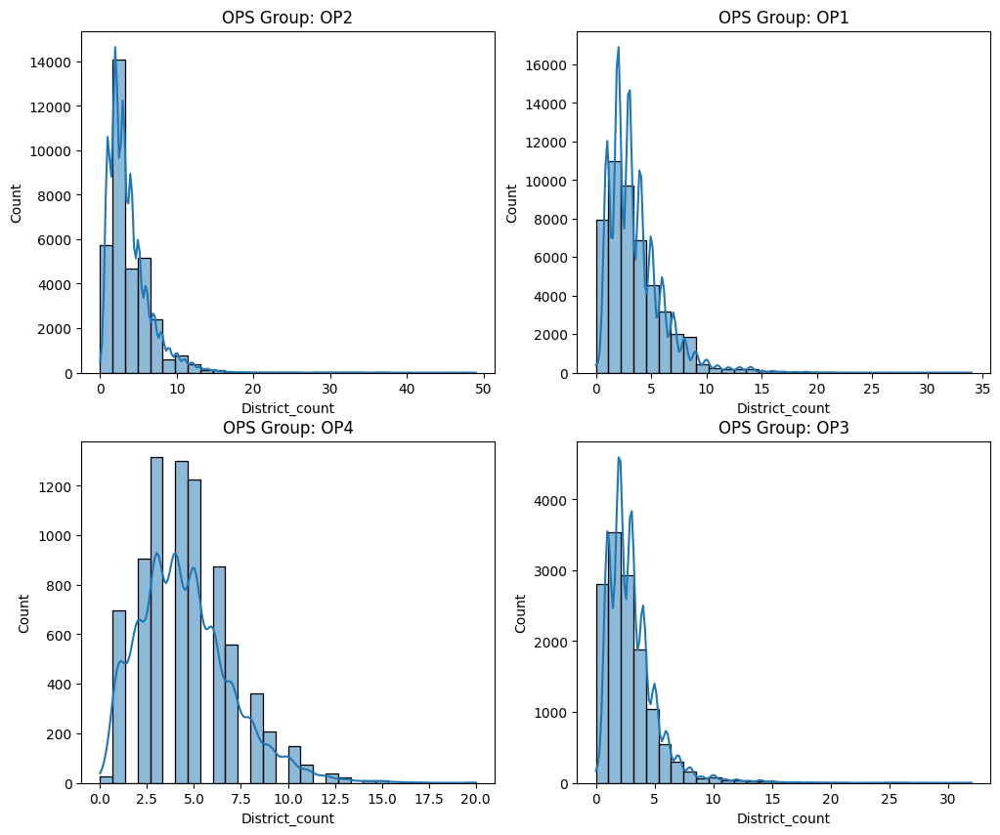

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique OPS Groups
ops_groups = final_df["OPS Group"].unique()

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # Create a 2x2 grid for 4 histograms
axes = axes.flatten()  # Flatten for easy iteration

# Loop through each OPS Group and plot histogram
for i, ops_group in enumerate(ops_groups):
    subset = final_df[final_df["OPS Group"] == ops_group]

    sns.histplot(
        subset["District_count"],
        bins=30,
        kde=True,
        ax=axes[i]
    )

    axes[i].set_title(f"OPS Group: {ops_group}")
    axes[i].set_xlabel("District_count")
    axes[i].set_ylabel("Count")

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
# Calculate P75 for each OPS Group
p75_values = final_df.groupby("OPS Group")["District_count"].quantile(0.75)

# Display results
print(p75_values)

p90_values = final_df.groupby("OPS Group")["District_count"].quantile(0.90)

# Display results
print(p90_values)

OPS Group
(blank)    0.0
OP1        5.0
OP2        5.0
OP3        4.0
OP4        6.0
Name: District_count, dtype: float64
OPS Group
(blank)    0.0
OP1        7.0
OP2        7.0
OP3        5.0
OP4        8.0
Name: District_count, dtype: float64


In [ ]:
df_coverage["mật độ đơn hàng"] = df_coverage["S_unique"] / df_coverage["Vols"]

df_coverage.head()

,Delivery Success Datetime (Day),Sub_region,Region,Province,OPS Group,Dest hub name,Dest Zone,Dis/Vol,Dis,Vols,District_count,S_vols,S_unique,Rider_count,mật độ đơn hàng
0,1-Dec,Bắc Trung Bộ,North,Hà Tĩnh,OP2,HAT - Ky Anh - NOR - SUB 2,N - HAT - Kỳ Anh - Kỳ Bắc,31.4,188.4,6.0,1,19.9,19.9,1,3.316667
1,1-Dec,Bắc Trung Bộ,North,Hà Tĩnh,OP2,HAT - Ky Anh - NOR - SUB 2,N - HAT - Kỳ Anh - Kỳ Phong,24.2,290.4,12.0,1,30.2,30.2,1,2.516667
2,1-Dec,Bắc Trung Bộ,North,Hà Tĩnh,OP2,HAT - Ky Anh - NOR - SUB 2,N - HAT - Kỳ Anh - Kỳ Phú,19.0,171.0,9.0,1,15.2,15.2,1,1.688889
3,1-Dec,Bắc Trung Bộ,North,Hà Tĩnh,OP2,HAT - Ky Anh - NOR - SUB 2,N - HAT - Kỳ Anh - Kỳ Xuân,28.1,56.2,2.0,1,22.8,22.8,1,11.400000
4,1-Dec,Bắc Trung Bộ,North,Nghệ An,OP1,NGA - Nghe An - NOR,N - NGA - Vinh - Đội Cung,1.4,36.4,26.0,1,0.7,0.7,1,0.026923


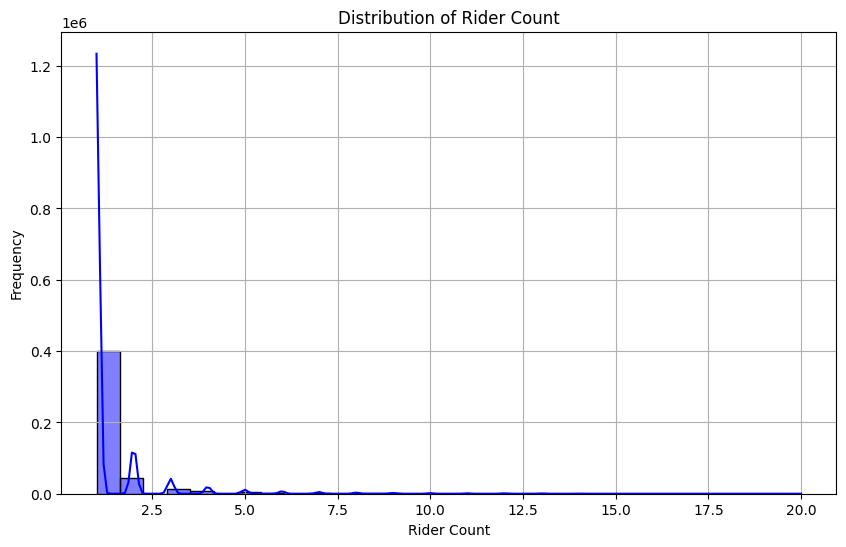

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Vẽ histogram của Rider_count
plt.figure(figsize=(10, 6))
sns.histplot(df_coverage["Rider_count"], bins=30, kde=True, color="blue")

# Thêm tiêu đề và nhãn
plt.title("Distribution of Rider Count")
plt.xlabel("Rider Count")
plt.ylabel("Frequency")
plt.grid(True)

# Hiển thị biểu đồ
plt.show()


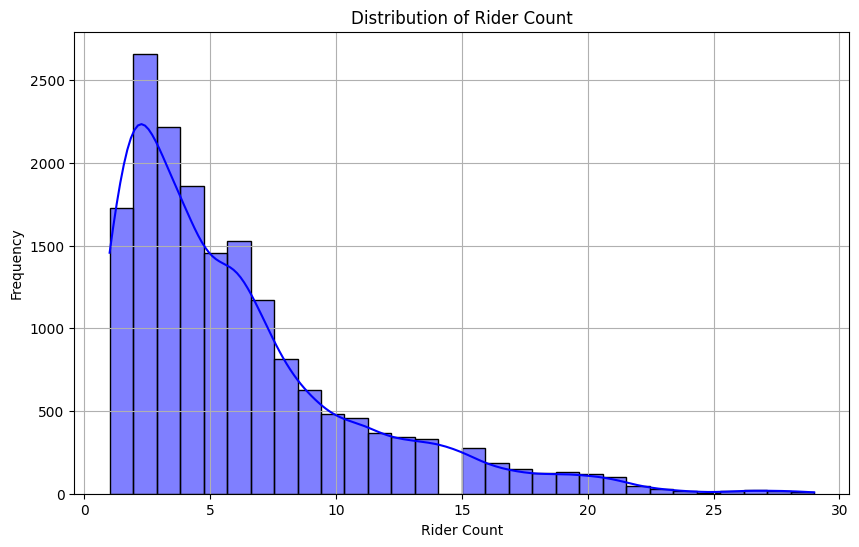

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Vẽ histogram của Rider_count
plt.figure(figsize=(10, 6))
sns.histplot(df_station["Rider_count"], bins=30, kde=True, color="blue")

# Thêm tiêu đề và nhãn
plt.title("Distribution of Rider Count")
plt.xlabel("Rider Count")
plt.ylabel("Frequency")
plt.grid(True)

# Hiển thị biểu đồ
plt.show()


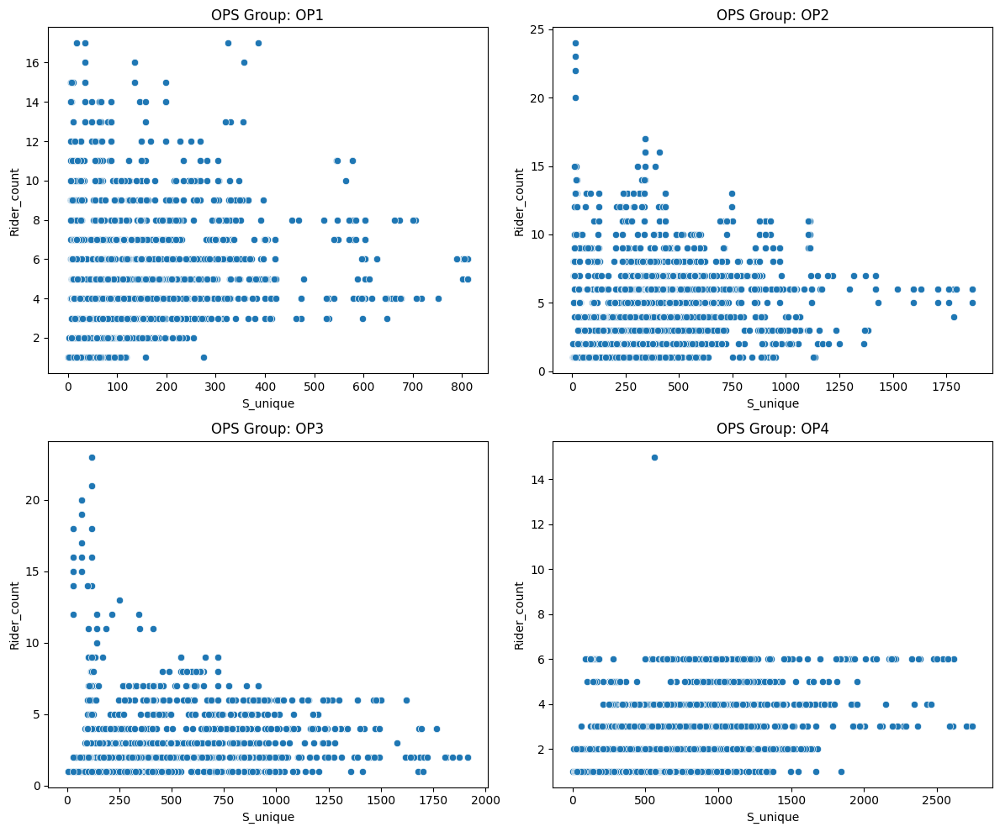

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data where Vols <= 500 and remove blank OPS Groups
filtered_df = df_station[(df_station["OPS Group"] != "(blank)") & (df_station["Vols"] <= 500)]

# Define the desired OPS Group order
ops_order = ["OP1", "OP2", "OP3", "OP4"]

# Ensure OPS Group appears in the correct order
filtered_df = filtered_df[filtered_df["OPS Group"].isin(ops_order)]
filtered_df["OPS Group"] = pd.Categorical(filtered_df["OPS Group"], categories=ops_order, ordered=True)

# Create subplots (2x2 grid)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()  # Flatten the 2D array for easy iteration

# Loop through each OPS Group in the correct order and plot
for i, ops_group in enumerate(ops_order):
    subset = filtered_df[filtered_df["OPS Group"] == ops_group]

    sns.scatterplot(
        data=subset,
        x="S_unique",
        y="Rider_count",
        ax=axes[i]
    )

    axes[i].set_title(f"OPS Group: {ops_group}")
    axes[i].set_xlabel("S_unique")
    axes[i].set_ylabel("Rider_count")

# Adjust layout
plt.tight_layout()
plt.show()


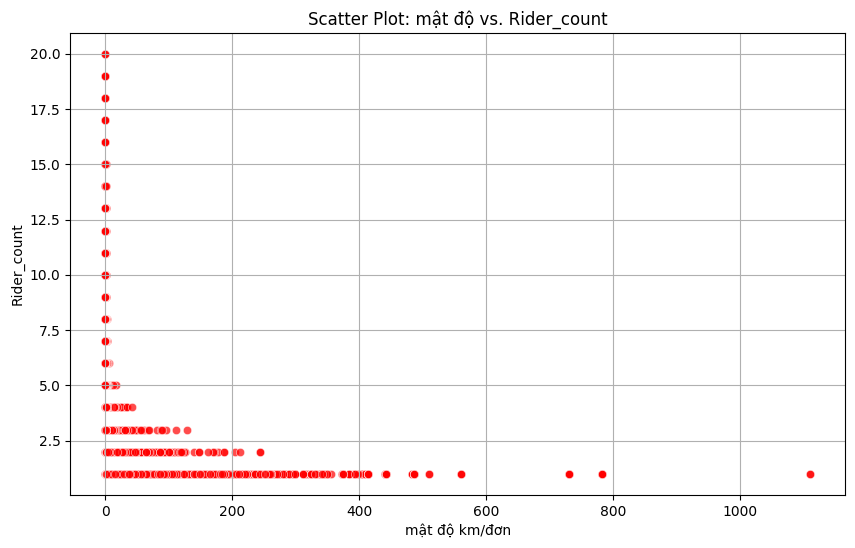

In [ ]:
# Vẽ scatter plot giữa S_unique và Rider_count
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_coverage, x="mật độ đơn hàng", y="Rider_count", color="r", alpha=0.7)
plt.title("Scatter Plot: mật độ vs. Rider_count")
plt.xlabel("mật độ km/đơn")
plt.ylabel("Rider_count")
plt.grid(True)
plt.show()

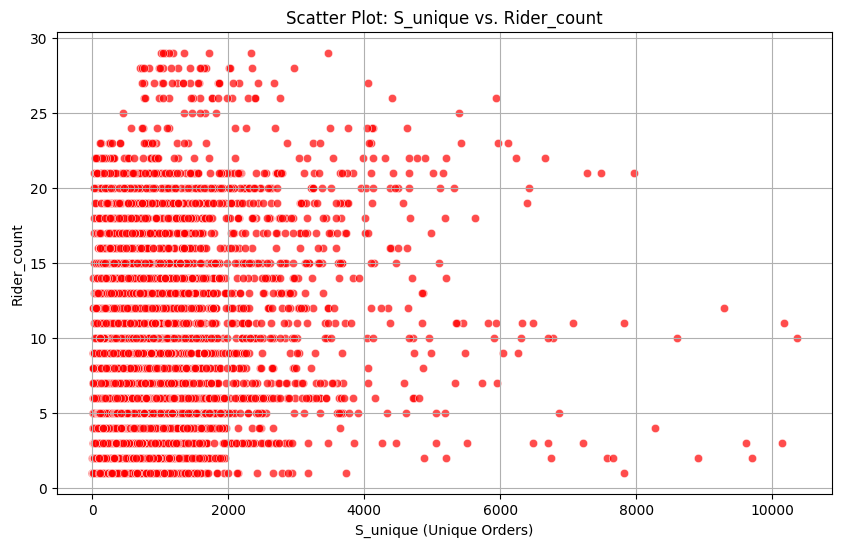

In [ ]:
# Vẽ scatter plot giữa S_unique và Rider_count
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_station, x="S_unique", y="Rider_count", color="r", alpha=0.7)
plt.title("Scatter Plot: S_unique vs. Rider_count")
plt.xlabel("S_unique (Unique Orders)")
plt.ylabel("Rider_count")
plt.grid(True)
plt.show()

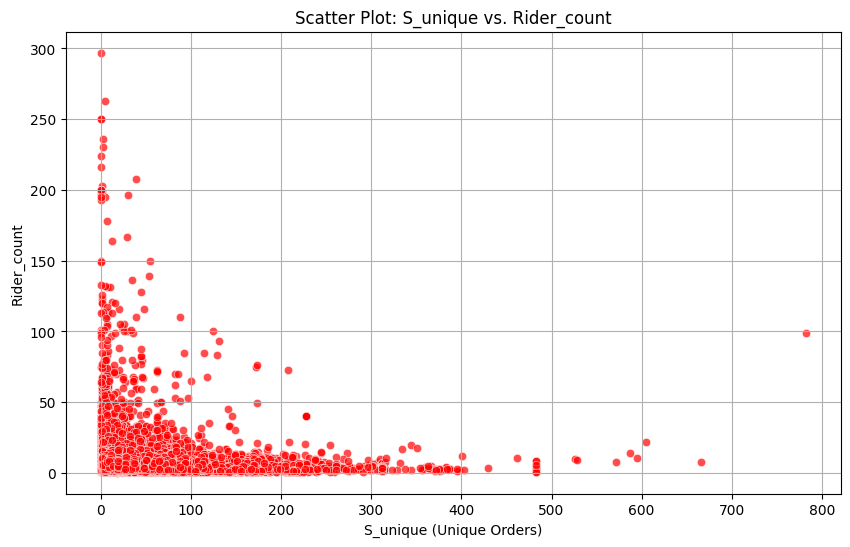

In [ ]:
# Vẽ scatter plot giữa S_unique và Rider_count
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_rider, x="S_vols", y="Prod/hour", color="r", alpha=0.7)
plt.title("Scatter Plot: S_unique vs. Rider_count")
plt.xlabel("S_unique (Unique Orders)")
plt.ylabel("Rider_count")
plt.grid(True)
plt.show()

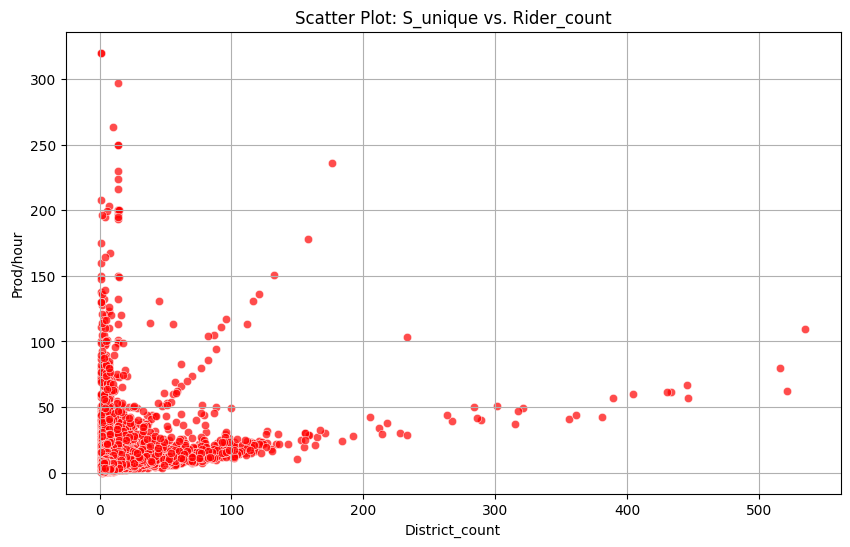

In [ ]:
# Vẽ scatter plot giữa S_unique và Rider_count
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_rider, x="District_count", y="Prod/hour", color="r", alpha=0.7)
plt.title("Scatter Plot: S_unique vs. Rider_count")
plt.xlabel("District_count")
plt.ylabel("Prod/hour")
plt.grid(True)
plt.show()

# K-means phân nhóm

In [ ]:
spr_blwh = client.open_by_url('https://docs.google.com/spreadsheets/d/1LSJPlZdljAnnfKIWGZ1BZQQuP1p8jIAbgfuYSZ_65e0/edit?gid=2097661650#gid=2097661650')
wks_blwh  = spr_blwh.worksheet(f"north_south_Ward_level_feb23")
data_blwh  = wks_blwh.get_all_values()
ref_blwh = pd.DataFrame(data_blwh [1:],columns=data_blwh [0])
df = ref_blwh
df['density'] = pd.to_numeric(df['density'], errors='coerce')
df.head()


,dest_hub_id,region,ward_name,hub_latitude,hub_longitude,ward_area,order_count,density,Vol m11 12 01/25
0,13,South,Bình Dương-Bến Cát-Thới Hòa,11.027304,106.679618,39.71,1,274.943339,10918
1,13,South,Bình Dương-Bến Cát-Tân Định,11.027304,106.679618,16.94,2,265.112161,4491
2,13,South,Bình Dương-Thuận An-An Sơn,11.027304,106.679618,6.05,3,55.867769,338
3,13,South,Bình Dương-Thuận An-Bình Chuẩn,11.027304,106.679618,11.8,1,446.101695,5264
4,13,South,Bình Dương-Thuận An-Thuận Giao,11.027304,106.679618,11.86,4,672.428331,7975


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans



# Chỉ lấy cột mật độ để phân cụm
X = df[['density']]

# Áp dụng thuật toán K-Means với số cụm = 3
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
df['Cluster'] = kmeans.fit_predict(X)

cluster_means = df.groupby('Cluster')['density'].mean()
median_value = cluster_means.median()  # Trung vị của trung bình các cụm
closest_to_median = (cluster_means - median_value).abs().idxmin()  # Cụm gần nhất với trung vị

df['Nhóm'] = df['Cluster'].map({cluster_means.idxmin(): 'Thấp',
                                closest_to_median: 'Trung bình',
                                cluster_means.idxmax(): 'Cao'})
# Xuất kết quả ra file hoặc xem trực tiếp
df.to_csv('ket_qua_phan_loai.csv', index=False)
print(df.head())

  dest_hub_id region                       ward_name hub_latitude  \
0          13  South     Bình Dương-Bến Cát-Thới Hòa    11.027304   
1          13  South     Bình Dương-Bến Cát-Tân Định    11.027304   
2          13  South      Bình Dương-Thuận An-An Sơn    11.027304   
3          13  South  Bình Dương-Thuận An-Bình Chuẩn    11.027304   
4          13  South  Bình Dương-Thuận An-Thuận Giao    11.027304   

  hub_longitude ward_area order_count     density Vol m11 12 01/25  Cluster  \
0    106.679618     39.71           1  274.943339            10918        0   
1    106.679618     16.94           2  265.112161             4491        0   
2    106.679618      6.05           3   55.867769              338        0   
3    106.679618      11.8           1  446.101695             5264        2   
4    106.679618     11.86           4  672.428331             7975        2   

         Nhóm  
0        Thấp  
1        Thấp  
2        Thấp  
3  Trung bình  
4  Trung bình  


In [ ]:
spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1LSJPlZdljAnnfKIWGZ1BZQQuP1p8jIAbgfuYSZ_65e0/edit?gid=1467296535#gid=1467296535') ## updated_data
wks = spr.worksheet('Kmean_cluster')
# Xóa dữ liệu trong range A10:U
wks.batch_clear(['A2:K'])

# Select columns from 1 to 500000 (adjust if column names are different)


set_with_dataframe(wks, df, row=1, col=1, include_index=False, include_column_header=True)

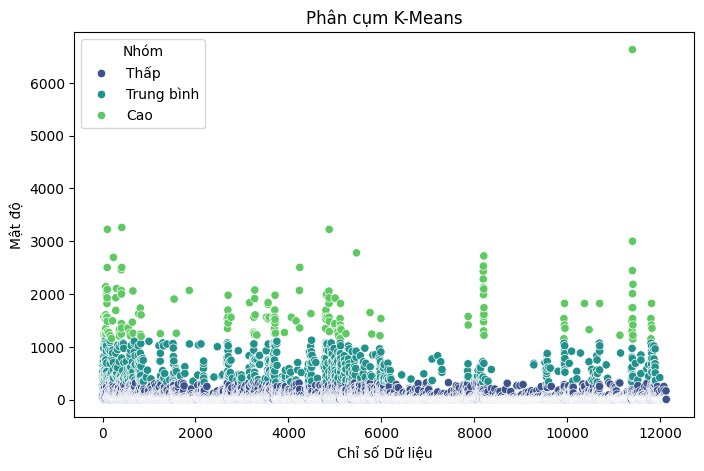

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Vẽ scatter plot với màu theo cụm
plt.figure(figsize=(8, 5))
sns.scatterplot(x=df.index, y=df['density'], hue=df['Nhóm'], palette='viridis')

plt.xlabel('Chỉ số Dữ liệu')
plt.ylabel('Mật độ')
plt.title('Phân cụm K-Means')
plt.legend(title='Nhóm')
plt.show()


In [ ]:
plt.figure(figsize=(6, 4))
sns.barplot(x=df['Nhóm'], y=df['density'], estimator=np.mean, palette='pastel')

plt.xlabel('Nhóm')
plt.ylabel('Giá trị Trung bình')
plt.title('Trung bình Mật độ theo Nhóm')
plt.show()


In [ ]:
plt.figure(figsize=(6, 4))
sns.boxplot(x=df['Nhóm'], y=df['density'], palette='Set2')

plt.xlabel('Nhóm')
plt.ylabel('Mật độ')
plt.title('Phân bố Mật độ theo Nhóm')
plt.show()


# SHP GIS

In [ ]:
pip install geopandas shapely


In [ ]:
import os

# List all uploaded files
os.listdir('/content/')

['.config', 'gadm41_VNM_2.shp', 'Dia_phan_Tinh.shp', 'test.shp', 'sample_data']

In [ ]:
import geopandas as gpd

shapefile_path = "/content/gadm41_VNM_3.shp"  # Ensure this matches your filename
gdf = gpd.read_file(shapefile_path)

print(gdf.head())  # Display first few rows

         GID_3 GID_0  COUNTRY    GID_1    NAME_1 NL_NAME_1      GID_2  NAME_2  \
0  VNM.1.1.1_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
1  VNM.1.1.2_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
2  VNM.1.1.3_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
3  VNM.1.1.4_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
4  VNM.1.1.5_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   

  NL_NAME_2      NAME_3   VARNAME_3 NL_NAME_3    TYPE_3 ENGTYPE_3 CC_3 HASC_3  \
0        NA      An Phú      An Phu        NA  Thị trấn   Townlet   NA     NA   
1        NA    Đa Phước    Da Phuoc        NA        Xã      Ward   NA     NA   
2        NA    Khánh An    Khanh An        NA        Xã      Ward   NA     NA   
3        NA  Khánh Bình  Khanh Binh        NA        Xã      Ward   NA     NA   
4        NA   Long Bình   Long Binh        NA  Thị trấn   Townlet   NA     NA   

                          

In [ ]:
# Check current CRS
print("Current CRS:", gdf.crs)

# Convert to a projected coordinate system (Vietnam: UTM Zone 48N)
if gdf.crs is None:
    print("Shapefile has no CRS. Please set it manually.")
elif gdf.crs.is_geographic:
    gdf = gdf.to_crs(epsg=32648)  # Change EPSG if needed


Current CRS: EPSG:4326


In [ ]:
# Calculate area in square meters
gdf["Area_sqm"] = gdf.area

# Convert to square kilometers
gdf["Area_sqkm"] = gdf["Area_sqm"] / 1e6

# Create a new DataFrame with selected columns
# df = gdf[["Code", "Name", "Area_sqkm"]]

# Show result
print(gdf.head())


         GID_3 GID_0  COUNTRY    GID_1    NAME_1 NL_NAME_1      GID_2  NAME_2  \
0  VNM.1.1.1_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
1  VNM.1.1.2_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
2  VNM.1.1.3_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
3  VNM.1.1.4_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
4  VNM.1.1.5_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   

  NL_NAME_2      NAME_3   VARNAME_3 NL_NAME_3    TYPE_3 ENGTYPE_3 CC_3 HASC_3  \
0        NA      An Phú      An Phu        NA  Thị trấn   Townlet   NA     NA   
1        NA    Đa Phước    Da Phuoc        NA        Xã      Ward   NA     NA   
2        NA    Khánh An    Khanh An        NA        Xã      Ward   NA     NA   
3        NA  Khánh Bình  Khanh Binh        NA        Xã      Ward   NA     NA   
4        NA   Long Bình   Long Binh        NA  Thị trấn   Townlet   NA     NA   

                          

In [ ]:
spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1LfwbBriuKAmQM4yV1Kcep3aSfDQzKAXPbCMWsr4GmYE/edit?gid=0#gid=0') ## updated_data
wks = spr.worksheet('GIS')
# Xóa dữ liệu trong range A10:U
wks.batch_clear(['A2:K'])

# Select columns from 1 to 500000 (adjust if column names are different)


set_with_dataframe(wks, gdf, row=1, col=1, include_index=False, include_column_header=True)

# WMS GIS


In [ ]:
import geopandas as gpd

# Đọc shapefile ranh giới xã Việt Nam (LV3)
vietnam_shp = "/content/gadm41_VNM_3.shp"
gdf_vietnam = gpd.read_file(vietnam_shp)

# Đọc shapefile sông hồ toàn cầu
hydro_shp = "/content/HydroLAKES_polys_v10.shp"
gdf_hydro = gpd.read_file(hydro_shp)


In [ ]:
print("CRS Vietnam:", gdf_vietnam.crs)
print("CRS HydroLAKES:", gdf_hydro.crs)

CRS Vietnam: EPSG:4326
CRS HydroLAKES: EPSG:4326


In [ ]:
# Cắt phần diện tích hồ chỉ nằm trong Việt Nam
gdf_hydro_vn = gpd.clip(gdf_hydro, gdf_vietnam)

In [ ]:
# Kiểm tra CRS hiện tại
print("CRS Vietnam:", gdf_vietnam.crs)
print("CRS HydroLAKES:", gdf_hydro_vn.crs)

# Chuyển cả hai về hệ tọa độ UTM nếu cần
if gdf_vietnam.crs is None or gdf_vietnam.crs.is_geographic:
    gdf_vietnam_32648 = gdf_vietnam.to_crs(epsg=32648)

if gdf_hydro_vn.crs != gdf_vietnam_32648.crs:
    gdf_hydro_vn_32648 = gdf_hydro_vn.to_crs(epsg=32648)

print("CRS Vietnam:", gdf_vietnam_32648.crs)
print("CRS HydroLAKES:", gdf_hydro_vn_32648.crs)


CRS Vietnam: EPSG:4326
CRS HydroLAKES: EPSG:4326
CRS Vietnam: EPSG:32648
CRS HydroLAKES: EPSG:32648


In [ ]:
# Tính diện tích từng xã/phường (LV3) - đơn vị m²
gdf_vietnam_32648["area_km2"] = gdf_vietnam_32648.geometry.area / 1e6  # Chuyển sang km²
# Kiểm tra dữ liệu cuối cùng
print(gdf_vietnam_32648[["NAME_3", "area_km2"]].head())

       NAME_3   area_km2
0      An Phú   8.371267
1    Đa Phước  15.983709
2    Khánh An   6.087230
3  Khánh Bình   8.744743
4   Long Bình   4.505132


In [ ]:
# Tìm giao giữa hồ và từng xã/phường theo GID_3
hydro_lv3 = gpd.overlay(gdf_hydro_vn_32648, gdf_vietnam_32648, how="intersection")

# Giữ lại cột GID_3 để nhóm theo xã/phường
hydro_lv3 = hydro_lv3[["GID_3", "geometry"]]

# Tính diện tích hồ theo từng xã/phường (LV3)
hydro_lv3["lake_area_km2"] = hydro_lv3.geometry.area / 1e6

# Nhóm theo GID_3 để lấy tổng diện tích hồ trong mỗi đơn vị hành chính
hydro_area_by_lv3 = hydro_lv3.groupby("GID_3")["lake_area_km2"].sum().reset_index()

# Gộp diện tích hồ vào bảng hành chính Việt Nam theo GID_3
gdf_vietnam_32648 = gdf_vietnam_32648.merge(hydro_area_by_lv3, on="GID_3", how="left")

# Điền giá trị NaN thành 0 (nếu có xã không có hồ)
gdf_vietnam_32648["lake_area_km2"] = gdf_vietnam_32648["lake_area_km2"].fillna(0)

# Kiểm tra dữ liệu cuối cùng
print(gdf_vietnam_32648[["GID_3", "NAME_3", "area_km2", "lake_area_km2"]].head())


         GID_3      NAME_3   area_km2  lake_area_km2
0  VNM.1.1.1_1      An Phú   8.371267            0.0
1  VNM.1.1.2_1    Đa Phước  15.983709            0.0
2  VNM.1.1.3_1    Khánh An   6.087230            0.0
3  VNM.1.1.4_1  Khánh Bình   8.744743            0.0
4  VNM.1.1.5_1   Long Bình   4.505132            0.0


In [ ]:
from google.colab import files
import pandas as pd

# Xóa cột 'geometry' vì Excel không hỗ trợ dữ liệu hình học
df = gdf_vietnam_32648.drop(columns=["geometry"])

# Lưu DataFrame vào file Excel
excel_path = "Vietnam_LV3_with_LakeAreas.xlsx"
df.to_excel(excel_path, index=False, engine="openpyxl")

# Tải file về máy
files.download(excel_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Rasterio .tif**

In [ ]:
import requests

# Danh sách các URL cần tải
urls = {
    "10N_100E_strata": "https://storage.googleapis.com/earthenginepartners-hansen/GLCLU_2019/strata/10N_100E.tif",
    "10N_100E_map": "https://storage.googleapis.com/earthenginepartners-hansen/GLCLU_2019/map/10N_100E.tif",
    "20N_100E_strata": "https://storage.googleapis.com/earthenginepartners-hansen/GLCLU_2019/strata/20N_100E.tif",
    "20N_100E_map": "https://storage.googleapis.com/earthenginepartners-hansen/GLCLU_2019/map/20N_100E.tif",
    "30N_100E_strata": "https://storage.googleapis.com/earthenginepartners-hansen/GLCLU_2019/strata/30N_100E.tif",
    "30N_100E_map": "https://storage.googleapis.com/earthenginepartners-hansen/GLCLU_2019/map/30N_100E.tif",
}

# Tải file về Colab
for name, url in urls.items():
    response = requests.get(url, stream=True)
    file_path = f"/content/{name}.tif"
    with open(file_path, "wb") as file:
        for chunk in response.iter_content(chunk_size=1024):
            file.write(chunk)
    print(f"✔ Tải xong: {file_path}")


✔ Tải xong: /content/10N_100E_strata.tif
✔ Tải xong: /content/10N_100E_map.tif
✔ Tải xong: /content/20N_100E_strata.tif
✔ Tải xong: /content/20N_100E_map.tif
✔ Tải xong: /content/30N_100E_strata.tif
✔ Tải xong: /content/30N_100E_map.tif


In [ ]:
from rasterio.mask import mask
import geopandas as gpd

# Đọc file shapefile của Việt Nam (giới hạn vùng cần ghép)
vietnam_boundary = gpd.read_file("/content/gadm41_VNM_3.shp")

# Chuyển shapefile về cùng hệ tọa độ với raster
with rasterio.open(files_to_merge[0]) as src:
    vietnam_boundary = vietnam_boundary.to_crs(src.crs)

# Cắt từng file raster trước khi hợp nhất
cropped_files = []
for file in files_to_merge:
    with rasterio.open(file) as src:
        out_image, out_transform = mask(src, vietnam_boundary.geometry, crop=True)
        out_meta = src.meta.copy()
        out_meta.update({
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "transform": out_transform
        })

        # Lưu raster sau khi cắt để giảm kích thước
        cropped_file_path = file.replace(".tif", "_cropped.tif")
        with rasterio.open(cropped_file_path, "w", **out_meta) as dest:
            dest.write(out_image)

        cropped_files.append(cropped_file_path)

# Sau đó, chỉ ghép những file đã cắt (nhỏ hơn) thay vì toàn bộ raster gốc
merge_rasters(cropped_files, "/content/merged_vietnam.tif")


NameError: name 'rasterio' is not defined

In [ ]:
import dask.array as da
import rasterio
import numpy as np

# Đọc danh sách file
files_to_merge = [
    "/content/10N_100E_strata.tif",
    "/content/20N_100E_strata.tif",
    "/content/30N_100E_strata.tif"
]

# Mở raster bằng Dask
dask_arrays = []
for file in files_to_merge:
    with rasterio.open(file) as src:
        dask_array = da.from_array(src.read(1), chunks=(1000, 1000))  # Chia nhỏ để xử lý
        dask_arrays.append(dask_array)

# Ghép raster bằng Dask
merged_dask_array = da.concatenate(dask_arrays, axis=0)

# Lưu raster sau khi ghép
merged_output_path = "/content/merged_strata_dask.tif"
with rasterio.open(merged_output_path, "w", driver="GTiff", height=merged_dask_array.shape[0],
                   width=merged_dask_array.shape[1], count=1, dtype=np.float32) as dest:
    dest.write(merged_dask_array.compute(), 1)

print(f"✔ Đã ghép raster bằng Dask: {merged_output_path}")


/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:366: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = writer(


In [ ]:

import geopandas as gpd
from rasterio.mask import mask

# Đọc shapefile Việt Nam (LV3)
vietnam_lv3 = gpd.read_file("/content/gadm41_VNM_3.shp")

# Chuyển shapefile về hệ tọa độ raster
vietnam_lv3 = vietnam_lv3.to_crs(datasets[0].crs)

# Cắt raster theo biên giới Việt Nam
with rasterio.open(merged_output_path) as src:
    out_image, out_transform = mask(src, vietnam_lv3.geometry, crop=True)
    out_meta = src.meta.copy()

# Cập nhật metadata cho raster mới
out_meta.update({
    "height": out_image.shape[1],
    "width": out_image.shape[2],
    "transform": out_transform
})

# Lưu raster sau khi cắt
cropped_output_path = "/content/vietnam_strata.tif"
with rasterio.open(cropped_output_path, "w", **out_meta) as dest:
    dest.write(out_image)

print(f"✔ Đã cắt raster theo biên giới Việt Nam: {cropped_output_path}")


In [ ]:
# Chuyển raster thành DataFrame
import numpy as np
import pandas as pd

# Đọc raster
with rasterio.open(cropped_output_path) as src:
    raster_data = src.read(1)  # Đọc dữ liệu raster
    raster_transform = src.transform  # Lấy thông tin transform

# Lấy danh sách giá trị duy nhất trong raster (các loại đất)
unique_values, counts = np.unique(raster_data, return_counts=True)

# Tạo DataFrame lưu thông tin
land_cover_df = pd.DataFrame({"Land_Cover_Type": unique_values, "Pixel_Count": counts})

# Mỗi pixel có diện tích khoảng 30m x 30m = 900 m² (0.0009 km²)
land_cover_df["Area_km2"] = land_cover_df["Pixel_Count"] * 0.0009

print(land_cover_df)


In [ ]:
# Gán từng pixel vào GID_3 sử dụng overlay
vietnam_lv3["geometry"] = vietnam_lv3.geometry.to_crs(datasets[0].crs)  # Chuyển về CRS của raster

# Gán dữ liệu raster vào từng vùng GID_3
land_cover_per_gid3 = gpd.sjoin(vietnam_lv3, land_cover_df, how="left", predicate="intersects")

# Nhóm theo GID_3 để tính tổng diện tích từng loại đất
land_cover_by_gid3 = land_cover_per_gid3.groupby(["GID_3", "Land_Cover_Type"])["Area_km2"].sum().reset_index()

print(land_cover_by_gid3.head())


In [ ]:
land_cover_by_gid3.to_csv("/content/land_cover_by_gid3.csv", index=False)
from google.colab import files
files.download("/content/land_cover_by_gid3.csv")


# Cluster subregion GIS by station


In [ ]:
open = client.open_by_url('https://docs.google.com/spreadsheets/d/1_uANUsnRykuUCoHpib9d479pG74T6q9o3SN30utjYKQ/edit?gid=389953746#gid=389953746')
wks_station = open.worksheet('Station')
data_station = wks_station.get_all_values()
df_station = pd.DataFrame(data_station[1:], columns=data_station[0])
# Assuming your DataFrame is called 'df_station'

columns_to_convert = ["Deli_year", "Month", "AVG", "Rider_FT", "Rider_PT"]

for column in columns_to_convert:
    df_station[column] = pd.to_numeric(df_station[column], errors='coerce').astype(float)

wks_coverage = open.worksheet('Coverage')
data_coverage = wks_coverage.get_all_values()
df_coverage= pd.DataFrame(data_coverage[1:], columns=data_coverage[0])

In [ ]:
import geopandas as gpd
import pandas as pd

# Đọc file SHP
gdf = gpd.read_file("/content/gadm41_VNM_3.shp")  # Điều chỉnh đường dẫn nếu cần

# Kiểm tra cột để chắc chắn có GID_3
print(gdf.columns)

# Merge df_coverage vào gdf dựa trên GID_3
gdf = gdf.merge(df_coverage[["GID_3","Station_ID", "Station_name"]], on="GID_3", how="left")

# Kiểm tra kết quả
print(gdf.head())

Index(['GID_3', 'GID_0', 'COUNTRY', 'GID_1', 'NAME_1', 'NL_NAME_1', 'GID_2',
       'NAME_2', 'NL_NAME_2', 'NAME_3', 'VARNAME_3', 'NL_NAME_3', 'TYPE_3',
       'ENGTYPE_3', 'CC_3', 'HASC_3', 'geometry'],
      dtype='object')
         GID_3 GID_0  COUNTRY    GID_1    NAME_1 NL_NAME_1      GID_2  NAME_2  \
0  VNM.1.1.1_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
1  VNM.1.1.2_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
2  VNM.1.1.3_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
3  VNM.1.1.4_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
4  VNM.1.1.5_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   

  NL_NAME_2      NAME_3   VARNAME_3 NL_NAME_3    TYPE_3 ENGTYPE_3 CC_3 HASC_3  \
0        NA      An Phú      An Phu        NA  Thị trấn   Townlet   NA     NA   
1        NA    Đa Phước    Da Phuoc        NA        Xã      Ward   NA     NA   
2        NA    Khánh An    Khanh An        N

Code xử lý hợp nhất vùng phủ địa lý


In [ ]:
import geopandas as gpd
from shapely.ops import unary_union

# 🔹 BƯỚC 1: Hợp nhất vùng phủ của từng Station_name
from shapely.ops import unary_union

buffer_size = 0.01  # Điều chỉnh kích thước buffer theo đơn vị CRS

# 🔹 Bước 1: Tăng buffer từng vùng trước khi hợp nhất
gdf["geometry"] = gdf["geometry"].buffer(buffer_size)

# 🔹 Bước 2: Hợp nhất vùng đã buffer
gdf_merged = gdf.groupby("Station_name")["geometry"].apply(unary_union).reset_index()


# 🔹 BƯỚC 2: Giữ lại thông tin Station_ID và Region từ df_coverage
df_station_coverage = df_coverage.groupby("Station_name").agg(
    Station_ID=("Station_ID", "first"),  # Đổi thành Station_ID
    Region=("Region", "first"),
    Sub_region=("SUB_REGION", "first")
).reset_index()

# 🔹 BƯỚC 3: Merge lại với gdf để gán vùng phủ địa lý đã hợp nhất
gdf_final = df_station_coverage.merge(gdf_merged[["Station_name", "geometry"]], on="Station_name", how="left")

# 🔹 BƯỚC 4: Merge lại vào df_station để mỗi Station_name chỉ có 1 vùng phủ
df_station_final = df_station.merge(gdf_final, on="Station_name", how="left")

# Kiểm tra kết quả
print(df_station_final.head())


<ipython-input-5-76cc8d984159>:10: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["geometry"] = gdf["geometry"].buffer(buffer_size)


  Region_x               Sub-region Province code  Province Station_ID_x  \
0    South  Đồng Bằng Sông Cửu Long           ANG  An Giang          138   
1    South  Đồng Bằng Sông Cửu Long           ANG  An Giang          349   
2    South  Đồng Bằng Sông Cửu Long           ANG  An Giang       103693   
3    South  Đồng Bằng Sông Cửu Long           ANG  An Giang       103692   
4    South  Đồng Bằng Sông Cửu Long           ANG  An Giang          750   

                   Station_name PA Station Y/N                    Parent Hub  \
0          ANG - An Giang - SOU              N                                 
1  ANG - Chau Doc - SOU - SUB 2              N                                 
2  ANG - Chau Phu - SOU - SUB 2              N                                 
3   ANG - Cho Moi - SOU - SUB 2              N                                 
4   ANG - Phu Tan - SOU - SUB 2              Y  ANG - Chau Phu - SOU - SUB 2   

   Status  Deli_year  Month     AVG  Rider_FT  Rider_PT Statio

In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
import networkx as nx
from scipy.spatial import KDTree
from sklearn.cluster import SpectralClustering

gdf_station_final = df_station_final
# Chuyển DataFrame thành GeoDataFrame (nếu chưa phải)
if not isinstance(gdf_station_final, gpd.GeoDataFrame):
    gdf_station_final = gpd.GeoDataFrame(gdf_station_final, geometry="geometry")

gdf_station_final = gdf_station_final.dropna(subset=["geometry"]).reset_index(drop=True)



In [ ]:
import geopandas as gpd
import pandas as pd
import networkx as nx

# ✅ Bước 1: Tạo Graph với node là station, edge là quan hệ giáp ranh
G = nx.Graph()
for i, row in gdf_station_final.iterrows():
    G.add_node(row["Station_name"], avg=row["AVG"])

for i, row1 in gdf_station_final.iterrows():
    for j, row2 in gdf_station_final.iterrows():
        if i < j and row1["geometry"].intersects(row2["geometry"]):
            G.add_edge(row1["Station_name"], row2["Station_name"])

# ✅ Bước 2: Khởi tạo thông số
target_avg = 20000
lower_bound = target_avg * 0.8  # 253,721.6
upper_bound = target_avg * 1.2  # 380,582.4

unassigned_stations = set(gdf_station_final["Station_name"])
clusters = {}
cluster_index = 0
previous_cluster = set()  # Giữ các station đã được nhóm

while unassigned_stations:
    # ✅ Chọn station bắt đầu
    if cluster_index == 0:
        current_station = "ANG - An Giang - SOU"
    else:
        # Tìm station chưa phân nhóm nhưng giáp với cluster trước
        candidates = {s for s in unassigned_stations if any(n in previous_cluster for n in G.neighbors(s))}
        if not candidates:
            candidates = unassigned_stations  # Nếu không có, chọn bất kỳ
        current_station = max(candidates, key=lambda s: gdf_station_final.loc[gdf_station_final["Station_name"] == s, "AVG"].values[0])

    current_cluster = {current_station}
    current_total_avg = gdf_station_final.loc[gdf_station_final["Station_name"] == current_station, "AVG"].values[0]
    unassigned_stations.remove(current_station)

    while current_total_avg < lower_bound:
        # ✅ Lấy danh sách các station giáp ranh với bất kỳ station nào trong cluster
        adjacent_stations = {s for station in current_cluster for s in G.neighbors(station)}
        adjacent_stations = adjacent_stations & unassigned_stations

        if not adjacent_stations:
            break  # Không thể mở rộng thêm

        # ✅ Chọn station giáp với nhiều station trong cluster nhất
        best_next_station = max(adjacent_stations, key=lambda s: len(set(G.neighbors(s)) & current_cluster))
        best_next_avg = gdf_station_final.loc[gdf_station_final["Station_name"] == best_next_station, "AVG"].values[0]

        # ✅ Kiểm tra nếu thêm station mới có vượt quá mức tối đa không
        if current_total_avg + best_next_avg > upper_bound:
            break  # Ngưng thêm vào cluster này

        # ✅ Thêm vào cluster
        current_cluster.add(best_next_station)
        current_total_avg += best_next_avg
        unassigned_stations.remove(best_next_station)

    # ✅ Gán nhãn cluster
    for station in current_cluster:
        clusters[station] = cluster_index

    previous_cluster.update(current_cluster)  # Lưu lại cụm trước
    cluster_index += 1  # Sang cluster tiếp theo

# ✅ Gán lại vào DataFrame
gdf_station_final["final_cluster"] = gdf_station_final["Station_name"].map(clusters)

# ✅ Kiểm tra tổng AVG của từng nhóm
df_cluster = gdf_station_final.groupby("final_cluster")["AVG"].sum().reset_index()
print(df_cluster)


     final_cluster      AVG
0                0  17556.0
1                1  15609.0
2                2  16257.0
3                3  20164.0
4                4  18211.0
..             ...      ...
260            260    919.0
261            261   2633.0
262            262    644.0
263            263   1145.0
264            264    398.0

[265 rows x 2 columns]


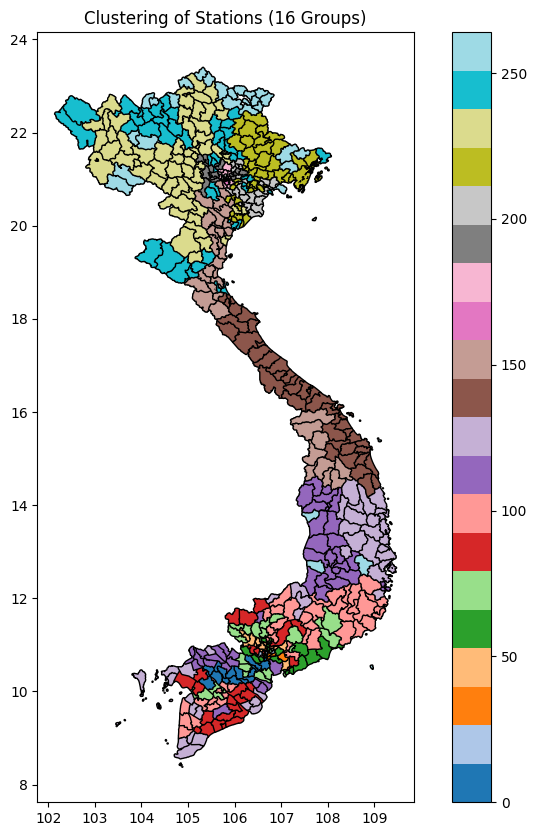

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
gdf_station_final.plot(column="final_cluster", cmap="tab20", legend=True, edgecolor="black", ax=ax)
plt.title("Clustering of Stations (16 Groups)")
plt.show()


# Cluster GIS by province

In [ ]:
open = client.open_by_url('https://docs.google.com/spreadsheets/d/1_uANUsnRykuUCoHpib9d479pG74T6q9o3SN30utjYKQ/edit?gid=389953746#gid=389953746')
wks_province = open.worksheet('Province')
data_province = wks_province.get_all_values()
df_province = pd.DataFrame(data_province[1:], columns=data_province[0])
# Assuming your DataFrame is called 'df_province'

columns_to_convert = ["Avg_vols"]

for column in columns_to_convert:
    df_province[column] = pd.to_numeric(df_province[column], errors='coerce').astype(float)

wks_coverage = open.worksheet('Coverage')
data_coverage = wks_coverage.get_all_values()
df_coverage= pd.DataFrame(data_coverage[1:], columns=data_coverage[0])

In [ ]:
import geopandas as gpd
import pandas as pd

# Đọc file SHP
gdf = gpd.read_file("/content/gadm41_VNM_3.shp")  # Điều chỉnh đường dẫn nếu cần

# Kiểm tra cột để chắc chắn có GID_3
print(gdf.columns)

# Merge df_coverage vào gdf dựa trên GID_3
gdf = gdf.merge(df_coverage[["GID_3","Province"]], on="GID_3", how="left")

# Kiểm tra kết quả
print(gdf.head())

Index(['GID_3', 'GID_0', 'COUNTRY', 'GID_1', 'NAME_1', 'NL_NAME_1', 'GID_2',
       'NAME_2', 'NL_NAME_2', 'NAME_3', 'VARNAME_3', 'NL_NAME_3', 'TYPE_3',
       'ENGTYPE_3', 'CC_3', 'HASC_3', 'geometry'],
      dtype='object')
         GID_3 GID_0  COUNTRY    GID_1    NAME_1 NL_NAME_1      GID_2  NAME_2  \
0  VNM.1.1.1_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
1  VNM.1.1.2_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
2  VNM.1.1.3_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
3  VNM.1.1.4_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
4  VNM.1.1.5_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   

  NL_NAME_2      NAME_3   VARNAME_3 NL_NAME_3    TYPE_3 ENGTYPE_3 CC_3 HASC_3  \
0        NA      An Phú      An Phu        NA  Thị trấn   Townlet   NA     NA   
1        NA    Đa Phước    Da Phuoc        NA        Xã      Ward   NA     NA   
2        NA    Khánh An    Khanh An        N

Hợp nhất vùng địa lý

In [ ]:
import geopandas as gpd
from shapely.ops import unary_union

# 🔹 BƯỚC 1: Hợp nhất vùng phủ của từng province_name
from shapely.ops import unary_union

buffer_size = 0.01  # Điều chỉnh kích thước buffer theo đơn vị CRS

# 🔹 Bước 1: Tăng buffer từng vùng trước khi hợp nhất
gdf["geometry"] = gdf["geometry"].buffer(buffer_size)

# 🔹 Bước 2: Hợp nhất vùng đã buffer
gdf_merged = gdf.groupby("Province")["geometry"].apply(unary_union).reset_index()


# 🔹 BƯỚC 2: Giữ lại thông tin province_ID và Region từ df_coverage
df_province_coverage = df_coverage.groupby("Province").agg(
    province_ID=("LEVEL_1", "first")
).reset_index()

# 🔹 BƯỚC 3: Merge lại với gdf để gán vùng phủ địa lý đã hợp nhất
gdf_final = df_province_coverage.merge(gdf_merged[["Province", "geometry"]], on="Province", how="left")

# 🔹 BƯỚC 4: Merge lại vào df_province để mỗi province_name chỉ có 1 vùng phủ
df_province_final = df_province.merge(gdf_final, on="Province", how="left")

# Kiểm tra kết quả
print(df_province_final.head())


<ipython-input-6-c8b2f72216d5>:10: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["geometry"] = gdf["geometry"].buffer(buffer_size)


    Province    LEVEL_1 Region  Avg_vols Station_number manual_cluster  \
0   An Giang   An Giang  South   44804.0              7             11   
1   Vũng Tàu   Vũng Tàu  South   76891.0              8              8   
2  Bắc Giang  Bắc Giang  North   57653.0             11              1   
3    Bắc Kạn    Bắc Kạn  North    8640.0              7              0   
4   Bạc Liêu   Bạc Liêu  South   32574.0              4             12   

  Display_name IC IC Assistant province_ID  \
0     An Giang  6            0    An Giang   
1     Vũng Tàu  7            4    Vũng Tàu   
2    Bắc Giang  8            2   Bắc Giang   
3      Bắc Kạn  0            0     Bắc Kạn   
4     Bạc Liêu  4            0    Bạc Liêu   

                                            geometry  
0  POLYGON ((105.08589 10.26448, 105.03584 10.293...  
1  POLYGON ((107.06556 10.32471, 107.0638 10.3272...  
2  POLYGON ((106.07222 21.20689, 106.07122 21.207...  
3  POLYGON ((105.6445 22.01353, 105.64392 22.0127...  
4  

In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
import networkx as nx
from scipy.spatial import KDTree
from sklearn.cluster import SpectralClustering

gdf_province_final = df_province_final
# Chuyển DataFrame thành GeoDataFrame (nếu chưa phải)
if not isinstance(gdf_province_final, gpd.GeoDataFrame):
    gdf_province_final = gpd.GeoDataFrame(gdf_province_final, geometry="geometry")

gdf_province_final = gdf_province_final.dropna(subset=["geometry"]).reset_index(drop=True)



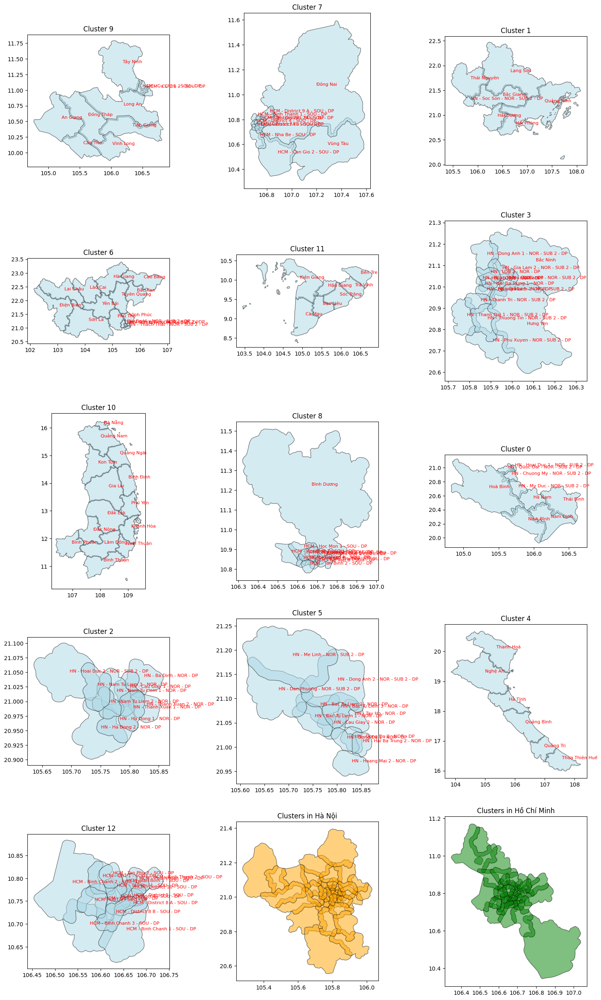

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# ✅ Lấy danh sách các cluster duy nhất
manual_clusters = gdf_province_final["manual_cluster"].unique()

# ✅ Tạo figure với 15 biểu đồ
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 25))  # 5 hàng, 3 cột
axes = axes.flatten()  # Chuyển ma trận subplot thành danh sách

# ✅ Vẽ từng cluster riêng biệt
for i, cluster in enumerate(manual_clusters[:13]):  # Chỉ lấy 13 cluster đầu
    ax = axes[i]
    gdf_cluster = gdf_province_final[gdf_province_final["manual_cluster"] == cluster]

    # ✅ Vẽ tỉnh trong cluster
    gdf_cluster.plot(ax=ax, color="lightblue", edgecolor="black", alpha=0.5)

    # ✅ Annotate province names
    for idx, row in gdf_cluster.iterrows():
        ax.annotate(
            text=row["Province"],
            xy=(row["geometry"].centroid.x, row["geometry"].centroid.y),
            xytext=(3, 3),
            textcoords="offset points",
            fontsize=8,
            color="red"
        )

    ax.set_title(f"Cluster {cluster}")

# ✅ Biểu đồ thứ 14: Hà Nội
ax_hn = axes[13]
gdf_hanoi = gdf_province_final[gdf_province_final["LEVEL_1"] == "Hà Nội"]
gdf_hanoi.plot(ax=ax_hn, color="orange", edgecolor="black", alpha=0.5)
ax_hn.set_title("Clusters in Hà Nội")

# ✅ Biểu đồ thứ 15: Hồ Chí Minh
ax_hcm = axes[14]
gdf_hcm = gdf_province_final[gdf_province_final["LEVEL_1"] == "Hồ Chí Minh"]
gdf_hcm.plot(ax=ax_hcm, color="green", edgecolor="black", alpha=0.5)
ax_hcm.set_title("Clusters in Hồ Chí Minh")

# ✅ Hiển thị biểu đồ
plt.tight_layout()
plt.show()


In [ ]:
import geopandas as gpd
import pandas as pd
import networkx as nx

# ✅ Bước 1: Tạo Graph với node là province, edge là quan hệ giáp ranh
G = nx.Graph()
for i, row in gdf_province_final.iterrows():
    G.add_node(row["Province"], avg=row["Avg_vols"])

for i, row1 in gdf_province_final.iterrows():
    for j, row2 in gdf_province_final.iterrows():
        if i < j and row1["geometry"].intersects(row2["geometry"]):
            G.add_edge(row1["Province"], row2["Province"])

In [ ]:
import numpy as np
import pandas as pd

def compute_clusters(target_Avg_vols, current_province, gdf_province_final, G):
    lower_bound = target_Avg_vols * 1
    upper_bound = target_Avg_vols * 1.1

    unassigned_provinces = set(gdf_province_final["Province"])
    clusters = {}
    cluster_index = 0
    previous_cluster = set()

    while unassigned_provinces:
        # ✅ Chọn province bắt đầu
        if cluster_index == 0:
            start_province = current_province
        else:
            candidates = {s for s in unassigned_provinces if any(n in previous_cluster for n in G.neighbors(s))}
            if not candidates:
                candidates = unassigned_provinces
            start_province = max(candidates, key=lambda s: gdf_province_final.loc[gdf_province_final["Province"] == s, "Avg_vols"].values[0])

        current_cluster = {start_province}
        current_total_Avg_vols = gdf_province_final.loc[gdf_province_final["Province"] == start_province, "Avg_vols"].values[0]
        unassigned_provinces.remove(start_province)

        while current_total_Avg_vols < lower_bound:
            adjacent_provinces = {s for province in current_cluster for s in G.neighbors(province)}
            adjacent_provinces = adjacent_provinces & unassigned_provinces

            if not adjacent_provinces:
                break

            best_next_province = max(adjacent_provinces, key=lambda s: len(set(G.neighbors(s)) & current_cluster))
            best_next_Avg_vols = gdf_province_final.loc[gdf_province_final["Province"] == best_next_province, "Avg_vols"].values[0]

            if current_total_Avg_vols + best_next_Avg_vols > upper_bound:
                break

            current_cluster.add(best_next_province)
            current_total_Avg_vols += best_next_Avg_vols
            unassigned_provinces.remove(best_next_province)

        for province in current_cluster:
            clusters[province] = cluster_index

        previous_cluster.update(current_cluster)
        cluster_index += 1

    # ✅ Lưu kết quả
    gdf_province_final["final_cluster"] = gdf_province_final["Province"].map(clusters)
    df_cluster = gdf_province_final.groupby("final_cluster")["Avg_vols"].sum().reset_index()

    # ✅ Tính phương sai
    variance = np.var(df_cluster["Avg_vols"].values)

    return gdf_province_final, df_cluster, variance


In [ ]:
import heapq

best_results = []  # Heap lưu top 10 kết quả có phương sai nhỏ nhất
gdf_province_final_filter = gdf_province_final.copy()

# ✅ Lọc dữ liệu khi Region là "North" hoặc "HN"
gdf_province_final_filter = gdf_province_final_filter[
    gdf_province_final_filter["Region"].isin(["North", "HN"])
]

filtered_provinces = gdf_province_final_filter.loc[~gdf_province_final_filter["LEVEL_1"].isin(["Hà Nội", "Hồ Chí Minh"]), "Province"].unique()
target_vols_range = range(330000, 440000, 10000)  # 500,000 → 600,000

for target_Avg_vols in target_vols_range:
    print("Target: ",target_Avg_vols)
    for current_province in filtered_provinces:
        # print("Province: ",current_province)
        gdf_result, df_cluster, variance = compute_clusters(target_Avg_vols, current_province, gdf_province_final_filter.copy(), G)
        # print(len(df_cluster))
        # ✅ Chỉ lưu nếu số cluster <= 20
        if len(df_cluster) <= 8 :
            # ✅ Nếu chưa đủ 10 kết quả hoặc có variance nhỏ hơn kết quả lớn nhất trong heap
            if len(best_results) < 10:
                heapq.heappush(best_results, (-variance, target_Avg_vols, len(df_cluster), current_province, gdf_result, df_cluster, variance))
            else:
                heapq.heappushpop(best_results, (-variance, target_Avg_vols, len(df_cluster), current_province, gdf_result, df_cluster, variance))

# ✅ Chuyển kết quả thành danh sách (top 10 best variance)
top_10_results = sorted(best_results, key=lambda x: x[6])  # Sắp xếp theo variance tăng dần

# ✅ Hiển thị kết quả
for i, (_, target, cluster_count, province, gdf_res, df_clust, var) in enumerate(top_10_results, 1):
    print(f"Rank {i}: target={target}, clusters={cluster_count}, province={province}, variance={var:.2f}")


Target:  330000
Target:  340000
Target:  350000
Target:  360000
Target:  370000
Target:  380000
Target:  390000
Target:  400000
Target:  410000
Target:  420000
Target:  430000
Rank 1: target=340000, clusters=7, province=Hưng Yên, variance=6708038865.39
Rank 2: target=350000, clusters=7, province=Hưng Yên, variance=8081080311.39
Rank 3: target=360000, clusters=7, province=Hưng Yên, variance=9091779025.67
Rank 4: target=330000, clusters=8, province=Hà Nam, variance=9883281325.25
Rank 5: target=330000, clusters=8, province=Ninh Bình, variance=9883281325.25
Rank 6: target=330000, clusters=8, province=Thái Bình, variance=9883281325.25
Rank 7: target=330000, clusters=8, province=Thanh Hoá, variance=9883281325.25
Rank 8: target=330000, clusters=8, province=Nam Định, variance=9883281325.25
Rank 9: target=400000, clusters=6, province=Hưng Yên, variance=10293517616.22
Rank 10: target=410000, clusters=6, province=Hưng Yên, variance=10476677799.22


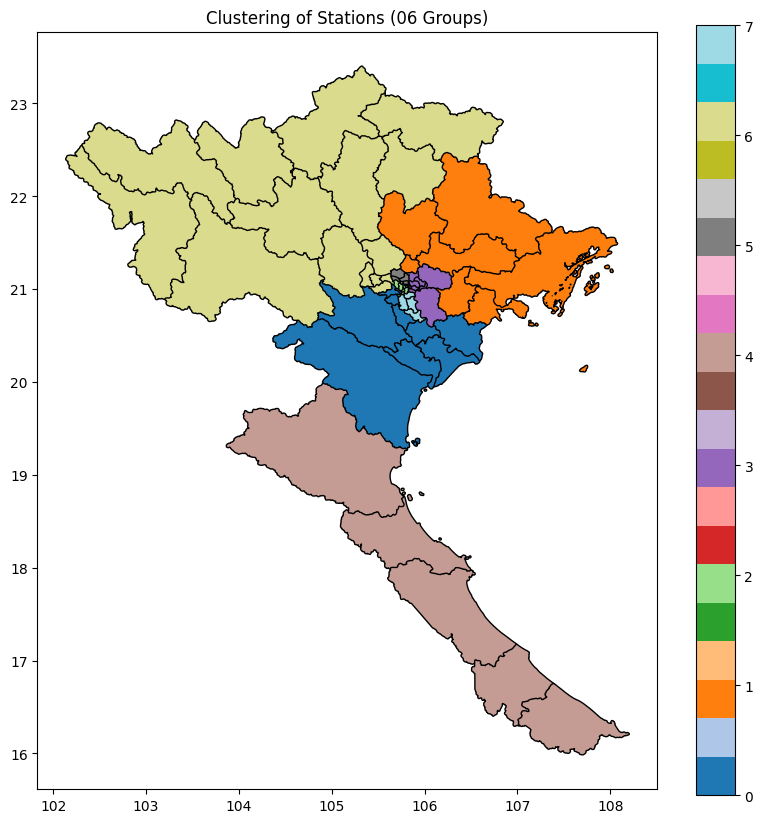

In [ ]:
# target_Avg_vols = 490000
# current_province = "Đồng Nai"

# gdf_optimize, df_cluster_op, variance_op = compute_clusters(target_Avg_vols, current_province, gdf_province_final, G)
# gdf_optimize_11 = gdf_optimize.copy
# # print(len(df_cluster_op))
# # print(df_cluster_op)
# # print(variance_op)


import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
top_10_results[7][4].plot(column="final_cluster", cmap="tab20", legend=True, edgecolor="black", ax=ax)
plt.title("Clustering of Stations (06 Groups)")
plt.show()


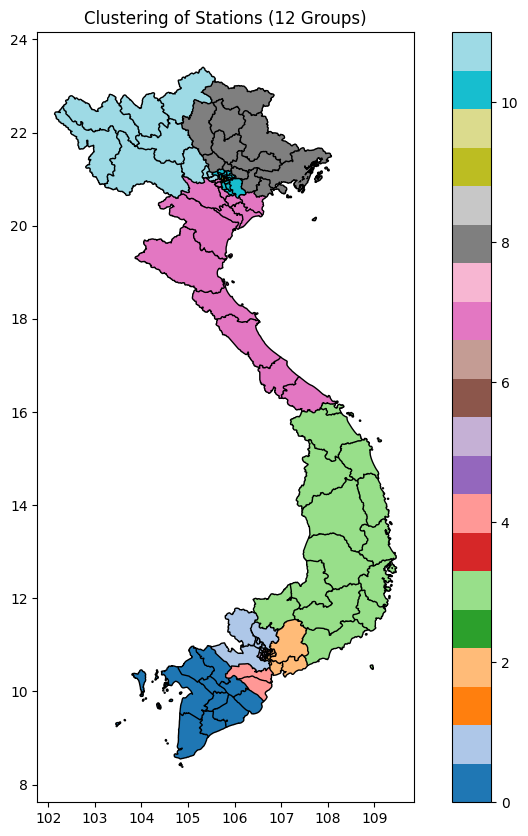

In [ ]:
target_Avg_vols = 490000
current_province = "Bạc Liêu"

gdf_optimize, df_cluster_op, variance_op = compute_clusters(target_Avg_vols, current_province, gdf_province_final, G)
gdf_optimize_12 = gdf_optimize.copy()
# print(len(df_cluster_op))
# print(df_cluster_op)
# print(variance_op)


import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
gdf_optimize_12.plot(column="final_cluster", cmap="tab20", legend=True, edgecolor="black", ax=ax)
plt.title("Clustering of Stations (12 Groups)")
plt.show()


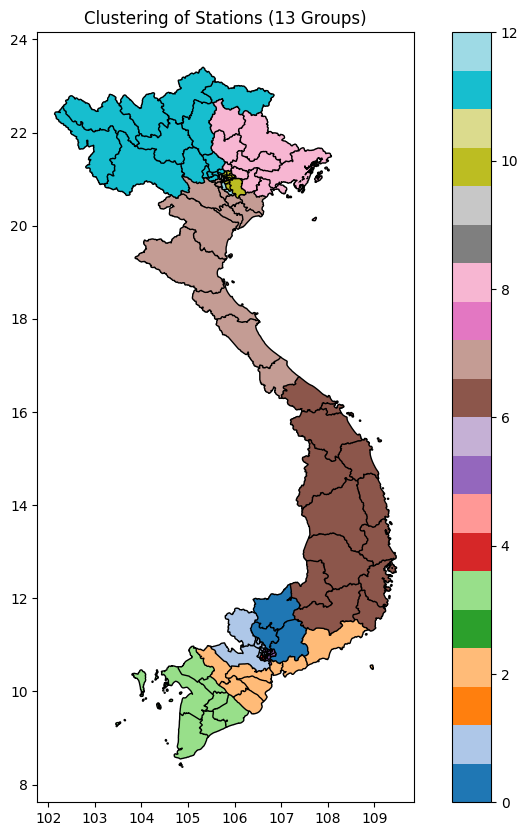

In [ ]:
target_Avg_vols = 420000
current_province = "Bình Phước"

gdf_optimize, df_cluster_op, variance_op = compute_clusters(target_Avg_vols, current_province, gdf_province_final, G)
gdf_optimize_13 = gdf_optimize.copy()
# print(len(df_cluster_op))
# print(df_cluster_op)
# print(variance_op)


import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
gdf_optimize_13.plot(column="final_cluster", cmap="tab20", legend=True, edgecolor="black", ax=ax)
plt.title("Clustering of Stations (13 Groups)")
plt.show()


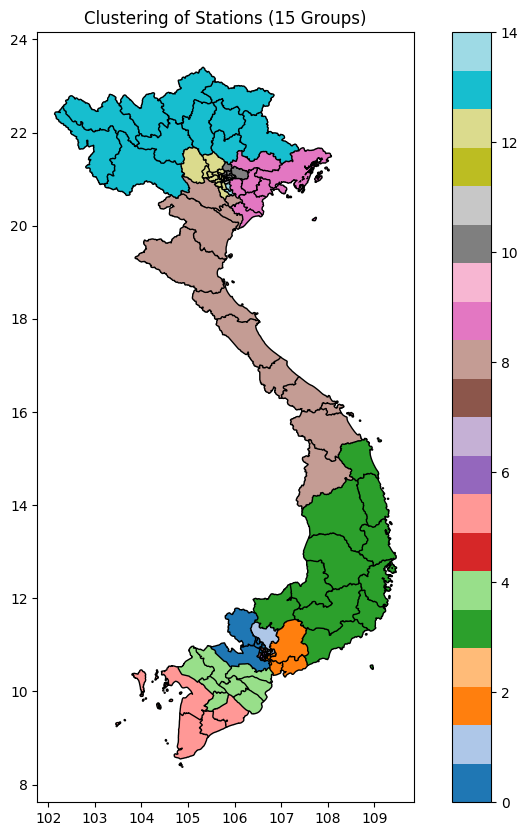

In [ ]:
target_Avg_vols = 400000
current_province = "Long An"

gdf_optimize, df_cluster_op, variance_op = compute_clusters(target_Avg_vols, current_province, gdf_province_final, G)
gdf_optimize_15 = gdf_optimize.copy()
# print(len(df_cluster_op))
# print(df_cluster_op)
# print(variance_op)


import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
gdf_optimize_15.plot(column="final_cluster", cmap="tab20", legend=True, edgecolor="black", ax=ax)
plt.title("Clustering of Stations (15 Groups)")
plt.show()


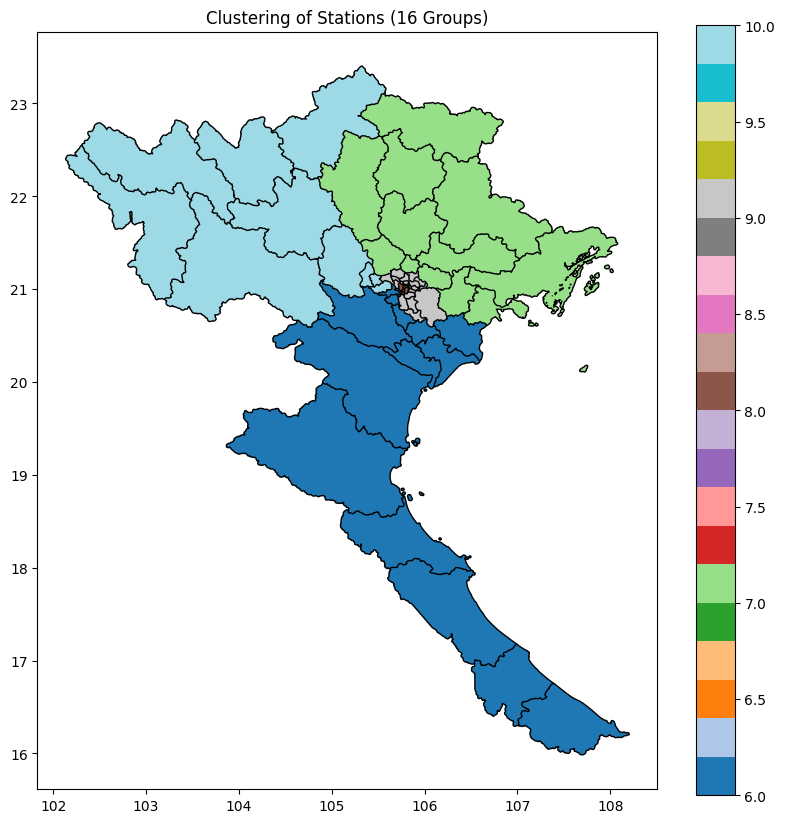

In [ ]:
gdf_result =  top_10_results[5][4]
gdf_result =  gdf_optimize_11
# ✅ Tìm danh sách các cụm có ít nhất một tỉnh thuộc Hà Nội
clusters_with_hanoi = gdf_result.loc[gdf_result["LEVEL_1"] == "Hà Nội", "final_cluster"].unique()

# ✅ Lọc lại DataFrame để giữ các cụm này
gdf_result_HaNoi = gdf_result[gdf_result["final_cluster"].isin(clusters_with_hanoi)]


fig, ax = plt.subplots(figsize=(10, 10))
gdf_result_HaNoi.plot(column="final_cluster", cmap="tab20", legend=True, edgecolor="black", ax=ax)
plt.title("Clustering of Stations (16 Groups)")
plt.show()


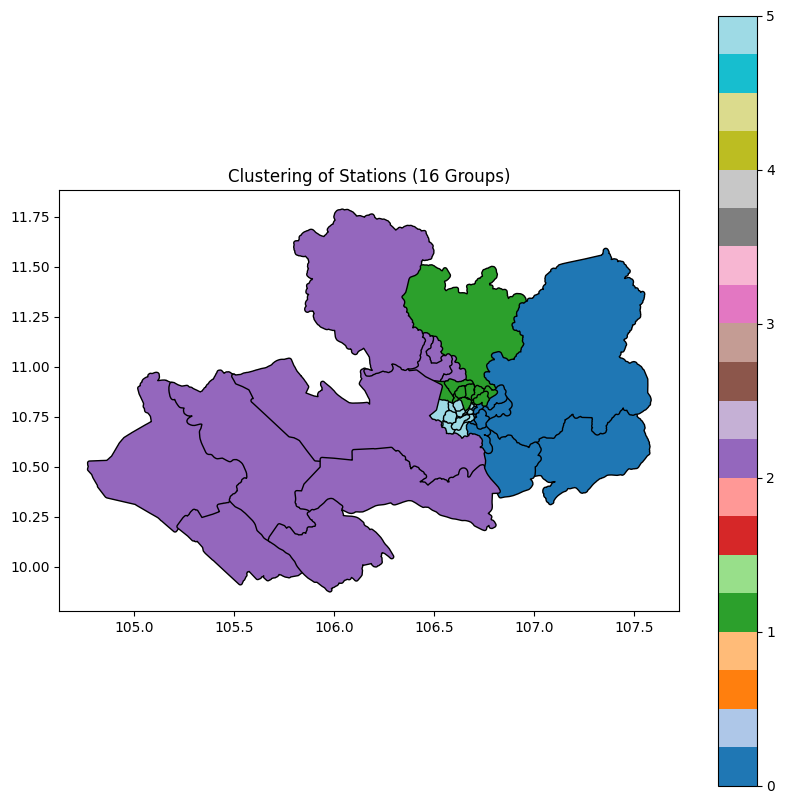

In [ ]:
gdf_result =  top_10_results[5][4]
gdf_result =  gdf_optimize_11
# ✅ Tìm danh sách các cụm có ít nhất một tỉnh thuộc Hà Nội
clusters_with_hcm = gdf_result.loc[gdf_result["LEVEL_1"] == "Hồ Chí Minh", "final_cluster"].unique()

# ✅ Lọc lại DataFrame để giữ các cụm này
gdf_result_hcm = gdf_result[gdf_result["final_cluster"].isin(clusters_with_hcm)]


fig, ax = plt.subplots(figsize=(10, 10))
gdf_result_hcm.plot(column="final_cluster", cmap="tab20", legend=True, edgecolor="black", ax=ax)
plt.title("Clustering of Stations (16 Groups)")
plt.show()


In [ ]:
import pandas as pd

# ✅ Thêm cột "source" trước khi nối



gdf_optimize_11["source"] = "gdf_optimize_11"
gdf_optimize_12["source"] = "gdf_optimize_12"
gdf_optimize_13["source"] = "gdf_optimize_13"
gdf_optimize_15["source"] = "gdf_optimize_15"


# ✅ Nối các DataFrame lại với nhau
gdf_combined = pd.concat([gdf_optimize_11, gdf_optimize_12, gdf_optimize_13, gdf_optimize_15], ignore_index=True)


result_ghseet = gdf_combined

result_ghseet = result_ghseet.drop(columns=['geometry'])  # Remove the 'geometry' column


,Province,LEVEL_1,Avg_vols,province_ID,geometry,final_cluster,source
0,An Giang,An Giang,44804.0,An Giang,"POLYGON ((105.08589 10.26448, 105.03584 10.293...",2,gdf_optimize_11
1,Vũng Tàu,Vũng Tàu,76891.0,Vũng Tàu,"POLYGON ((107.06556 10.32471, 107.0638 10.3272...",0,gdf_optimize_11
2,Bắc Giang,Bắc Giang,57653.0,Bắc Giang,"POLYGON ((106.07222 21.20689, 106.07122 21.207...",7,gdf_optimize_11
3,Bắc Kạn,Bắc Kạn,8640.0,Bắc Kạn,"POLYGON ((105.6445 22.01353, 105.64392 22.0127...",7,gdf_optimize_11
4,Bạc Liêu,Bạc Liêu,32574.0,Bạc Liêu,"POLYGON ((105.40295 9.03731, 105.40232 9.03825...",4,gdf_optimize_11
...,...,...,...,...,...,...,...
138,Trà Vinh,Trà Vinh,31498.0,Trà Vinh,"POLYGON ((106.1651 9.67807, 106.16423 9.67894,...",4,gdf_optimize_11
139,Tuyên Quang,Tuyên Quang,22452.0,Tuyên Quang,"POLYGON ((105.13646 21.68704, 105.13542 21.686...",7,gdf_optimize_11
140,Vĩnh Long,Vĩnh Long,36955.0,Vĩnh Long,"POLYGON ((105.81768 10.00004, 105.8133 10.0069...",2,gdf_optimize_11
141,Vĩnh Phúc,Vĩnh Phúc,35261.0,Vĩnh Phúc,"POLYGON ((105.45851 21.17966, 105.45823 21.180...",7,gdf_optimize_11


In [ ]:
spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1_uANUsnRykuUCoHpib9d479pG74T6q9o3SN30utjYKQ/edit?gid=1026443201#gid=1026443201') ## updated_data
wks = spr.worksheet('Result')
# Xóa dữ liệu trong range A10:U
wks.batch_clear(['A:F'])

# Select columns from 1 to 500000 (adjust if column names are different)


set_with_dataframe(wks, result_ghseet, row=1, col=1, include_index=False, include_column_header=True)

In [ ]:
result_ghseet = top_10_results[7][4]

result_ghseet = result_ghseet.drop(columns=['geometry'])  # Remove the 'geometry' column

spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1_uANUsnRykuUCoHpib9d479pG74T6q9o3SN30utjYKQ/edit?gid=1026443201#gid=1026443201') ## updated_data
wks = spr.worksheet('Result_only_North')
# Xóa dữ liệu trong range A10:U
wks.batch_clear(['A:F'])

# Select columns from 1 to 500000 (adjust if column names are different)


set_with_dataframe(wks, result_ghseet, row=1, col=1, include_index=False, include_column_header=True)

# Manual Cluster

In [ ]:
open = client.open_by_url('https://docs.google.com/spreadsheets/d/1_uANUsnRykuUCoHpib9d479pG74T6q9o3SN30utjYKQ/edit?gid=389953746#gid=389953746')
wks_province = open.worksheet('Province')
data_province = wks_province.get_all_values()
df_province = pd.DataFrame(data_province[1:], columns=data_province[0])
# Assuming your DataFrame is called 'df_province'

columns_to_convert = ["Avg_vols"]

for column in columns_to_convert:
    df_province[column] = pd.to_numeric(df_province[column], errors='coerce').astype(float)

wks_coverage = open.worksheet('Coverage')
data_coverage = wks_coverage.get_all_values()
df_coverage= pd.DataFrame(data_coverage[1:], columns=data_coverage[0])

In [ ]:
import geopandas as gpd
import pandas as pd

# Đọc file SHP
gdf = gpd.read_file("/content/gadm41_VNM_3.shp")  # Điều chỉnh đường dẫn nếu cần

# Kiểm tra cột để chắc chắn có GID_3
print(gdf.columns)

# Merge df_coverage vào gdf dựa trên GID_3
gdf = gdf.merge(df_coverage[["GID_3","Province"]], on="GID_3", how="left")

# Kiểm tra kết quả
print(gdf.head())

Index(['GID_3', 'GID_0', 'COUNTRY', 'GID_1', 'NAME_1', 'NL_NAME_1', 'GID_2',
       'NAME_2', 'NL_NAME_2', 'NAME_3', 'VARNAME_3', 'NL_NAME_3', 'TYPE_3',
       'ENGTYPE_3', 'CC_3', 'HASC_3', 'geometry'],
      dtype='object')
         GID_3 GID_0  COUNTRY    GID_1    NAME_1 NL_NAME_1      GID_2  NAME_2  \
0  VNM.1.1.1_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
1  VNM.1.1.2_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
2  VNM.1.1.3_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
3  VNM.1.1.4_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
4  VNM.1.1.5_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   

  NL_NAME_2      NAME_3   VARNAME_3 NL_NAME_3    TYPE_3 ENGTYPE_3 CC_3 HASC_3  \
0        NA      An Phú      An Phu        NA  Thị trấn   Townlet   NA     NA   
1        NA    Đa Phước    Da Phuoc        NA        Xã      Ward   NA     NA   
2        NA    Khánh An    Khanh An        N

In [ ]:
import geopandas as gpd
from shapely.ops import unary_union

# 🔹 BƯỚC 1: Hợp nhất vùng phủ của từng province_name
from shapely.ops import unary_union

buffer_size = 0.0001  # Điều chỉnh kích thước buffer theo đơn vị CRS

# 🔹 Bước 1: Tăng buffer từng vùng trước khi hợp nhất
gdf["geometry"] = gdf["geometry"].buffer(buffer_size)

# 🔹 Bước 2: Hợp nhất vùng đã buffer
gdf_merged = gdf.groupby("Province")["geometry"].apply(unary_union).reset_index()


# 🔹 BƯỚC 2: Giữ lại thông tin province_ID và Region từ df_coverage
df_province_coverage = df_coverage.groupby("Province").agg(
    province_ID=("LEVEL_1", "first")
).reset_index()

# 🔹 BƯỚC 3: Merge lại với gdf để gán vùng phủ địa lý đã hợp nhất
gdf_final = df_province_coverage.merge(gdf_merged[["Province", "geometry"]], on="Province", how="left")

# 🔹 BƯỚC 4: Merge lại vào df_province để mỗi province_name chỉ có 1 vùng phủ
df_province_final = df_province.merge(gdf_final, on="Province", how="left")

# Kiểm tra kết quả
print(df_province_final.head())


<ipython-input-14-c723ffa10e5f>:10: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["geometry"] = gdf["geometry"].buffer(buffer_size)


    Province    LEVEL_1 Region  Avg_vols Station_number manual_cluster  \
0   An Giang   An Giang  South   44804.0              7       Miền Tây   
1   Vũng Tàu   Vũng Tàu  South   76891.0              8        HCM Nam   
2  Bắc Giang  Bắc Giang  North   57653.0             11       Đông Bắc   
3    Bắc Kạn    Bắc Kạn  North    8640.0              7        Tây Bắc   
4   Bạc Liêu   Bạc Liêu  South   32574.0              4       Miền Tây   

  Display_name IC IC Assistant province_ID  \
0     An Giang  6            0    An Giang   
1     Vũng Tàu  7            4    Vũng Tàu   
2    Bắc Giang  8            2   Bắc Giang   
3      Bắc Kạn  0            0     Bắc Kạn   
4     Bạc Liêu  4            0    Bạc Liêu   

                                            geometry  
0  POLYGON ((105.09088 10.27303, 105.04081 10.302...  
1  MULTIPOLYGON (((107.08886 10.32327, 107.08885 ...  
2  POLYGON ((106.04386 21.21706, 106.04258 21.214...  
3  POLYGON ((105.64554 22.02478, 105.64553 22.024...  
4  

In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
import networkx as nx
from scipy.spatial import KDTree
from sklearn.cluster import SpectralClustering

gdf_province_final = df_province_final
# Chuyển DataFrame thành GeoDataFrame (nếu chưa phải)
if not isinstance(gdf_province_final, gpd.GeoDataFrame):
    gdf_province_final = gpd.GeoDataFrame(gdf_province_final, geometry="geometry")

gdf_province_final = gdf_province_final.dropna(subset=["geometry"]).reset_index(drop=True)



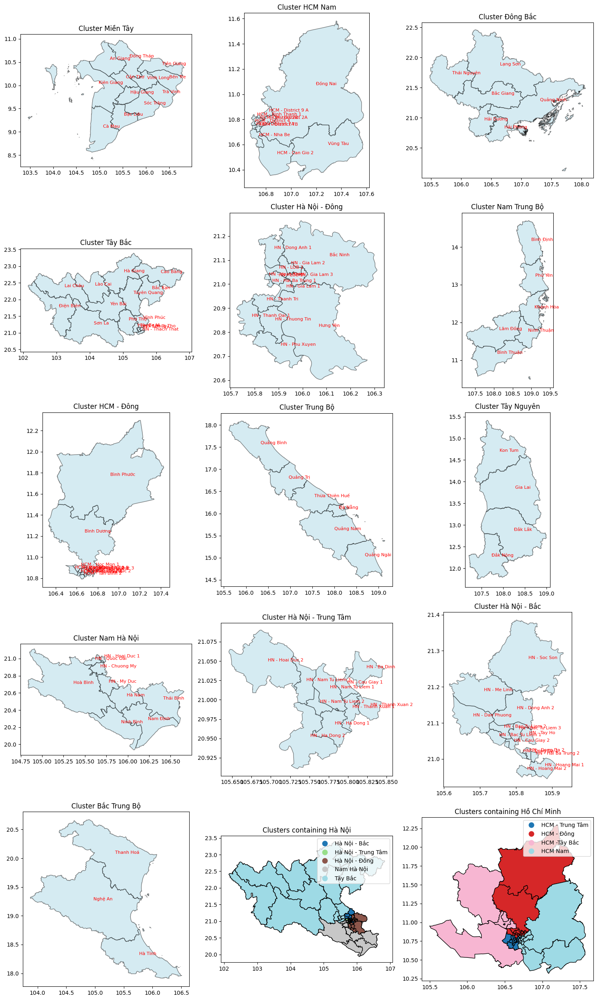

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# ✅ Chuyển manual_cluster sang số
def extract_number(cluster):
    """Trích xuất số từ chuỗi cluster, nếu không có thì đặt giá trị lớn để đẩy về cuối."""
    try:
        return int(''.join(filter(str.isdigit, str(cluster))))  # Lấy số trong chuỗi
    except ValueError:
        return np.inf  # Nếu không có số, đẩy về cuối danh sách

# ✅ Sắp xếp manual_cluster theo số tự nhiên
manual_clusters = sorted(gdf_province_final["manual_cluster"].unique(), key=extract_number)

# ✅ Tạo figure với 15 biểu đồ
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 25))  # 5 hàng, 3 cột
axes = axes.flatten()  # Chuyển ma trận subplot thành danh sách

# ✅ Vẽ từng cluster riêng biệt theo thứ tự số
for i, cluster in enumerate(manual_clusters[:13]):  # Chỉ lấy 13 cluster đầu tiên
    ax = axes[i]
    gdf_cluster = gdf_province_final[gdf_province_final["manual_cluster"] == cluster]

    # ✅ Vẽ các tỉnh trong cluster
    gdf_cluster.plot(ax=ax, color="lightblue", edgecolor="black", alpha=0.5)

    # ✅ Annotate province names
    for idx, row in gdf_cluster.iterrows():
        ax.annotate(
            text=row["Display_name"],
            xy=(row["geometry"].centroid.x, row["geometry"].centroid.y),
            xytext=(3, 3),
            textcoords="offset points",
            fontsize=8,
            color="red"
        )

    ax.set_title(f"Cluster {cluster}")

# ✅ Biểu đồ thứ 14: Các cluster chứa Hà Nội
ax_hn = axes[13]
clusters_with_hanoi = sorted(
    gdf_province_final.loc[gdf_province_final["LEVEL_1"] == "Hà Nội", "manual_cluster"].unique(),
    key=extract_number
)
gdf_hanoi_clusters = gdf_province_final[gdf_province_final["manual_cluster"].isin(clusters_with_hanoi)]
gdf_hanoi_clusters.plot(column="manual_cluster", cmap="tab20", legend=True, edgecolor="black", ax=ax_hn)
ax_hn.set_title("Clusters containing Hà Nội")

# ✅ Biểu đồ thứ 15: Các cluster chứa Hồ Chí Minh
ax_hcm = axes[14]
clusters_with_hcm = sorted(
    gdf_province_final.loc[gdf_province_final["LEVEL_1"] == "Hồ Chí Minh", "manual_cluster"].unique(),
    key=extract_number
)
gdf_hcm_clusters = gdf_province_final[gdf_province_final["manual_cluster"].isin(clusters_with_hcm)]
gdf_hcm_clusters.plot(column="manual_cluster", cmap="tab20", legend=True, edgecolor="black", ax=ax_hcm)
ax_hcm.set_title("Clusters containing Hồ Chí Minh")

# ✅ Hiển thị biểu đồ
plt.tight_layout()
plt.show()


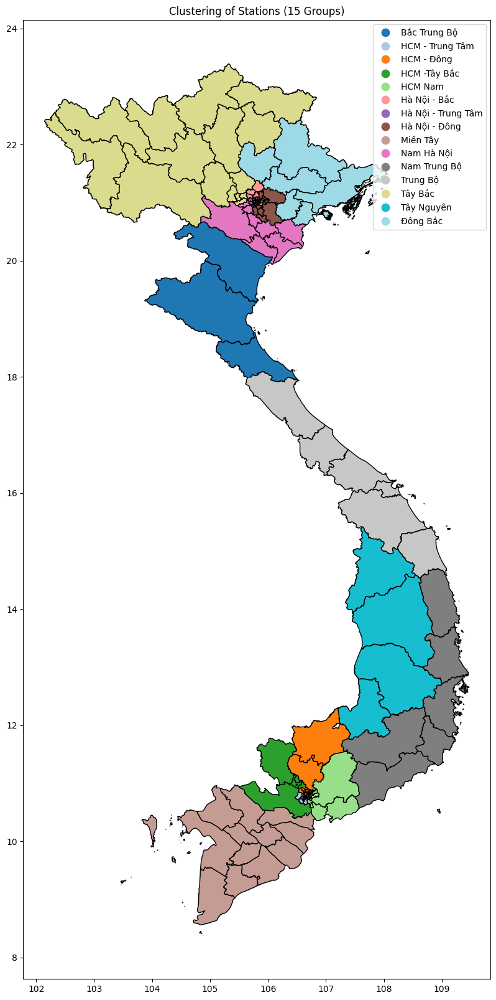

In [ ]:

fig, ax = plt.subplots(figsize=(20, 20))
gdf_province_final.plot(column="manual_cluster", cmap="tab20", legend=True, edgecolor="black", ax=ax)
plt.title("Clustering of Stations (15 Groups)")
plt.show()


# Cut coverage setup



In [4]:
open = client.open_by_url('https://docs.google.com/spreadsheets/d/1hQ9FOqn9ASi4kxdVx8sASuBMtOtbH5v67HEMUdzTLYw/edit?gid=747303008#gid=747303008')
wks_station = open.worksheet('Hub plot')
data_station = wks_station.get_all_values()
df_hub = pd.DataFrame(data_station[1:], columns=data_station[0])


wks_coverage = open.worksheet('Plot')
data_coverage = wks_coverage.get_all_values()
df_coverage= pd.DataFrame(data_coverage[1:], columns=data_coverage[0])

wks_WHS = open.worksheet('WH plot')
data_WHS = wks_WHS.get_all_values()
df_WHS= pd.DataFrame(data_WHS[1:], columns=data_WHS[0])

wks_interzone = open.worksheet('Intrazone plot')
data_interzone = wks_interzone.get_all_values()
df_interzone= pd.DataFrame(data_interzone[1:], columns=data_interzone[0])

wks_interzone_hightland = open.worksheet('New_freight')
data_interzone_hightland = wks_interzone_hightland.get_all_values()
df_interzone_hightland= pd.DataFrame(data_interzone_hightland[1:], columns=data_interzone_hightland[0])

In [5]:
import geopandas as gpd
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString



# Đọc file SHP
gdf = gpd.read_file("/content/gadm41_VNM_3.shp")  # Điều chỉnh đường dẫn nếu cần



# Đọc dữ liệu mạng lưới đường từ file SHP
g_road = gpd.read_file("/content/vnm_rdsl_2015_OSM.shp")


In [6]:
# Kiểm tra cột để chắc chắn có GID_3
# print(gdf.columns)

# Merge df_coverage vào gdf dựa trên GID_3
gdf = gdf.merge(df_coverage[["GID_3","Station_ID", "Station_name"]], on="GID_3", how="left")

# Kiểm tra kết quả
# print(gdf.head())

In [7]:


import geopandas as gpd
from shapely.ops import unary_union

# 🔹 BƯỚC 1: Hợp nhất vùng phủ của từng hub_name
from shapely.ops import unary_union

buffer_size = 0.001  # Điều chỉnh kích thước buffer theo đơn vị CRS

# 🔹 Bước 1: Tăng buffer từng vùng trước khi hợp nhất
gdf["geometry"] = gdf["geometry"].buffer(buffer_size)

# 🔹 Bước 2: Hợp nhất vùng đã buffer
gdf_merged = gdf.groupby("Station_name")["geometry"].apply(unary_union).reset_index()


# 🔹 BƯỚC 2: Giữ lại thông tin province_ID và Region từ df_coverage
df_hub_coverage = df_coverage.groupby("Station_name").agg(
    province_ID=("Station_ID", "first")
).reset_index()

# 🔹 BƯỚC 3: Merge lại với gdf để gán vùng phủ địa lý đã hợp nhất
gdf_final = df_hub_coverage.merge(gdf_merged[["Station_name", "geometry"]], on="Station_name", how="left")

# 🔹 BƯỚC 4: Merge lại vào để mỗi Station_name chỉ có 1 vùng phủ
df_hub_final = df_hub.merge(gdf_final, on="Station_name", how="left")

# Kiểm tra kết quả
# print(df_hub_final.head())


<ipython-input-7-dfe76708e2a6>:10: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["geometry"] = gdf["geometry"].buffer(buffer_size)


In [8]:
import geopandas as gpd
import numpy as np
import pandas as pd
import networkx as nx
from scipy.spatial import KDTree
from sklearn.cluster import SpectralClustering

gdf_hub_final = df_hub_final
# Chuyển DataFrame thành GeoDataFrame (nếu chưa phải)
if not isinstance(gdf_hub_final, gpd.GeoDataFrame):
    gdf_hub_final = gpd.GeoDataFrame(gdf_hub_final, geometry="geometry")

gdf_hub_final = gdf_hub_final.dropna(subset=["geometry"]).reset_index(drop=True)



In [9]:
from shapely.geometry import Point
import geopandas as gpd

# Lọc ra các giá trị hợp lệ: chứa đúng 1 dấu phẩy
valid_latlong = [
    s.strip() for s in gdf_hub_final["LatLong"].dropna().unique()
    if isinstance(s, str) and s.count(",") == 1
]

# Chuyển thành list các Point (lon, lat)
points = []
for s in valid_latlong:
    lat_str, lon_str = s.strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        points.append(Point(lon, lat))  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu không chuyển được

# Tạo GeoSeries
latlong_points = gpd.GeoSeries(points, crs=gdf_hub_final.crs)


In [10]:
import geopandas as gpd
from shapely.geometry import Point

# Lọc ra các giá trị hợp lệ: chứa đúng 1 dấu phẩy
valid_rows = df_WHS.dropna(subset=["LatLong"])
valid_rows = valid_rows[valid_rows["LatLong"].str.count(",") == 1]

# Chuyển thành danh sách (Hub name, Point)
WHS_data = []
for _, row in valid_rows.iterrows():
    lat_str, lon_str = row["LatLong"].strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        WHS_data.append({"Hub name": row["Hub name (system)"], "geometry": Point(lon, lat)})  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu lỗi

# Tạo GeoDataFrame
WHS_gdf = gpd.GeoDataFrame(WHS_data, crs=gdf_hub_final.crs)

# Kiểm tra kết quả
print(WHS_gdf.head())


                   Hub name                    geometry
0      HN - Long Bien - NOR   POINT (105.90685 21.0318)
1  NGA - Nghe An - NOR - WH   POINT (105.6754 18.64469)
2      HCM - Binh Tan - SOU  POINT (106.53502 10.76663)
3       DNG - Da Nang - SOU  POINT (108.21057 16.03891)
4     KHH - Nha Trang - SOU   POINT (109.15115 12.2624)


In [11]:
# Tạo interzone_gdf group cũ

# Lọc ra các giá trị hợp lệ: chứa đúng 1 dấu phẩy
valid_rows = df_interzone.dropna(subset=["LatLong"])
valid_rows = valid_rows[valid_rows["LatLong"].str.count(",") == 1]

# Chuyển thành danh sách (Hub name, Point)
interzone_data = []
for _, row in valid_rows.iterrows():
    lat_str, lon_str = row["LatLong"].strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        interzone_data.append({"Hub name": row["Hub name"], "geometry": Point(lon, lat), "Group" : row["Group"], "Sort" : row["Sort"] })  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu lỗi

# Tạo GeoDataFrame
interzone_gdf = gpd.GeoDataFrame(interzone_data, crs=gdf_hub_final.crs)

# Kiểm tra kết quả
print(interzone_gdf.head())


                       Hub name                    geometry Group Sort
0     DAK - Buon Ma Thuot - SOU    POINT (108.051 12.71051)   H1A    1
1    DAN - Cu Jut - SOU - SUB 2    POINT (107.8871 12.5849)   H1A    2
2  DAN - Krong No - SOU - SUB 2  POINT (107.86504 12.48397)   H1A    3
3   DAN - Dak Mil - SOU - SUB 2  POINT (107.63466 12.45534)   H1A    4
4   DAN - Tuy Duc - SOU - SUB 2  POINT (107.44812 12.18352)   H1A    5


In [12]:
# Tạo interzone_gdf group hightland mới

# Lọc ra các giá trị hợp lệ: chứa đúng 1 dấu phẩy
valid_rows = df_interzone_hightland.dropna(subset=["LatLong"])
valid_rows = valid_rows[valid_rows["LatLong"].str.count(",") == 1]

# Chuyển thành danh sách (Hub name, Point)
interzone_data_hightland = []
for _, row in valid_rows.iterrows():
    lat_str, lon_str = row["LatLong"].strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        interzone_data_hightland.append({"Hub name": row["Hub name"], "geometry": Point(lon, lat), "Group" : row["Group"], "Sort" : row["Sort"] })  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu lỗi

# Tạo GeoDataFrame
interzone_gdf_hightland = gpd.GeoDataFrame(interzone_data_hightland, crs=gdf_hub_final.crs)
interzone_gdf_hightland["Sort"] = pd.to_numeric(interzone_gdf_hightland["Sort"], errors="coerce")

# Kiểm tra kết quả
print(interzone_gdf_hightland.head())


                        Hub name                    geometry Group  Sort
0           HCM - Binh Tan - SOU  POINT (106.53502 10.76663)  HCM1     1
1  DAN - Dak R'Lap - SOU - SUB 2   POINT (107.5106 11.99591)  HCM1     2
2           DAN - Dak Nong - SOU  POINT (107.70408 11.99396)  HCM1     3
3    DAN - Dak Mil - SOU - SUB 2  POINT (107.63466 12.45534)  HCM1     4
4     DAN - Cu Jut - SOU - SUB 2    POINT (107.8871 12.5849)  HCM1     5


# Cut coverage plot - overview

<ipython-input-17-03c6499fc71e>:16: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


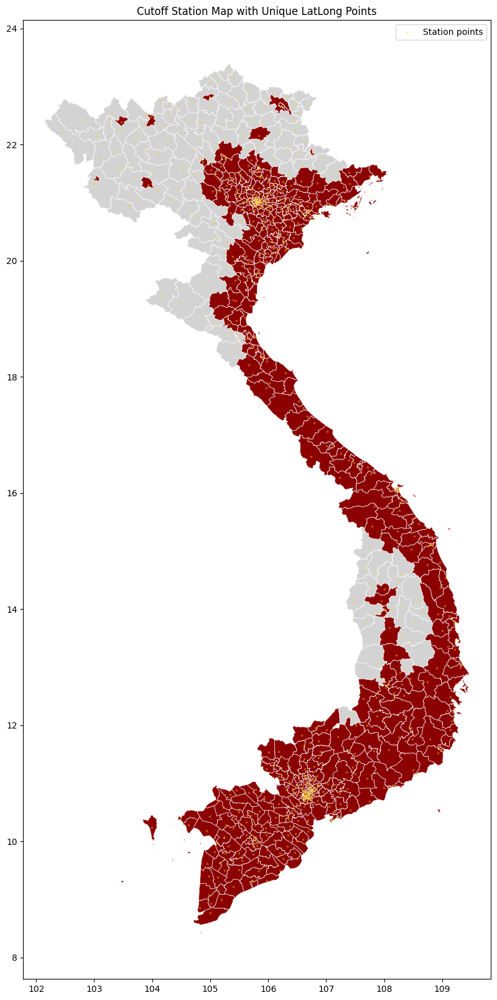

In [17]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(20, 20))

gdf_grey = gdf_hub_final[gdf_hub_final["Cut"] == "1"]
gdf_red = gdf_hub_final[(gdf_hub_final["Cut"] == "0") |
                        (gdf_hub_final["Station_name"].isin(["DAN - Krong No - SOU - SUB 2", "DAN - Dak Glong - SOU - SUB 2"]))]

gdf_grey.plot(ax=ax, color="lightgrey", edgecolor="white", linewidth=0.5, label="Cut = 1")
gdf_red.plot(ax=ax, color="darkred", edgecolor="white", linewidth=0.5, label="Cut = 0")

latlong_points.plot(ax=ax, color="gold",alpha=0.3, markersize=3, label="Station points")
# WHS_points.plot(ax=ax, color="gold",alpha=0.3, markersize=3, label="LatLong points")

plt.title("Cutoff Station Map with Unique LatLong Points")
plt.legend()
plt.show()


<ipython-input-14-902b937b4292>:24: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="upper right")


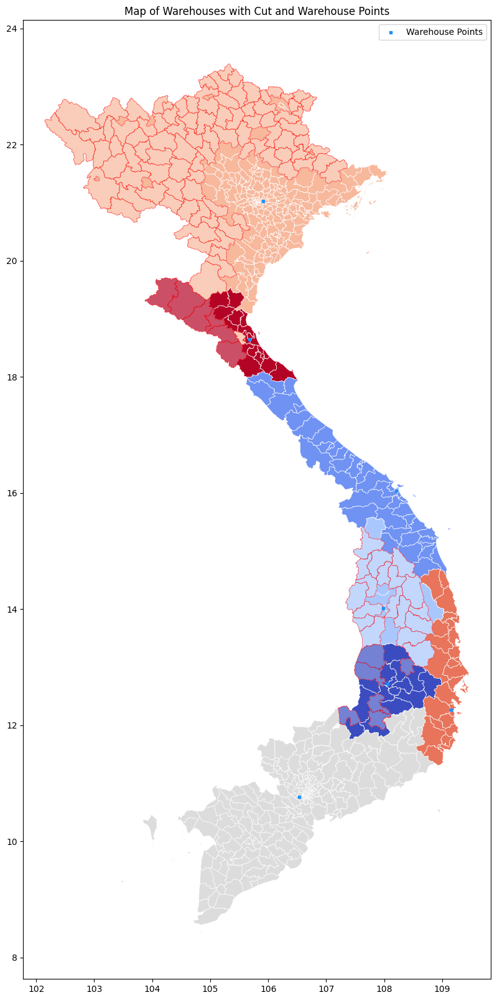

In [14]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Vẽ bản đồ với gdf_hub_final
fig, ax = plt.subplots(figsize=(20, 20))

# Tách các nhóm Cut = 1 và Cut = 0
gdf_cut_1 = gdf_hub_final[gdf_hub_final["Cut"] == "1"]
gdf_cut_0 = gdf_hub_final[gdf_hub_final["Cut"] == "0"]

# Vẽ các vùng có Cut = 0 với màu đậm hơn
gdf_cut_0.plot(ax=ax, column="Ware house", cmap="coolwarm", alpha=1, legend=True, edgecolor="white", linewidth=0.5, label="Cut = 0")

# Vẽ các vùng có Cut = 1 với màu sáng hơn (alpha nhỏ hơn)
gdf_cut_1.plot(ax=ax, column="Ware house", cmap="coolwarm", alpha=0.7, legend=True, edgecolor="red", linewidth=0.5, label="Cut = 1")



# Vẽ các điểm WHS_points (đảm bảo WHS_points là GeoSeries)
WHS_gdf["geometry"].plot(ax=ax, color="dodgerblue", markersize=5, marker="s", label="Warehouse Points")

# Thêm tiêu đề và chú giải
plt.title("Map of Warehouses with Cut and Warehouse Points")
plt.legend(loc="upper right")
plt.show()


<ipython-input-15-389c57ece859>:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap("tab20", len(all_warehouses))  # Chọn 1 cmap có đủ màu phân biệt
<ipython-input-15-389c57ece859>:42: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="upper right", fontsize=9)


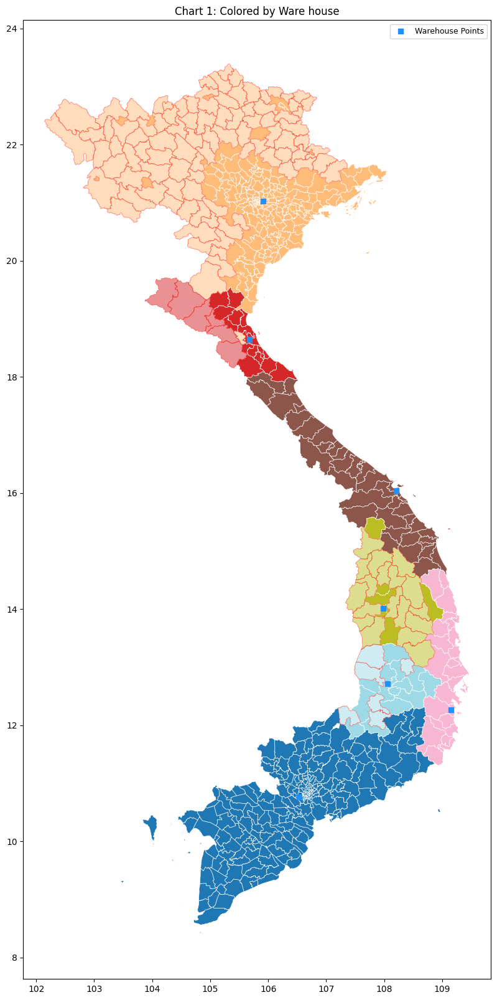

<ipython-input-15-389c57ece859>:64: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="upper right", fontsize=9)


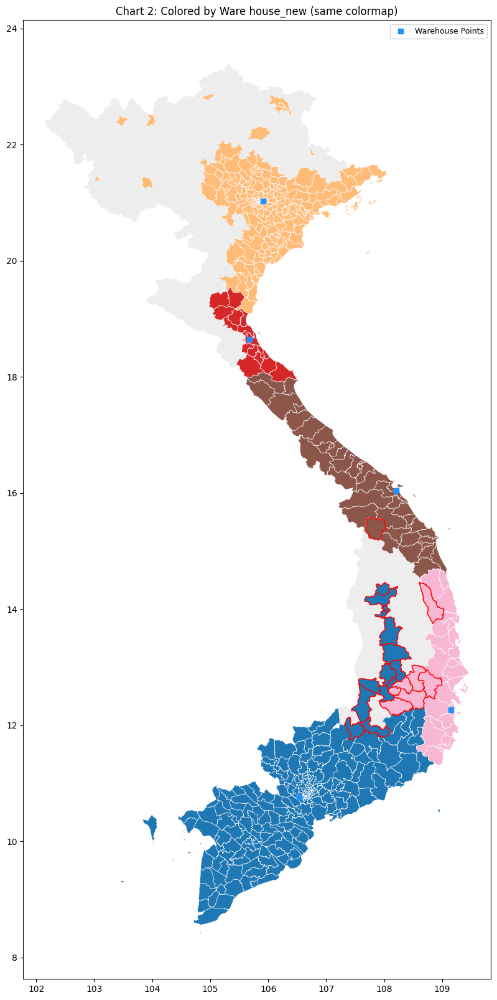

In [15]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Gộp tất cả tên warehouse từ cả 2 cột
all_warehouses = pd.concat([
    gdf_hub_final["Ware house"].dropna(),
    gdf_hub_final["Ware house_new"].dropna()
]).unique()

# Tạo mapping màu cố định
colors = cm.get_cmap("tab20", len(all_warehouses))  # Chọn 1 cmap có đủ màu phân biệt
warehouse_to_color = {wh: mcolors.to_hex(colors(i)) for i, wh in enumerate(all_warehouses)}

# Hàm gán màu từ tên
def get_color(wh):
    return warehouse_to_color.get(wh, "#cccccc")

# ========== Chart 1 ==========
fig, ax = plt.subplots(figsize=(20, 20))

# Tách cut
gdf_cut_1 = gdf_hub_final[gdf_hub_final["Cut"] == "1"]
gdf_cut_0 = gdf_hub_final[gdf_hub_final["Cut"] == "0"]

gdf_HL_new = gdf_hub_final[
    (gdf_hub_final["Cut"] == "0") &
    (gdf_hub_final["Ware house"].isin(["DAK - Buon Ma Thuot - SOU","GIL - Pleiku - SOU"]))
]
# Vẽ Cut = 0 với Ware house
for wh, g in gdf_cut_0.groupby("Ware house"):
    g.plot(ax=ax, color=get_color(wh), edgecolor="white", linewidth=0.5, label=wh)

# Vẽ Cut = 1 với alpha thấp hơn
for wh, g in gdf_cut_1.groupby("Ware house"):
    g.plot(ax=ax, color=get_color(wh), edgecolor="red", linewidth=0.5, alpha=0.5)

WHS_gdf["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

plt.title("Chart 1: Colored by Ware house")
plt.legend(loc="upper right", fontsize=9)
plt.show()

# ========== Chart 2 ==========
fig, ax = plt.subplots(figsize=(20, 20))

# Vẽ Cut = 0 với Ware house_new
for wh, g in gdf_cut_0.groupby("Ware house_new"):
    g.plot(ax=ax, color=get_color(wh), edgecolor="white", linewidth=0.5, label=wh)


# Vẽ Cut = 1 như vùng nền sáng
gdf_cut_1.plot(ax=ax, color="lightgrey", edgecolor="white", linewidth=0.5, alpha=0.4)

for wh, g in gdf_HL_new.groupby("Ware house_new"):
    g.plot(ax=ax, color=get_color(wh), edgecolor="red", linewidth=1, label=wh)

# Vẽ warehouse points (lọc bỏ)
WHS_gdf_after = WHS_gdf[~WHS_gdf["Hub name"].isin(["DAK - Buon Ma Thuot - SOU", "GIL - Pleiku - SOU"])]
WHS_gdf_after["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

plt.title("Chart 2: Colored by Ware house_new (same colormap)")
plt.legend(loc="upper right", fontsize=9)
plt.show()


<ipython-input-16-2113efd05d3c>:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap("tab20", len(all_warehouses))  # Chọn 1 cmap có đủ màu phân biệt
<ipython-input-16-2113efd05d3c>:59: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_HL_new_RLH.plot(ax=ax, color = "yellow", edgecolor="red", linewidth=1, label=wh, alpha=0.2)
<ipython-input-16-2113efd05d3c>:84: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="upper right", fontsize=9)


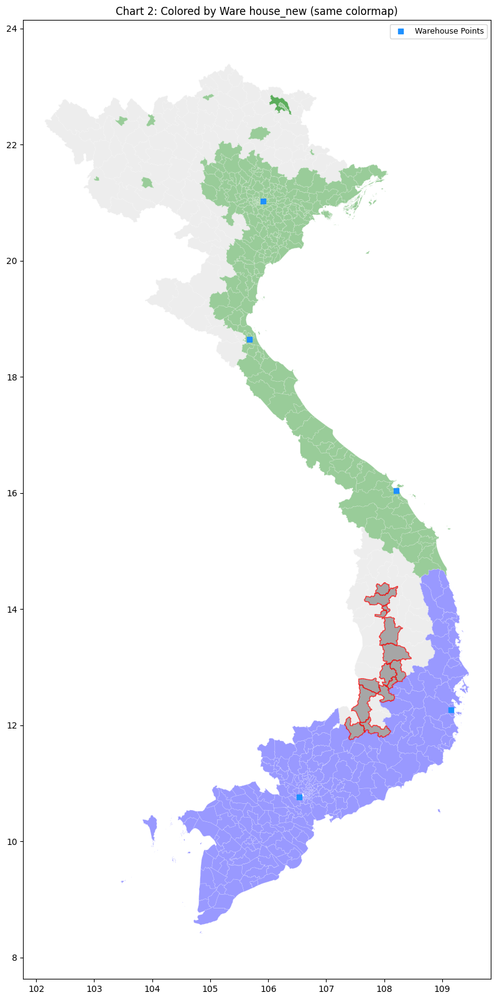

In [16]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Gộp tất cả tên warehouse từ cả 2 cột
all_warehouses = pd.concat([
    gdf_hub_final["Ware house"].dropna(),
    gdf_hub_final["Ware house_new"].dropna()
]).unique()

Station_cover_DNG = gdf_hub_final[
    (gdf_hub_final["Cut"] == "0") &
    (gdf_hub_final["Ware house_new"].isin(["HN - Long Bien - NOR","NGA - Nghe An - NOR - WH","DNG - Da Nang - SOU"]))&
    (gdf_hub_final["Freight new"] != "HCM1") &
    (gdf_hub_final["Sub-line"] != "1")
]

Station_cover_HCM = gdf_hub_final[
    (gdf_hub_final["Cut"] == "0") &
    (gdf_hub_final["Ware house_new"].isin(["HCM - Binh Tan - SOU","KHH - Nha Trang - SOU"]))&
    (gdf_hub_final["Freight new"] != "HCM1") &
    (gdf_hub_final["Sub-line"] != "1")
]
# Tạo mapping màu cố định
colors = cm.get_cmap("tab20", len(all_warehouses))  # Chọn 1 cmap có đủ màu phân biệt
warehouse_to_color = {wh: mcolors.to_hex(colors(i)) for i, wh in enumerate(all_warehouses)}

# Hàm gán màu từ tên
def get_color(wh):
    return warehouse_to_color.get(wh, "#cccccc")


# Tách cut
gdf_cut_1 = gdf_hub_final[gdf_hub_final["Cut"] == "1" ]
gdf_cut_0 = gdf_hub_final[gdf_hub_final["Cut"] == "0"]

gdf_HL_new_TLH = gdf_hub_final[
    (gdf_hub_final["Cut"] == "0") &
    (gdf_hub_final["Freight new"] == "HCM1")
]


gdf_HL_new_RLH = gdf_hub_final[
    (gdf_hub_final["Cut"] == "0") &
    (gdf_hub_final["Sub-line"] == "1")
]

# ========== Chart 2 ==========
fig, ax = plt.subplots(figsize=(20, 20))


Station_cover_HCM.plot(ax=ax, color="blue", edgecolor="white", linewidth=0.5, alpha=0.4)
Station_cover_DNG.plot(ax=ax, color="green", edgecolor="white", linewidth=0.5, alpha=0.4)
# # Vẽ Cut = 1 như vùng nền sáng
gdf_cut_1.plot(ax=ax, color="lightgrey", edgecolor="white", linewidth=0.5, alpha=0.4)

gdf_HL_new_TLH.plot(ax=ax, color= "grey", edgecolor="red", linewidth=1, label=wh, alpha=0.7)
gdf_HL_new_RLH.plot(ax=ax, color = "yellow", edgecolor="red", linewidth=1, label=wh, alpha=0.2)

# Vẽ warehouse points (lọc bỏ)
WHS_gdf_after = WHS_gdf[~WHS_gdf["Hub name"].isin(["DAK - Buon Ma Thuot - SOU", "GIL - Pleiku - SOU"])]
WHS_gdf_after["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# # Vẽ từng tuyến và đoạn thẳng cho từng group
# for group_id, route in routes_by_group_hightland.items():
#     if group_id == Groups[0]:
#       # Tạo màu cố định cho group
#       color = "#"+''.join(random.choices('0123456789ABCDEF', k=6))

#       # 1. Vẽ đường thực tế theo route
#       if route:
#           route_geom = LineString(route)
#           gpd.GeoSeries([route_geom]).plot(ax=ax, linewidth=2.5, color=color, label=f"Group {group_id}")

      # # 2. Vẽ các đoạn thẳng giữa các điểm trong group
      # group_data = interzone_gdf_hightland[interzone_gdf_hightland["Group"] == group_id].sort_values("Sort")
      # points = group_data.geometry.tolist()
      # for i in range(len(points) - 1):
      #     straight_line = LineString([points[i], points[i+1]])
      #     gpd.GeoSeries([straight_line]).plot(ax=ax, color=color, linewidth=1.5)

plt.title("Chart 2: Colored by Ware house_new (same colormap)")
plt.legend(loc="upper right", fontsize=9)
plt.show()


# Cut Coverage MATRIX ROAD


In [ ]:
import networkx as nx
from shapely.geometry import Point
from sklearn.neighbors import NearestNeighbors
import numpy as np

# Tạo đồ thị NetworkX từ dữ liệu SHP
G = nx.Graph()

# Giả sử bạn đã có g_road là GeoDataFrame chứa thông tin đường xá (g_road có cột geometry)
for _, row in g_road.iterrows():
    geom = row.geometry
    if isinstance(geom, LineString):  # Chỉ lấy đường (LineString)
        coords = list(geom.coords)
        for i in range(len(coords) - 1):
            node1, node2 = coords[i], coords[i + 1]
            G.add_edge(node1, node2, weight=Point(node1).distance(Point(node2)))

# Hàm tìm điểm gần nhất trên mạng lưới đường
def get_nearest_node(G, point):
    nodes = np.array(list(G.nodes))
    node_coords = np.array(nodes)

    # Tạo đối tượng NearestNeighbors và tìm kiếm các điểm gần nhất
    nbrs = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(node_coords)

    # Tìm điểm gần nhất từ point
    point_coords = np.array([[point.x, point.y]])  # Chuyển point thành dạng (x, y)
    nearest_node = nbrs.kneighbors(point_coords, return_distance=False)

    # Truy xuất giá trị duy nhất từ nearest_node và trả về
    return tuple(nodes[nearest_node[0][0]])



In [ ]:
import networkx as nx
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

# Hàm heuristic tính khoảng cách Euclidean giữa hai điểm (nút)
def heuristic(n1, n2):
    return ((n1[0] - n2[0]) ** 2 + (n1[1] - n2[1]) ** 2) ** 0.5

def find_shortest_route_through_hubs(hub_names, WHS_gdf, G, get_nearest_node):
    # Lấy tọa độ của các hub từ WHS_gdf
    hub_points = {}
    for hub in hub_names:
        row = WHS_gdf[WHS_gdf["Hub name"] == hub]
        if not row.empty:
            hub_points[hub] = row.geometry.values[0]  # Lấy geometry (Point)

    # Kiểm tra nếu lấy đủ các hub
    if len(hub_points) != len(hub_names):
        print("⚠️ Một hoặc nhiều hub không có trong dữ liệu!")
        return []

    # Tìm nút gần nhất trên mạng lưới đường
    hub_nodes = {hub: get_nearest_node(G, point) for hub, point in hub_points.items()}

    # Kiểm tra các điểm có tồn tại trong G
    valid_nodes = all(node in G.nodes for node in hub_nodes.values())
    if not valid_nodes:
        print("⚠️ Một hoặc nhiều điểm không tồn tại trong đồ thị G!")
        return []

    # Tìm đường đi nối các hub bằng A*
    full_route = []
    for i in range(len(hub_names) - 1):
        start_hub = hub_names[i]
        end_hub = hub_names[i + 1]

        start_node = hub_nodes[start_hub]
        end_node = hub_nodes[end_hub]

        # Sử dụng A* để tìm đường đi ngắn nhất
        if nx.has_path(G, start_node, end_node):
            shortest_path = nx.astar_path(G, source=start_node, target=end_node, weight="weight", heuristic=heuristic)
            full_route.extend(shortest_path[:-1])  # Loại bỏ trùng lặp điểm cuối cùng
        else:
            print(f"⚠️ Không tìm thấy đường đi giữa {start_hub} và {end_hub}!")

    # Thêm điểm cuối cùng vào danh sách đường đi
    full_route.append(hub_nodes[hub_names[-1]])

    return full_route


In [ ]:
# # Nhập tọa độ hai điểm (Longitude, Latitude)
# start_point = Point(105.675395,18.644687)  # Điểm bắt đầu
# end_point = Point(106.535023, 10.766628)    # Điểm kết thúc

# # Tìm nút gần nhất trên mạng lưới đường
# start_node = get_nearest_node(G, start_point)
# end_node = get_nearest_node(G, end_point)

In [ ]:
# Danh sách các hub bạn muốn đi qua
route_HN_NGA_HCM = ["HN - Long Bien - NOR", "NGA - Nghe An - NOR - WH", "HCM - Binh Tan - SOU"]

# Gọi hàm để tìm đường đi ngắn nhất giữa các hub
full_route_HN_NGA_HCM = find_shortest_route_through_hubs(route_HN_NGA_HCM, WHS_gdf, G, get_nearest_node)


route_HN_KHH_DN_HCM = ["HN - Long Bien - NOR", "DNG - Da Nang - SOU", "KHH - Nha Trang - SOU", "HCM - Binh Tan - SOU"]

full_route_HN_KHH_DN_HCM = find_shortest_route_through_hubs(route_HN_KHH_DN_HCM, WHS_gdf, G, get_nearest_node)


#  Cut coverage LH

<ipython-input-21-ac672d76f516>:35: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc="upper left")


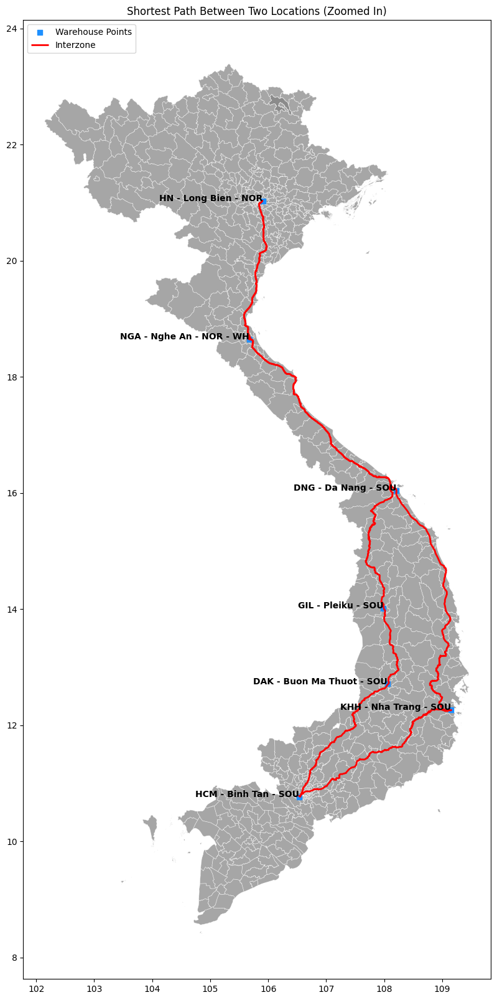

In [ ]:
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Lọc ra các vùng với Cut = 1 và Cut = 0
gdf_cut_1 = gdf_hub_final[gdf_hub_final["Cut"] == "1"]
gdf_cut_0 = gdf_hub_final[gdf_hub_final["Cut"] == "0"]

# Vẽ vùng Cut = 1 với màu xám
gdf_cut_1.plot(ax=ax, color="grey", edgecolor="white",alpha = 0.7, linewidth=0.5, label="Cut = 1")

# Vẽ vùng Cut = 0 với màu đỏ (hoặc màu khác)
gdf_cut_0.plot(ax=ax, color="grey", edgecolor="white", alpha = 0.7, linewidth=0.5, label="Cut = 0")

# Vẽ các điểm WHS_points (đảm bảo WHS_points là GeoSeries)
WHS_gdf["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Thêm tên các hub vào bản đồ
for idx, row in WHS_gdf.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row["Hub name"], fontsize=10, ha="right", color="black", fontweight="bold")

# Vẽ tuyến đường ngắn nhất
if full_route_HN_NGA_HCM:
    route_geom = LineString(full_route_HN_NGA_HCM)
    gpd.GeoSeries([route_geom]).plot(ax=ax, color="red", linewidth=2, label="Interzone")

# Vẽ tuyến đường ngắn nhất
if full_route_HN_KHH_DN_HCM:
    route_geom = LineString(full_route_HN_KHH_DN_HCM)
    gpd.GeoSeries([route_geom]).plot(ax=ax, color="red", linewidth=2, )

# # Vẽ các điểm hub
# gpd.GeoSeries(list(hub_points.values())).plot(ax=ax, color="blue", markersize=10, marker="o", label="Hubs")

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




In [ ]:
route_HCM_DN = [ "HCM - Binh Tan - SOU","DAK - Buon Ma Thuot - SOU","GIL - Pleiku - SOU","DNG - Da Nang - SOU"]

full_route_HCM_DN= find_shortest_route_through_hubs(route_HCM_DN, WHS_gdf, G, get_nearest_node)

In [ ]:
# Lọc ra các giá trị hợp lệ: chứa đúng 1 dấu phẩy
# Tạo danh sách các warehouse cần lọc
warehouses_Hightland = ["DAK - Buon Ma Thuot - SOU", "GIL - Pleiku - SOU"]

# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_hightlands_old = gdf_hub_final[

    (gdf_hub_final["Ware house"].isin(warehouses_Hightland))
]

valid_latlong = [
    s.strip() for s in gdf_hightlands_old["LatLong"].dropna().unique()
    if isinstance(s, str) and s.count(",") == 1
]

# Chuyển thành list các Point (lon, lat)
points = []
for s in valid_latlong:
    lat_str, lon_str = s.strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        points.append(Point(lon, lat))  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu không chuyển được

# Tạo GeoSeries
latlong_points_hightland_old = gpd.GeoSeries(points, crs=gdf_hub_final.crs)

<ipython-input-24-30c2e85192ef>:58: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc="upper left")


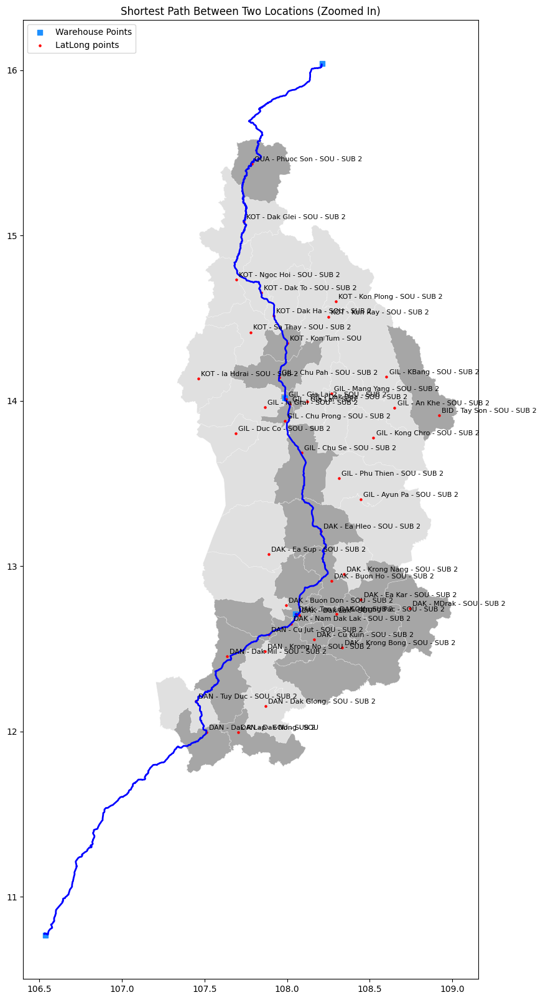

In [ ]:
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Tạo danh sách các warehouse cần lọc
warehouses_Hightland = ["DAK - Buon Ma Thuot - SOU", "GIL - Pleiku - SOU"]


gdf_HL =  gdf_hub_final[

    (gdf_hub_final["Ware house"].isin(warehouses_Hightland))
]

# Lọc Cut = 1 và thuộc 1 trong 2 warehouse
gdf_cut_1 = gdf_hub_final[
    (gdf_hub_final["Cut"] == "1") &
    (gdf_hub_final["Ware house"].isin(warehouses_Hightland))
]

# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_cut_0 = gdf_hub_final[
    (gdf_hub_final["Cut"] == "0") &
    (gdf_hub_final["Ware house"].isin(warehouses_Hightland))
]

# Vẽ vùng Cut = 1 với màu xám
gdf_cut_1.plot(ax=ax, color="lightgrey", edgecolor="white",alpha = 0.7, linewidth=0.5, label="Cut = 1")

# Vẽ vùng Cut = 0 với màu đỏ (hoặc màu khác)
gdf_cut_0.plot(ax=ax, color="grey", edgecolor="white", alpha = 0.7, linewidth=0.5, label="Cut = 0")


WHS_gdf_HCM_DN = WHS_gdf[
    WHS_gdf["Hub name"].isin([ "HCM - Binh Tan - SOU","DAK - Buon Ma Thuot - SOU","GIL - Pleiku - SOU","DNG - Da Nang - SOU"])
]
# Vẽ các điểm WHS_points (đảm bảo WHS_points là GeoSeries)
WHS_gdf_HCM_DN["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Vẽ tuyến đường ngắn nhất
if full_route_HCM_DN:
    route_geom = LineString(full_route_HCM_DN)
    gpd.GeoSeries([route_geom]).plot(ax=ax, color="blue", linewidth=2, )

# # Vẽ các điểm hub
latlong_points_hightland_old.plot(ax=ax, color="red",alpha=1, markersize=5, label="LatLong points")

# Gắn tên tại các điểm
for i, (point, label) in enumerate(zip(latlong_points_hightland_old, gdf_HL["Station_name"])):
    ax.annotate(
        text=label,
        xy=(point.x, point.y),
        xytext=(3, 3),  # Dịch chú thích lên một chút để dễ nhìn
        textcoords="offset points",
        fontsize=8,
        color="black"
    )

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




<ipython-input-25-e18c5f3d12f0>:37: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc="upper left")


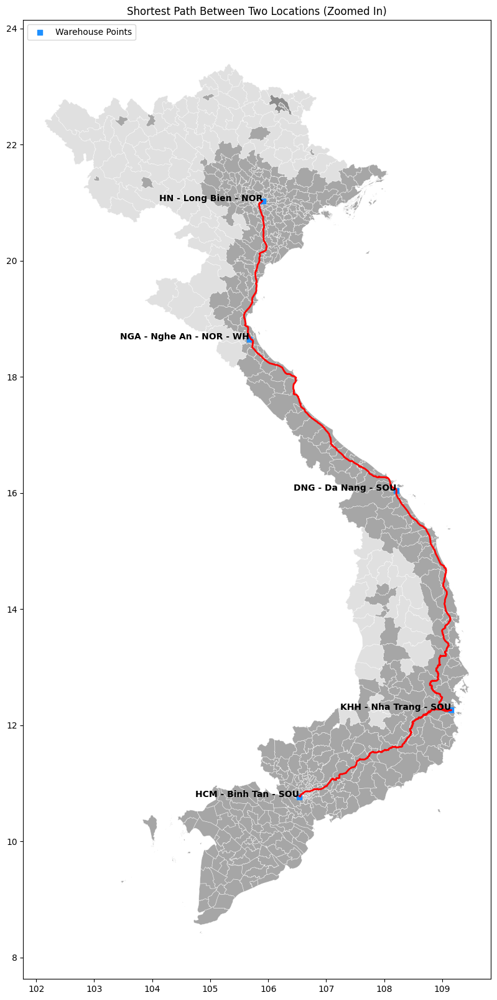

In [ ]:
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Lọc ra các vùng với Cut = 1 và Cut = 0
gdf_cut_1 = gdf_hub_final[gdf_hub_final["Cut"] == "1"]
gdf_cut_0 = gdf_hub_final[gdf_hub_final["Cut"] == "0"]

# Vẽ vùng Cut = 1 với màu xám
gdf_cut_1.plot(ax=ax, color="lightgrey", edgecolor="white",alpha = 0.7, linewidth=0.5, label="Cut = 1")

# Vẽ vùng Cut = 0 với màu đỏ (hoặc màu khác)
gdf_cut_0.plot(ax=ax, color="grey", edgecolor="white", alpha = 0.7, linewidth=0.5, label="Cut = 0")


# Lọc bỏ hai hub không cần thiết
WHS_gdf_after = WHS_gdf[~WHS_gdf["Hub name"].isin(["DAK - Buon Ma Thuot - SOU", "GIL - Pleiku - SOU"])]

# Vẽ các điểm WHS_points (đảm bảo WHS_points là GeoSeries)
WHS_gdf_after["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Thêm tên các hub vào bản đồ
for idx, row in WHS_gdf_after.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row["Hub name"], fontsize=10, ha="right", color="black", fontweight="bold")




# Vẽ tuyến đường ngắn nhất
if full_route_HN_KHH_DN_HCM:
    route_geom = LineString(full_route_HN_KHH_DN_HCM)
    gpd.GeoSeries([route_geom]).plot(ax=ax, color="red", linewidth=2, )

# # Vẽ các điểm hub
# gpd.GeoSeries(list(hub_points.values())).plot(ax=ax, color="blue", markersize=10, marker="o", label="Hubs")

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




In [ ]:
# Hàm heuristic tính khoảng cách Euclidean giữa hai điểm (nút)
def heuristic(n1, n2):
    return ((n1[0] - n2[0]) ** 2 + (n1[1] - n2[1]) ** 2) ** 0.5

def find_shortest_route_through_hubs_list(hub_names, WHS_gdf, G, get_nearest_node):
    # Lấy tọa độ các hub (giữ trùng lặp theo thứ tự)
    hub_points = []
    for hub in hub_names:
        row = WHS_gdf[WHS_gdf["Hub name"] == hub]
        if not row.empty:
            hub_points.append((hub, row.geometry.values[0]))
        else:
            print(f"⚠️ Không tìm thấy tọa độ cho {hub}!")

    if len(hub_points) != len(hub_names):
        print("⚠️ Một hoặc nhiều hub không có trong dữ liệu!")
        return []

    # Tìm các nút gần nhất tương ứng từng điểm
    hub_nodes = []
    for hub, point in hub_points:
        node = get_nearest_node(G, point)
        if node not in G.nodes:
            print(f"⚠️ Node gần {hub} không tồn tại trong đồ thị!")
            return []
        hub_nodes.append(node)

    # Tìm đường đi nối các điểm
    full_route = []
    for i in range(len(hub_nodes) - 1):
        start_node = hub_nodes[i]
        end_node = hub_nodes[i + 1]

        if nx.has_path(G, start_node, end_node):
            shortest_path = nx.astar_path(G, source=start_node, target=end_node, weight="weight", heuristic=heuristic)
            full_route.extend(shortest_path[:-1])
        else:
            print(f"⚠️ Không tìm thấy đường đi giữa {hub_names[i]} và {hub_names[i + 1]}!")

    full_route.append(hub_nodes[-1])  # Thêm nút cuối cùng
    return full_route



In [ ]:
def find_routes_by_group(interzone_gdf, G, get_nearest_node):
    routes_by_group = {}

    # Lặp qua từng Group
    for group_id, group_data in interzone_gdf.groupby("Group"):
        group_data["Sort"] = pd.to_numeric(group_data["Sort"], errors="coerce")
        group_data = group_data.sort_values("Sort")
        hub_names = group_data["Hub name"].tolist()
        print(hub_names)
        # Tìm đường đi cho nhóm này
        group_route = find_shortest_route_through_hubs_list(hub_names, interzone_gdf, G, get_nearest_node)

        # Lưu lại tuyến theo group_id
        routes_by_group[group_id] = group_route

    return routes_by_group


# Gọi hàm để tìm đường đi ngắn nhất qua các nhóm
# routes_by_group = find_routes_by_group(interzone_gdf, G, get_nearest_node)
routes_by_group_hightland= find_routes_by_group(interzone_gdf_hightland, G, get_nearest_node)




['DNG - Da Nang - SOU', 'KOT - Kon Tum - SOU', 'GIL - Chu Pah - SOU - SUB 2', 'GIL - Gia Lai 2 - SOU - SUB 2', 'GIL - Gia Lai - SOU', 'GIL - Chu Se - SOU - SUB 2', 'DAK - Ea Hleo - SOU - SUB 2', 'DAK - Buon Ho - SOU - SUB 2', 'DAK - Dak Lak - SOU', 'DAK - Tan Loi - SOU - SUB 2', 'DAK - Nam Dak Lak - SOU - SUB 2', 'DAN - Cu Jut - SOU - SUB 2', 'DAN - Dak Mil - SOU - SUB 2', 'DAN - Dak Nong - SOU', "DAN - Dak R'Lap - SOU - SUB 2", 'HCM - Binh Tan - SOU']
['DNG - Da Nang - SOU', 'DNG - Son Tra - SOU - DP', 'DNG - NHS - SOU - DP', 'QUA - Phuoc Son - SOU - SUB 2', 'QUA - Bac Tra My - SOU - SUB 2', 'QNG - Tra Bong - SOU - SUB 2', 'QNG - Son Ha - SOU - SUB 2', 'DNG - Da Nang - SOU']
['HCM - Binh Tan - SOU', "DAN - Dak R'Lap - SOU - SUB 2", 'DAN - Dak Nong - SOU', 'DAN - Dak Mil - SOU - SUB 2', 'DAN - Cu Jut - SOU - SUB 2', 'DAK - Nam Dak Lak - SOU - SUB 2', 'DAK - Tan Loi - SOU - SUB 2', 'DAK - Dak Lak - SOU', 'DAK - Buon Ho - SOU - SUB 2', 'DAK - Ea Hleo - SOU - SUB 2', 'GIL - Chu Se - SOU -

In [ ]:
routes_by_group = find_routes_by_group(interzone_gdf, G, get_nearest_node)

['GIL - Pleiku - SOU', 'KOT - Dak Ha - SOU - SUB 2', 'KOT - Dak To - SOU - SUB 2', 'KOT - Ngoc Hoi - SOU - SUB 2', 'KOT - Dak Glei - SOU - SUB 2', 'GIL - Pleiku - SOU']
['DAK - Buon Ma Thuot - SOU', 'DAN - Cu Jut - SOU - SUB 2', 'DAN - Krong No - SOU - SUB 2', 'DAN - Dak Mil - SOU - SUB 2', 'DAN - Tuy Duc - SOU - SUB 2', "DAN - Dak R'Lap - SOU - SUB 2", 'DAN - Dak Nong - SOU', 'DAN - Dak Glong - SOU - SUB 2', 'DAK - Buon Ma Thuot - SOU']
['DAK - Buon Ma Thuot - SOU', 'DAK - Dak Lak - SOU', 'DAK - Tan Loi - SOU - SUB 2', 'DAK - Cu Kuin - SOU - SUB 2', 'DAK - Krong Bong - SOU - SUB 2', 'DAK - Krong Pac - SOU - SUB 2', 'DAK - Ea Kar - SOU - SUB 2', 'DAK - MDrak - SOU - SUB 2', 'DAK - Buon Ma Thuot - SOU']
['DAK - Buon Ma Thuot - SOU', 'DAK - Nam Dak Lak - SOU - SUB 2', 'DAK - Buon Don - SOU - SUB 2', 'DAK - Ea Sup - SOU - SUB 2', 'DAK - Ea Hleo - SOU - SUB 2', 'DAK - Buon Ho - SOU - SUB 2', 'DAK - Krong Nang - SOU - SUB 2', 'DAK - Buon Ma Thuot - SOU']
['GIL - Pleiku - SOU', 'GIL - Dak Do

In [ ]:
interzone_gdf_hightland

,Hub name,geometry,Group,Sort
0,HCM - Binh Tan - SOU,POINT (106.53502 10.76663),HCM1,1
1,DAN - Dak R'Lap - SOU - SUB 2,POINT (107.5106 11.99591),HCM1,2
2,DAN - Dak Nong - SOU,POINT (107.70408 11.99396),HCM1,3
3,DAN - Dak Mil - SOU - SUB 2,POINT (107.63466 12.45534),HCM1,4
4,DAN - Cu Jut - SOU - SUB 2,POINT (107.8871 12.5849),HCM1,5
5,DAK - Nam Dak Lak - SOU - SUB 2,POINT (108.02267 12.65215),HCM1,6
6,DAK - Tan Loi - SOU - SUB 2,POINT (108.05318 12.70908),HCM1,7
7,DAK - Dak Lak - SOU,POINT (108.07326 12.70181),HCM1,8
8,DAK - Buon Ho - SOU - SUB 2,POINT (108.26984 12.9118),HCM1,9
9,DAK - Ea Hleo - SOU - SUB 2,POINT (108.20523 13.21168),HCM1,10


In [ ]:
from geopy.distance import geodesic

def find_routes_by_group_with_distances(interzone_gdf, G, get_nearest_node):
    results_by_group = {}

    for group_id, group_data in interzone_gdf.groupby("Group"):
        group_data["Sort"] = pd.to_numeric(group_data["Sort"], errors="coerce")
        group_data = group_data.sort_values("Sort")
        hub_names = group_data["Hub name"].tolist()

        # Tìm node gần nhất cho mỗi hub
        hub_points = {
            hub: interzone_gdf[interzone_gdf["Hub name"] == hub].geometry.values[0]
            for hub in hub_names
        }
        hub_nodes = {
            hub: get_nearest_node(G, pt)
            for hub, pt in hub_points.items()
        }

        # Tính đường đi và tổng distance theo từng cặp hub
        route_summary = []
        for i in range(len(hub_names) - 1):
            start_hub = hub_names[i]
            end_hub = hub_names[i + 1]

            start_node = hub_nodes[start_hub]
            end_node = hub_nodes[end_hub]

            if nx.has_path(G, start_node, end_node):
                path_nodes = nx.astar_path(G, start_node, end_node, weight="weight", heuristic=heuristic)

                # Tính tổng distance theo geodesic giữa các node trong path
                total_km = 0.0
                for j in range(len(path_nodes) - 1):
                    node1 = path_nodes[j]
                    node2 = path_nodes[j + 1]
                    total_km += geodesic((node1[1], node1[0]), (node2[1], node2[0])).km

                route_summary.append((start_hub, end_hub, total_km))
            else:
                print(f"⚠️ Không tìm được đường giữa {start_hub} và {end_hub}")
                route_summary.append((start_hub, end_hub, None))

        results_by_group[group_id] = route_summary

    return results_by_group


In [ ]:
# Gọi hàm
grouped_routes_hub_to_hub_hightland = find_routes_by_group_with_distances(interzone_gdf_hightland, G, get_nearest_node)

# In ra khoảng cách giữa các hub
for group_id, segments in grouped_routes_hub_to_hub_hightland.items():
    print(f"\n🟦 Group {group_id}")
    for hub_from, hub_to, dist in segments:
        if dist is not None:
            print(f"  {hub_from} → {hub_to}: {dist:.2f} km")
        else:
            print(f"  {hub_from} → {hub_to}: ❌ Không tìm được đường")

⚠️ Không tìm được đường giữa BID - Nam Quy Nhon - SOU và BID - Quy Nhon - SOU
⚠️ Không tìm được đường giữa BID - Quy Nhon - SOU và BID - An Nhon - SOU - SUB 2

🟦 Group DNG1
  DNG - Da Nang - SOU → KOT - Kon Tum - SOU: 285.28 km
  KOT - Kon Tum - SOU → GIL - Chu Pah - SOU - SUB 2: 26.91 km
  GIL - Chu Pah - SOU - SUB 2 → GIL - Gia Lai 2 - SOU - SUB 2: 15.69 km
  GIL - Gia Lai 2 - SOU - SUB 2 → GIL - Gia Lai - SOU: 4.19 km
  GIL - Gia Lai - SOU → GIL - Chu Se - SOU - SUB 2: 38.33 km
  GIL - Chu Se - SOU - SUB 2 → DAK - Ea Hleo - SOU - SUB 2: 65.08 km
  DAK - Ea Hleo - SOU - SUB 2 → DAK - Buon Ho - SOU - SUB 2: 40.03 km
  DAK - Buon Ho - SOU - SUB 2 → DAK - Dak Lak - SOU: 35.45 km
  DAK - Dak Lak - SOU → DAK - Tan Loi - SOU - SUB 2: 2.96 km
  DAK - Tan Loi - SOU - SUB 2 → DAK - Nam Dak Lak - SOU - SUB 2: 7.66 km
  DAK - Nam Dak Lak - SOU - SUB 2 → DAN - Cu Jut - SOU - SUB 2: 17.44 km
  DAN - Cu Jut - SOU - SUB 2 → DAN - Dak Mil - SOU - SUB 2: 34.69 km
  DAN - Dak Mil - SOU - SUB 2 → DAN -

In [ ]:
# Giả sử grouped_routes_hub_to_hub_hightland là kết quả trả về từ hàm
data = []

for group_id, routes in grouped_routes_hub_to_hub_hightland.items():
    for hub_start, hub_end, distance in routes:
        data.append({
            "Hubs start": hub_start,
            "Hubs end": hub_end,
            "Group_id": group_id,
            "Distance (km)": distance
        })

df_routes_hub_to_hub_hightland = pd.DataFrame(data)

# Xem kết quả
print(df_routes_hub_to_hub_hightland.head())

spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1hQ9FOqn9ASi4kxdVx8sASuBMtOtbH5v67HEMUdzTLYw/edit?gid=1959261960#gid=1959261960') ## updated_data
sheet = spr.worksheet('Distance')
sheet.batch_clear(["A:D"])
set_with_dataframe(sheet, df_routes_hub_to_hub_hightland , 1, col=1, include_index=False, include_column_header=True)

                      Hubs start                       Hubs end Group_id  \
0            DNG - Da Nang - SOU            KOT - Kon Tum - SOU     DNG1   
1            KOT - Kon Tum - SOU    GIL - Chu Pah - SOU - SUB 2     DNG1   
2    GIL - Chu Pah - SOU - SUB 2  GIL - Gia Lai 2 - SOU - SUB 2     DNG1   
3  GIL - Gia Lai 2 - SOU - SUB 2            GIL - Gia Lai - SOU     DNG1   
4            GIL - Gia Lai - SOU     GIL - Chu Se - SOU - SUB 2     DNG1   

   Distance (km)  
0     285.277291  
1      26.909356  
2      15.686477  
3       4.190958  
4      38.332595  


In [ ]:
# Lọc ra các giá trị hợp lệ: chứa đúng 1 dấu phẩy
# Tạo danh sách các warehouse cần lọc
warehouses_Hightland = ["DAK - Buon Ma Thuot - SOU", "GIL - Pleiku - SOU"]

# Lọc Cut = 1 và thuộc 1 trong 2 warehouse
gdf_hightlands = gdf_hub_final[
    gdf_hub_final["Ware house"].isin(warehouses_Hightland)
]

valid_latlong = [
    s.strip() for s in gdf_hightlands["LatLong"].dropna().unique()
    if isinstance(s, str) and s.count(",") == 1
]

# Chuyển thành list các Point (lon, lat)
points = []
for s in valid_latlong:
    lat_str, lon_str = s.strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        points.append(Point(lon, lat))  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu không chuyển được

# Tạo GeoSeries
latlong_points_hightland = gpd.GeoSeries(points, crs=gdf_hub_final.crs)


<ipython-input-35-b473e611f2af>:69: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc="upper left")


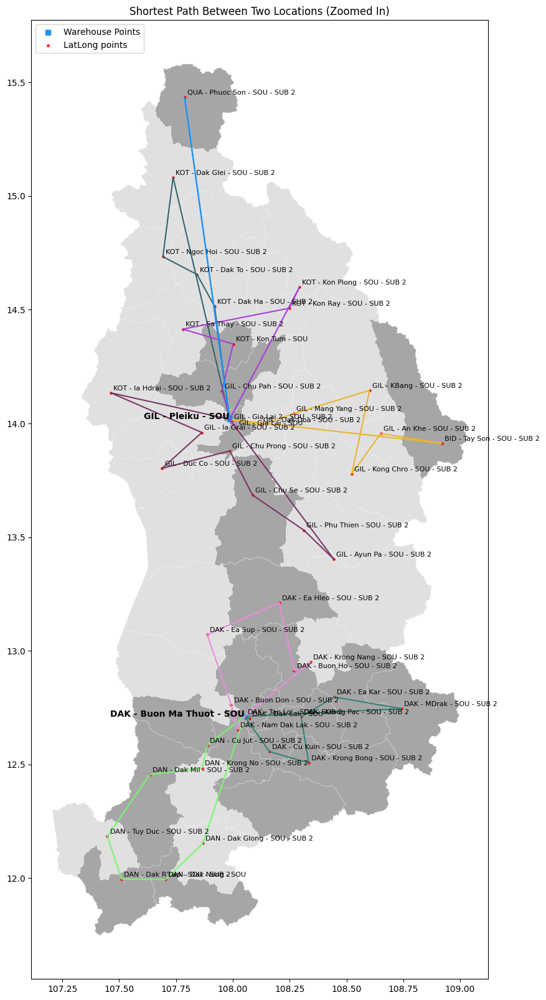

In [ ]:
 import random
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Tạo danh sách các warehouse cần lọc
warehouses_Hightland = ["DAK - Buon Ma Thuot - SOU", "GIL - Pleiku - SOU"]

# Lọc Cut = 1 và thuộc 1 trong 2 warehouse
gdf_cut_1 = gdf_hub_final[
    (gdf_hub_final["Cut"] == "1") &
    (gdf_hub_final["Ware house"].isin(warehouses_Hightland))
]

# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_cut_0 = gdf_hub_final[
    (gdf_hub_final["Cut"] == "0") &
    (gdf_hub_final["Ware house"].isin(warehouses_Hightland))
]

# Vẽ vùng Cut = 1 với màu xám
gdf_cut_1.plot(ax=ax, color="lightgrey", edgecolor="white",alpha = 0.7, linewidth=0.5, label="Cut = 1")

# Vẽ vùng Cut = 0 với màu đỏ (hoặc màu khác)
gdf_cut_0.plot(ax=ax, color="grey", edgecolor="white", alpha = 0.7, linewidth=0.5, label="Cut = 0")


# Vẽ các điểm WHS_points (đảm bảo WHS_points là GeoSeries)
WHS_gdf_Hightland = WHS_gdf[WHS_gdf["Hub name"].isin(warehouses_Hightland)]
WHS_gdf_Hightland["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Thêm tên các hub vào bản đồ
for idx, row in WHS_gdf_Hightland.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row["Hub name"], fontsize=10, ha="right", color="black", fontweight="bold")



# Vẽ từng tuyến và đoạn thẳng cho từng group
for group_id, route in routes_by_group.items():
    # Tạo màu cố định cho group
    color = "#"+''.join(random.choices('0123456789ABCDEF', k=6))

    # # 1. Vẽ đường thực tế theo route
    # if route:
    #     route_geom = LineString(route)
    #     gpd.GeoSeries([route_geom]).plot(ax=ax, linewidth=2.5, color=color, label=f"Group {group_id}")

    # 2. Vẽ các đoạn thẳng giữa các điểm trong group
    group_data = interzone_gdf[interzone_gdf["Group"] == group_id].sort_values("Sort")
    points = group_data.geometry.tolist()
    for i in range(len(points) - 1):
        straight_line = LineString([points[i], points[i+1]])
        gpd.GeoSeries([straight_line]).plot(ax=ax, color=color, linewidth=1.5)

# # Vẽ các điểm hub
latlong_points_hightland.plot(ax=ax, color="red",alpha=1, markersize=5, label="LatLong points")

# Gắn tên tại các điểm
for i, (point, label) in enumerate(zip(latlong_points_hightland, gdf_hightlands["Station_name"])):
    ax.annotate(
        text=label,
        xy=(point.x, point.y),
        xytext=(3, 3),  # Dịch chú thích lên một chút để dễ nhìn
        textcoords="offset points",
        fontsize=8,
        color="black"
    )

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




In [ ]:
# Lọc ra các giá trị hợp lệ: chứa đúng 1 dấu phẩy
# Tạo danh sách các warehouse cần lọc
warehouses_Hightland = ["DAK - Buon Ma Thuot - SOU", "GIL - Pleiku - SOU"]

# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_hightlands_new = gdf_hub_final[
    (gdf_hub_final["Cut"] == "0") &
    (gdf_hub_final["Ware house"].isin(warehouses_Hightland))
]

valid_latlong = [
    s.strip() for s in gdf_hightlands_new["LatLong"].dropna().unique()
    if isinstance(s, str) and s.count(",") == 1
]

# Chuyển thành list các Point (lon, lat)
points = []
for s in valid_latlong:
    lat_str, lon_str = s.strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        points.append(Point(lon, lat))  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu không chuyển được

# Tạo GeoSeries
latlong_points_hightland_new = gpd.GeoSeries(points, crs=gdf_hub_final.crs)

<ipython-input-37-3e60e11fa519>:70: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc="upper left")


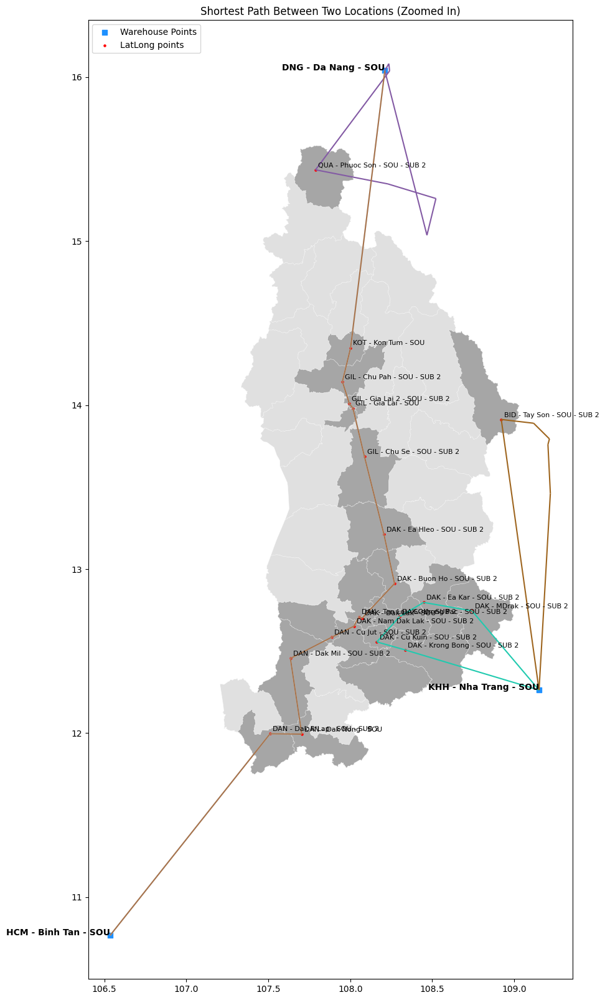

In [ ]:
import random
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Tạo danh sách các warehouse cần lọc
warehouses_Hightland = ["DAK - Buon Ma Thuot - SOU", "GIL - Pleiku - SOU"]

# Lọc Cut = 1 và thuộc 1 trong 2 warehouse
gdf_cut_1 = gdf_hub_final[
    (gdf_hub_final["Cut"] == "1") &
    (gdf_hub_final["Ware house"].isin(warehouses_Hightland))
]

# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_cut_0 = gdf_hub_final[
    (gdf_hub_final["Cut"] == "0") &
    (gdf_hub_final["Ware house"].isin(warehouses_Hightland))
]

# Vẽ vùng Cut = 1 với màu xám
gdf_cut_1.plot(ax=ax, color="lightgrey", edgecolor="white",alpha = 0.7, linewidth=0.5, label="Cut = 1")

# Vẽ vùng Cut = 0 với màu đỏ (hoặc màu khác)
gdf_cut_0.plot(ax=ax, color="grey", edgecolor="white", alpha = 0.7, linewidth=0.5, label="Cut = 0")



# Lọc bỏ hai hub không cần thiết
WHS_gdf_after = WHS_gdf[~WHS_gdf["Hub name"].isin(["HN - Long Bien - NOR", "NGA - Nghe An - NOR - WH","DAK - Buon Ma Thuot - SOU","GIL - Pleiku - SOU"])]
WHS_gdf_after["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Thêm tên các hub vào bản đồ
for idx, row in WHS_gdf_after.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row["Hub name"], fontsize=10, ha="right", color="black", fontweight="bold")



# Vẽ từng tuyến và đoạn thẳng cho từng group
for group_id, route in routes_by_group_hightland.items():
    # Tạo màu cố định cho group
    color = "#"+''.join(random.choices('0123456789ABCDEF', k=6))

    # # 1. Vẽ đường thực tế theo route
    # if route:
    #     route_geom = LineString(route)
    #     gpd.GeoSeries([route_geom]).plot(ax=ax, linewidth=2.5, color=color, label=f"Group {group_id}")

    # 2. Vẽ các đoạn thẳng giữa các điểm trong group
    group_data = interzone_gdf_hightland[interzone_gdf_hightland["Group"] == group_id].sort_values("Sort")
    points = group_data.geometry.tolist()
    for i in range(len(points) - 1):
        straight_line = LineString([points[i], points[i+1]])
        gpd.GeoSeries([straight_line]).plot(ax=ax, color=color, linewidth=1.5)

# # Vẽ các điểm hub
latlong_points_hightland_new.plot(ax=ax, color="red",alpha=1, markersize=5, label="LatLong points")

# Gắn tên tại các điểm
for i, (point, label) in enumerate(zip(latlong_points_hightland_new, gdf_cut_0["Station_name"])):
    ax.annotate(
        text=label,
        xy=(point.x, point.y),
        xytext=(3, 3),  # Dịch chú thích lên một chút để dễ nhìn
        textcoords="offset points",
        fontsize=8,
        color="black"
    )

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




<ipython-input-38-b18ff85b4129>:51: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_group_sub.plot(ax=ax, color="yellow", edgecolor="white",alpha = 0.2, linewidth=0.5)


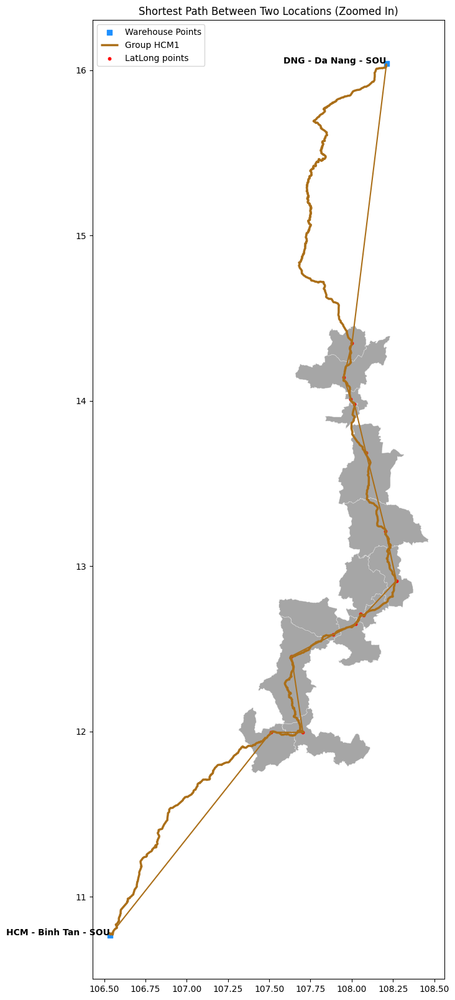

In [ ]:
import random
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Tạo danh sách các warehouse cần lọc
Groups = ["HCM1"]



# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_group_total = gdf_hub_final[
    (gdf_hub_final["Freight new"].isin(Groups))
]

# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_group_sub = gdf_hub_final[
    (gdf_hub_final["Cut"].isin(["0"])) &
    (gdf_hub_final["Sub-line"].isin(["1"]))
]

gdf_group = gdf_hub_final[
    (gdf_hub_final["Cut"].isin(["0"])) &
    (gdf_hub_final["Sub-line"].isin(["1"]))
    |
     (gdf_hub_final["Freight new"].isin(Groups))

]

valid_latlong = [
    s.strip() for s in gdf_group["LatLong"].dropna().unique()
    if isinstance(s, str) and s.count(",") == 1
]

# Chuyển thành list các Point (lon, lat)
points = []
for s in valid_latlong:
    lat_str, lon_str = s.strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        points.append(Point(lon, lat))  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu không chuyển được

# Tạo GeoSeries
latlong_points_group= gpd.GeoSeries(points, crs=gdf_hub_final.crs)


# Vẽ vùng Cut = 1 với màu xám
gdf_group_total.plot(ax=ax, color="grey", edgecolor="white",alpha = 0.7, linewidth=0.5)
gdf_group_sub.plot(ax=ax, color="yellow", edgecolor="white",alpha = 0.2, linewidth=0.5)


# Lọc bỏ hai hub không cần thiết
WHS_gdf_after = WHS_gdf[WHS_gdf["Hub name"].isin(["HCM - Binh Tan - SOU","DNG - Da Nang - SOU"])]
WHS_gdf_after["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Thêm tên các hub vào bản đồ
for idx, row in WHS_gdf_after.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row["Hub name"], fontsize=10, ha="right", color="black", fontweight="bold")



# Vẽ từng tuyến và đoạn thẳng cho từng group
for group_id, route in routes_by_group_hightland.items():
    if group_id == Groups[0]:
      # Tạo màu cố định cho group
      color = "#"+''.join(random.choices('0123456789ABCDEF', k=6))

      # 1. Vẽ đường thực tế theo route
      if route:
          route_geom = LineString(route)
          gpd.GeoSeries([route_geom]).plot(ax=ax, linewidth=2.5, color=color, label=f"Group {group_id}")

      # 2. Vẽ các đoạn thẳng giữa các điểm trong group
      group_data = interzone_gdf_hightland[interzone_gdf_hightland["Group"] == group_id].sort_values("Sort")
      points = group_data.geometry.tolist()
      for i in range(len(points) - 1):
          straight_line = LineString([points[i], points[i+1]])
          gpd.GeoSeries([straight_line]).plot(ax=ax, color=color, linewidth=1.5)

# # # Vẽ các điểm hub
latlong_points_group.plot(ax=ax, color="red",alpha=1, markersize=10, label="LatLong points")

# # Gắn tên tại các điểm
# for i, (point, label) in enumerate(zip(latlong_points_group, gdf_group["Station_name"])):
#     ax.annotate(
#         text=label,
#         xy=(point.x, point.y),
#         xytext=(3, 3),  # Dịch chú thích lên một chút để dễ nhìn
#         textcoords="offset points",
#         fontsize= 12,
#         color="black"
#     )

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




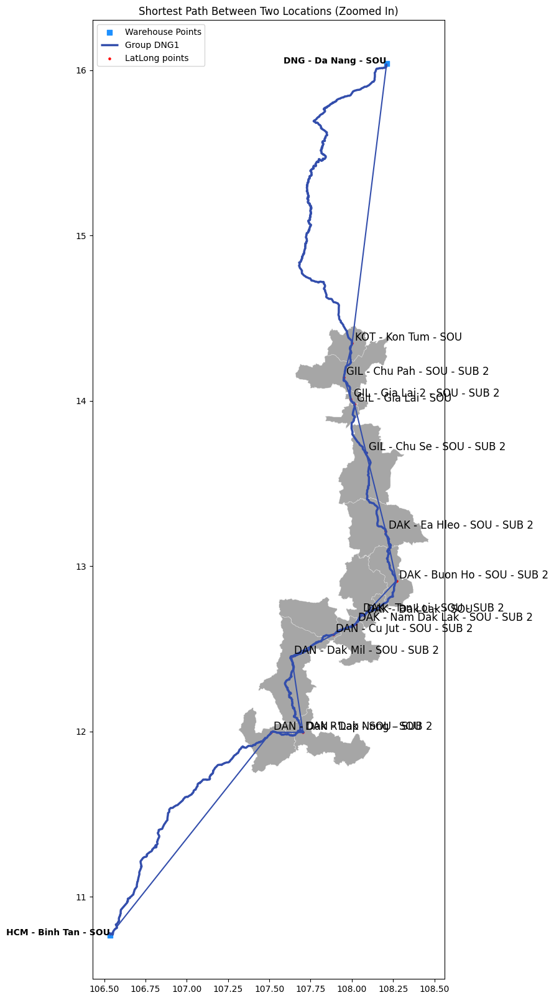

In [ ]:
import random
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Tạo danh sách các warehouse cần lọc
Groups = ["DNG1"]



# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_group = gdf_hub_final[
    (gdf_hub_final["Freight new"].isin(["HCM1"]))
]



valid_latlong = [
    s.strip() for s in gdf_group["LatLong"].dropna().unique()
    if isinstance(s, str) and s.count(",") == 1
]

# Chuyển thành list các Point (lon, lat)
points = []
for s in valid_latlong:
    lat_str, lon_str = s.strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        points.append(Point(lon, lat))  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu không chuyển được

# Tạo GeoSeries
latlong_points_group= gpd.GeoSeries(points, crs=gdf_hub_final.crs)


# Vẽ vùng Cut = 1 với màu xám
gdf_group.plot(ax=ax, color="grey", edgecolor="white",alpha = 0.7, linewidth=0.5)



# Lọc bỏ hai hub không cần thiết
WHS_gdf_after = WHS_gdf[WHS_gdf["Hub name"].isin(["HCM - Binh Tan - SOU","DNG - Da Nang - SOU"])]
WHS_gdf_after["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Thêm tên các hub vào bản đồ
for idx, row in WHS_gdf_after.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row["Hub name"], fontsize=10, ha="right", color="black", fontweight="bold")



# Vẽ từng tuyến và đoạn thẳng cho từng group
for group_id, route in routes_by_group_hightland.items():
    if group_id == Groups[0]:
      # Tạo màu cố định cho group
      color = "#"+''.join(random.choices('0123456789ABCDEF', k=6))

      # 1. Vẽ đường thực tế theo route
      if route:
          route_geom = LineString(route)
          gpd.GeoSeries([route_geom]).plot(ax=ax, linewidth=2.5, color=color, label=f"Group {group_id}")

      # 2. Vẽ các đoạn thẳng giữa các điểm trong group
      group_data = interzone_gdf_hightland[interzone_gdf_hightland["Group"] == group_id].sort_values("Sort")
      points = group_data.geometry.tolist()
      for i in range(len(points) - 1):
          straight_line = LineString([points[i], points[i+1]])
          gpd.GeoSeries([straight_line]).plot(ax=ax, color=color, linewidth=1.5)

# # # Vẽ các điểm hub
latlong_points_group.plot(ax=ax, color="red",alpha=1, markersize=5, label="LatLong points")

# Gắn tên tại các điểm
for i, (point, label) in enumerate(zip(latlong_points_group, gdf_group["Station_name"])):
    ax.annotate(
        text=label,
        xy=(point.x, point.y),
        xytext=(3, 3),  # Dịch chú thích lên một chút để dễ nhìn
        textcoords="offset points",
        fontsize= 12,
        color="black"
    )

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




In [ ]:
import random
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Tạo danh sách các warehouse cần lọc
Groups = ["KHH2"]



# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_group = gdf_hub_final[
    (gdf_hub_final["Freight new"].isin(Groups))
]



valid_latlong = [
    s.strip() for s in gdf_group["LatLong"].dropna().unique()
    if isinstance(s, str) and s.count(",") == 1
]

# Chuyển thành list các Point (lon, lat)
points = []
for s in valid_latlong:
    lat_str, lon_str = s.strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        points.append(Point(lon, lat))  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu không chuyển được

# Tạo GeoSeries
latlong_points_group= gpd.GeoSeries(points, crs=gdf_hub_final.crs)


# Vẽ vùng Cut = 1 với màu xám
gdf_group.plot(ax=ax, color="grey", edgecolor="white",alpha = 0.7, linewidth=0.5)



# Lọc bỏ hai hub không cần thiết
WHS_gdf_after = WHS_gdf[WHS_gdf["Hub name"].isin(["KHH - Nha Trang - SOU"])]
WHS_gdf_after["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Thêm tên các hub vào bản đồ
for idx, row in WHS_gdf_after.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row["Hub name"], fontsize=10, ha="right", color="black", fontweight="bold")



# Vẽ từng tuyến và đoạn thẳng cho từng group
for group_id, route in routes_by_group_hightland.items():
    if group_id == Groups[0]:
      # Tạo màu cố định cho group
      color = "#"+''.join(random.choices('0123456789ABCDEF', k=6))

      # 1. Vẽ đường thực tế theo route
      if route:
          route_geom = LineString(route)
          gpd.GeoSeries([route_geom]).plot(ax=ax, linewidth=2.5, color=color, label=f"Group {group_id}")

      # 2. Vẽ các đoạn thẳng giữa các điểm trong group
      group_data = interzone_gdf_hightland[interzone_gdf_hightland["Group"] == group_id].sort_values("Sort")
      points = group_data.geometry.tolist()
      for i in range(len(points) - 1):
          straight_line = LineString([points[i], points[i+1]])
          gpd.GeoSeries([straight_line]).plot(ax=ax, color=color, linewidth=1.5)

# # # Vẽ các điểm hub
latlong_points_group.plot(ax=ax, color="red",alpha=1, markersize=5, label="LatLong points")

# Gắn tên tại các điểm
for i, (point, label) in enumerate(zip(latlong_points_group, gdf_group["Station_name"])):
    ax.annotate(
        text=label,
        xy=(point.x, point.y),
        xytext=(3, 3),  # Dịch chú thích lên một chút để dễ nhìn
        textcoords="offset points",
        fontsize= 12,
        color="black"
    )

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




In [ ]:
import random
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Tạo danh sách các warehouse cần lọc
Groups = ["DNG2"]



# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_group = gdf_hub_final[
    (gdf_hub_final["Freight new"].isin(Groups))
]



valid_latlong = [
    s.strip() for s in gdf_group["LatLong"].dropna().unique()
    if isinstance(s, str) and s.count(",") == 1
]

# Chuyển thành list các Point (lon, lat)
points = []
for s in valid_latlong:
    lat_str, lon_str = s.strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        points.append(Point(lon, lat))  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu không chuyển được

# Tạo GeoSeries
latlong_points_group= gpd.GeoSeries(points, crs=gdf_hub_final.crs)


# Vẽ vùng Cut = 1 với màu xám
gdf_group.plot(ax=ax, color="grey", edgecolor="white",alpha = 0.7, linewidth=0.5)



# Lọc bỏ hai hub không cần thiết
WHS_gdf_after = WHS_gdf[WHS_gdf["Hub name"].isin(["DNG - Da Nang - SOU"])]
WHS_gdf_after["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Thêm tên các hub vào bản đồ
for idx, row in WHS_gdf_after.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row["Hub name"], fontsize=10, ha="right", color="black", fontweight="bold")



# Vẽ từng tuyến và đoạn thẳng cho từng group
for group_id, route in routes_by_group_hightland.items():
    if group_id == Groups[0]:
      # Tạo màu cố định cho group
      color = "#"+''.join(random.choices('0123456789ABCDEF', k=6))

      # 1. Vẽ đường thực tế theo route
      if route:
          route_geom = LineString(route)
          gpd.GeoSeries([route_geom]).plot(ax=ax, linewidth=2.5, color=color, label=f"Group {group_id}")

      # 2. Vẽ các đoạn thẳng giữa các điểm trong group
      group_data = interzone_gdf_hightland[interzone_gdf_hightland["Group"] == group_id].sort_values("Sort")
      points = group_data.geometry.tolist()
      for i in range(len(points) - 1):
          straight_line = LineString([points[i], points[i+1]])
          gpd.GeoSeries([straight_line]).plot(ax=ax, color=color, linewidth=1.5)

# # # Vẽ các điểm hub
latlong_points_group.plot(ax=ax, color="red",alpha=1, markersize=5, label="LatLong points")

# Gắn tên tại các điểm
for i, (point, label) in enumerate(zip(latlong_points_group, gdf_group["Station_name"])):
    ax.annotate(
        text=label,
        xy=(point.x, point.y),
        xytext=(3, 3),  # Dịch chú thích lên một chút để dễ nhìn
        textcoords="offset points",
        fontsize= 12,
        color="black"
    )

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




In [ ]:
import random
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Tạo danh sách các warehouse cần lọc
Groups = ["H6"]



# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_group = gdf_hub_final[
    (gdf_hub_final["Freight new"].isin(Groups))
]



valid_latlong = [
    s.strip() for s in gdf_group["LatLong"].dropna().unique()
    if isinstance(s, str) and s.count(",") == 1
]

# Chuyển thành list các Point (lon, lat)
points = []
for s in valid_latlong:
    lat_str, lon_str = s.strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        points.append(Point(lon, lat))  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu không chuyển được

# Tạo GeoSeries
latlong_points_group= gpd.GeoSeries(points, crs=gdf_hub_final.crs)


# Vẽ vùng Cut = 1 với màu xám
gdf_group.plot(ax=ax, color="grey", edgecolor="white",alpha = 0.7, linewidth=0.5)



# Lọc bỏ hai hub không cần thiết
WHS_gdf_after = WHS_gdf[WHS_gdf["Hub name"].isin(["KHH - Nha Trang - SOU"])]
WHS_gdf_after["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Thêm tên các hub vào bản đồ
for idx, row in WHS_gdf_after.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row["Hub name"], fontsize=10, ha="right", color="black", fontweight="bold")



# Vẽ từng tuyến và đoạn thẳng cho từng group
for group_id, route in routes_by_group_hightland.items():
    if group_id == Groups[0]:
      # Tạo màu cố định cho group
      color = "#"+''.join(random.choices('0123456789ABCDEF', k=6))

      # 1. Vẽ đường thực tế theo route
      if route:
          route_geom = LineString(route)
          gpd.GeoSeries([route_geom]).plot(ax=ax, linewidth=2.5, color=color, label=f"Group {group_id}")

      # 2. Vẽ các đoạn thẳng giữa các điểm trong group
      group_data = interzone_gdf_hightland[interzone_gdf_hightland["Group"] == group_id].sort_values("Sort")
      points = group_data.geometry.tolist()
      for i in range(len(points) - 1):
          straight_line = LineString([points[i], points[i+1]])
          gpd.GeoSeries([straight_line]).plot(ax=ax, color=color, linewidth=1.5)

# # # Vẽ các điểm hub
latlong_points_group.plot(ax=ax, color="red",alpha=1, markersize=5, label="LatLong points")

# Gắn tên tại các điểm
for i, (point, label) in enumerate(zip(latlong_points_group, gdf_group["Station_name"])):
    ax.annotate(
        text=label,
        xy=(point.x, point.y),
        xytext=(3, 3),  # Dịch chú thích lên một chút để dễ nhìn
        textcoords="offset points",
        fontsize= 12,
        color="black"
    )

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




In [ ]:
import random
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Tạo danh sách các warehouse cần lọc
Groups = ["H8"]



# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_group = gdf_hub_final[
    (gdf_hub_final["Freight new"].isin(Groups))
]



valid_latlong = [
    s.strip() for s in gdf_group["LatLong"].dropna().unique()
    if isinstance(s, str) and s.count(",") == 1
]

# Chuyển thành list các Point (lon, lat)
points = []
for s in valid_latlong:
    lat_str, lon_str = s.strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        points.append(Point(lon, lat))  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu không chuyển được

# Tạo GeoSeries
latlong_points_group= gpd.GeoSeries(points, crs=gdf_hub_final.crs)


# Vẽ vùng Cut = 1 với màu xám
gdf_group.plot(ax=ax, color="grey", edgecolor="white",alpha = 0.7, linewidth=0.5)



# Lọc bỏ hai hub không cần thiết
WHS_gdf_after = WHS_gdf[WHS_gdf["Hub name"].isin(["KHH - Nha Trang - SOU"])]
WHS_gdf_after["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Thêm tên các hub vào bản đồ
for idx, row in WHS_gdf_after.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row["Hub name"], fontsize=10, ha="right", color="black", fontweight="bold")



# Vẽ từng tuyến và đoạn thẳng cho từng group
for group_id, route in routes_by_group_hightland.items():
    if group_id == Groups[0]:
      # Tạo màu cố định cho group
      color = "#"+''.join(random.choices('0123456789ABCDEF', k=6))

      # 1. Vẽ đường thực tế theo route
      if route:
          route_geom = LineString(route)
          gpd.GeoSeries([route_geom]).plot(ax=ax, linewidth=2.5, color=color, label=f"Group {group_id}")

      # 2. Vẽ các đoạn thẳng giữa các điểm trong group
      group_data = interzone_gdf_hightland[interzone_gdf_hightland["Group"] == group_id].sort_values("Sort")
      points = group_data.geometry.tolist()
      for i in range(len(points) - 1):
          straight_line = LineString([points[i], points[i+1]])
          gpd.GeoSeries([straight_line]).plot(ax=ax, color=color, linewidth=1.5)

# # # Vẽ các điểm hub
latlong_points_group.plot(ax=ax, color="red",alpha=1, markersize=5, label="LatLong points")

# Gắn tên tại các điểm
for i, (point, label) in enumerate(zip(latlong_points_group, gdf_group["Station_name"])):
    ax.annotate(
        text=label,
        xy=(point.x, point.y),
        xytext=(3, 3),  # Dịch chú thích lên một chút để dễ nhìn
        textcoords="offset points",
        fontsize= 12,
        color="black"
    )

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




In [ ]:
import random
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(20, 20))

# Tạo danh sách các warehouse cần lọc
Groups = ["H9"]



# Lọc Cut = 0 và thuộc 1 trong 2 warehouse
gdf_group = gdf_hub_final[
    (gdf_hub_final["Freight new"].isin(Groups))
]



valid_latlong = [
    s.strip() for s in gdf_group["LatLong"].dropna().unique()
    if isinstance(s, str) and s.count(",") == 1
]

# Chuyển thành list các Point (lon, lat)
points = []
for s in valid_latlong:
    lat_str, lon_str = s.strip().split(",")
    try:
        lat = float(lat_str.strip())
        lon = float(lon_str.strip())
        points.append(Point(lon, lat))  # lon trước, lat sau!
    except ValueError:
        continue  # bỏ qua nếu không chuyển được

# Tạo GeoSeries
latlong_points_group= gpd.GeoSeries(points, crs=gdf_hub_final.crs)


# Vẽ vùng Cut = 1 với màu xám
gdf_group.plot(ax=ax, color="grey", edgecolor="white",alpha = 0.7, linewidth=0.5)



# Lọc bỏ hai hub không cần thiết
WHS_gdf_after = WHS_gdf[WHS_gdf["Hub name"].isin(["DNG - Da Nang - SOU"])]
WHS_gdf_after["geometry"].plot(ax=ax, color="dodgerblue", markersize=30, marker="s", label="Warehouse Points")

# Thêm tên các hub vào bản đồ
for idx, row in WHS_gdf_after.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row["Hub name"], fontsize=10, ha="right", color="black", fontweight="bold")



# Vẽ từng tuyến và đoạn thẳng cho từng group
for group_id, route in routes_by_group_hightland.items():
    if group_id == Groups[0]:
      # Tạo màu cố định cho group
      color = "#"+''.join(random.choices('0123456789ABCDEF', k=6))

      # 1. Vẽ đường thực tế theo route
      if route:
          route_geom = LineString(route)
          gpd.GeoSeries([route_geom]).plot(ax=ax, linewidth=2.5, color=color, label=f"Group {group_id}")

      # 2. Vẽ các đoạn thẳng giữa các điểm trong group
      group_data = interzone_gdf_hightland[interzone_gdf_hightland["Group"] == group_id].sort_values("Sort")
      points = group_data.geometry.tolist()
      for i in range(len(points) - 1):
          straight_line = LineString([points[i], points[i+1]])
          gpd.GeoSeries([straight_line]).plot(ax=ax, color=color, linewidth=1.5)

# # # Vẽ các điểm hub
latlong_points_group.plot(ax=ax, color="red",alpha=1, markersize=5, label="LatLong points")

# Gắn tên tại các điểm
for i, (point, label) in enumerate(zip(latlong_points_group, gdf_group["Station_name"])):
    ax.annotate(
        text=label,
        xy=(point.x, point.y),
        xytext=(3, 3),  # Dịch chú thích lên một chút để dễ nhìn
        textcoords="offset points",
        fontsize= 12,
        color="black"
    )

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()




# Chuyển tọa độ thành VL3

In [ ]:
wks_input = "LONG CHAU"

In [ ]:
open = client.open_by_url('https://docs.google.com/spreadsheets/d/1_uANUsnRykuUCoHpib9d479pG74T6q9o3SN30utjYKQ/edit?gid=389953746#gid=389953746')
wks_coverage = open.worksheet('Coverage')
data_coverage = wks_coverage.get_all_values()
df_coverage= pd.DataFrame(data_coverage[1:], columns=data_coverage[0])

In [ ]:
open = client.open_by_url('https://docs.google.com/spreadsheets/d/1hQ9FOqn9ASi4kxdVx8sASuBMtOtbH5v67HEMUdzTLYw/edit?gid=1897817491#gid=1897817491')
wks_BHX = open.worksheet(wks_input)
data_BHX = wks_BHX.get_all_values()
df_BHX = pd.DataFrame(data_BHX[1:], columns=data_BHX[0])

In [ ]:
import geopandas as gpd
import pandas as pd

# Đọc file SHP
gdf = gpd.read_file("/content/gadm41_VNM_3.shp")  # Điều chỉnh đường dẫn nếu cần

# Kiểm tra cột để chắc chắn có GID_3
print(gdf.columns)

# Merge df_coverage vào gdf dựa trên GID_3
gdf = gdf.merge(df_coverage[["GID_3","COMBINED"]], on="GID_3", how="left")

# Kiểm tra kết quả
print(gdf.head())

DataSourceError: /content/gadm41_VNM_3.shp: No such file or directory

In [ ]:
# ✅ Bước 0: Tách "Lat/long Address" thành latitude và longitude


In [ ]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point


# ✅ Bước 0: Tách "Lat/long Address" thành latitude và longitude
df_BHX[["latitude", "longitude"]] = df_BHX["Lat/long Address"].str.extract(r"([\d\.]+),\s*([\d\.]+)").astype(float)

# ✅ Bước 1: Chuyển đổi df_BHX thành GeoDataFrame
df_BHX["geometry"] = df_BHX.apply(lambda row: Point(row["longitude"], row["latitude"]), axis=1)
gdf_BHX = gpd.GeoDataFrame(df_BHX, geometry="geometry", crs=gdf.crs)  # Giữ CRS đồng bộ với gdf

# ✅ Bước 2: Spatial Join (Gán thuộc tính COMBINED cho các điểm nằm trong Polygon)
gdf_merged = gpd.sjoin(gdf_BHX, gdf[["geometry", "COMBINED"]], how="left", predicate="within")

# ✅ Bước 3: Giữ lại các cột cần thiết
df_BHX_matched = gdf_merged.drop(columns=["geometry", "index_right"])

# ✅ Kết quả: df_BHX có thêm cột "COMBINED" nếu điểm thuộc Polygon
print(df_BHX_matched.head())


  link     STORE NAME                                      STORE ADDRESS  \
0       tinh-an-giang  Thửa đất 120 và 323, Bản Đồ 6, X. Vĩnh Trạch, ...   
1       tinh-an-giang  1382 Trần Hưng Đạo, P. Mỹ Xuyên, TP. Long Xuyê...   
2       tinh-an-giang  83 Liên Xã, X. Long An, TX. Tân Châu, Tỉnh An ...   
3       tinh-an-giang  46 Nguyễn Trãi, TT. An Châu, H. Châu Thành, Tỉ...   
4       tinh-an-giang  1825 Quốc lộ 91C, X. Quốc Thái, H. An Phú, Tỉn...   

          Lat/long Address                        CONBINE  \
0  10.3310367, 105.3423909  An Giang-Thoại Sơn-Vĩnh Trạch   
1  10.3776122, 105.4398426   An Giang-Long Xuyên-Mỹ Xuyên   
2  10.7888375, 105.1990045      An Giang-Tân Châu-Long An   
3  10.4435791, 105.3906225    An Giang-Châu Thành-An Châu   
4  10.8980609, 105.0802123      An Giang-An Phú-Quốc Thái   

                           LVL3 COOR Region          SUB_REGION   LEVEL_1  \
0  10.3342226947364,105.339557788957  South  Mekong River Delta  An Giang   
1   10.377642268385,10

In [ ]:
spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1hQ9FOqn9ASi4kxdVx8sASuBMtOtbH5v67HEMUdzTLYw/edit?gid=1897817491#gid=1897817491') ## updated_data
wks = spr.worksheet(wks_input)
# Xóa dữ liệu trong range A10:U
# wks.batch_clear(['A:G'])

# Select columns from 1 to 500000 (adjust if column names are different)


set_with_dataframe(wks, df_BHX_matched, row=1, col=13, include_index=False, include_column_header=True)


# ROAD VN

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
# Đọc file SHP
gdf = gpd.read_file("/content/transportation.shp")

# Lọc dữ liệu cho Quốc lộ 26

gdf_main = gdf[gdf["Type"] == "Principal road"]



In [ ]:
# Lọc dữ liệu cho các đường có chứa "National highway 14"
gdf_nh14 = gdf[gdf["Name"].str.contains("National highway 14", na=False)]
# Lọc dữ liệu cho Quốc lộ 26
# gdf_nh14C = gdf[gdf["Name"] == "National highway 14C"]
gdf_nh14 = gdf[gdf["Name"] == "National highway 14"]
# gdf_nhHCM = gdf[gdf["Name"] == "Ho Chi Minh highway"]
gdf_nh1 = gdf[(gdf["Name"] == "National highway 1D") | (gdf["Name"] == "National highway 1A")]


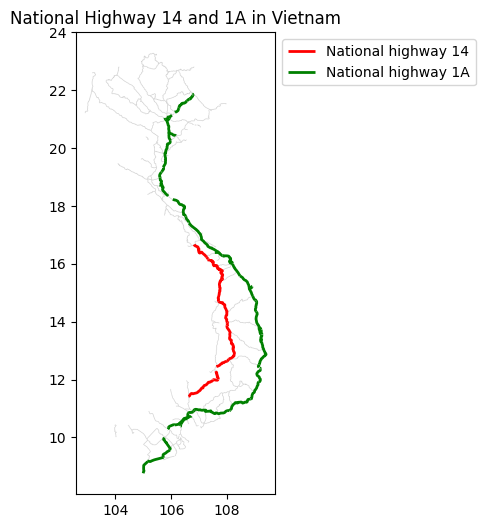

In [ ]:
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(10, 6))
gdf_main.plot(ax=ax, color="lightgrey", linewidth=0.5)  # Vẽ toàn bộ mạng lưới giao thông
# gdf_nh14C.plot(ax=ax, color="pink", linewidth=2, label="National highway 14C")
gdf_nh14.plot(ax=ax, color="red", linewidth=2, label="National highway 14")
# gdf_nhHCM.plot(ax=ax, color="blue", linewidth=2, label="Ho Chi Minh highway")
gdf_nh1.plot(ax=ax, color="green", linewidth=2, label="National highway 1A")
# Tùy chỉnh biểu đồ
ax.set_title("National Highway 14 and 1A in Vietnam")
ax.legend(loc="upper left", bbox_to_anchor=(1, 1))
plt.show()

In [ ]:
open = client.open_by_url('https://docs.google.com/spreadsheets/d/1xetOlll8UrdvBEspu8yNj7w8YpcpVETIn74YVk7H13E/edit?gid=0#gid=0')
wks_station = open.worksheet('Station')
data_station = wks_station.get_all_values()
df_station= pd.DataFrame(data_station[1:], columns=data_station[0])

In [ ]:
df_station_active = df_station[(df_station["Status (2.25)"] == "Active") | (df_station["Status (2.25)"] == "Partially Active")]
df_station_active = df_station_active.rename(columns={"Latlong update to 03.25": "Latlong"})

In [ ]:
# Tạo cột "Road_name"
gdf["Road_name"] = gdf["Name"].apply(lambda x:
    "National highway 1A" if x in ["National highway 1A", "National highway 1D"]
    else ("National highway 14" if x == "National highway 14" else None)
)
# Lọc các đường cần thiết
gdf_highways = gdf.dropna(subset=["Road_name"])



In [ ]:
# Chuyển đổi "Latlong" thành tọa độ dạng tuple nếu chưa đúng định dạng
df_station_active["Latlong"] = df_station_active["Latlong"].apply(lambda x: eval(x) if isinstance(x, str) else x)

# Tạo cột geometry từ Latlong
df_station_active["geometry"] = df_station_active["Latlong"].apply(lambda x: Point(x[1], x[0]) if isinstance(x, tuple) else None)

# Xóa các dòng có geometry rỗng
df_station_active = df_station_active.dropna(subset=["geometry"])

# Chuyển thành GeoDataFrame
gdf_stations = gpd.GeoDataFrame(df_station_active, geometry="geometry", crs=gdf.crs)

print(gdf_stations.head())

  Region               Sub-region Hub code Hub province      ID  \
0  South  Đồng Bằng Sông Cửu Long      ANG     An Giang     138   
3  South  Đồng Bằng Sông Cửu Long      ANG     An Giang     349   
4  South  Đồng Bằng Sông Cửu Long      ANG     An Giang  103693   
5  South  Đồng Bằng Sông Cửu Long      ANG     An Giang  103692   
7  South  Đồng Bằng Sông Cửu Long      ANG     An Giang     750   

                       Hub Name                  Latlong Status (2.25)  \
0          ANG - An Giang - SOU  (10.393524, 105.422136)        Active   
3  ANG - Chau Doc - SOU - SUB 2    (10.70997, 105.11533)        Active   
4  ANG - Chau Phu - SOU - SUB 2   (10.585422, 105.23035)        Active   
5   ANG - Cho Moi - SOU - SUB 2     (10.50404, 105.4911)        Active   
7   ANG - Phu Tan - SOU - SUB 2     (10.57964, 105.3624)        Active   

                     geometry  
0  POINT (105.42214 10.39352)  
3  POINT (105.11533 10.70997)  
4  POINT (105.23035 10.58542)  
5   POINT (105.4911 10.5

In [ ]:
gdf_highways = gdf_highways.to_crs(epsg=32648)
gdf_stations = gdf_stations.to_crs(gdf_highways.crs)

# Tính khoảng cách đến National highway 1A
gdf_road_1A = gdf_highways[gdf_highways["Road_name"] == "National highway 1A"]
gdf_stations["Distance_to_NH1A"] = gdf_stations["geometry"].apply(lambda x: gdf_road_1A.distance(x).min())

# Tính khoảng cách đến National highway 14
gdf_road_14 = gdf_highways[gdf_highways["Road_name"] == "National highway 14"]
gdf_stations["Distance_to_NH14"] = gdf_stations["geometry"].apply(lambda x: gdf_road_14.distance(x).min())

gdf_stations["Distance_to_NH1A"] = gdf_stations["Distance_to_NH1A"] /1000
gdf_stations["Distance_to_NH14"] = gdf_stations["Distance_to_NH14"] /1000

In [ ]:

# Hiển thị kết quả
print(gdf_stations[["Hub Name", "Latlong", "Distance_to_NH1A", "Distance_to_NH14"]])
# Chuyển GeoDataFrame về DataFrame thông thường
df_export = gdf_stations[["Region","Sub-region","Hub province","Hub Name", "Latlong", "Distance_to_NH1A", "Distance_to_NH14"]].copy()

spr = client.open_by_url('https://docs.google.com/spreadsheets/d/1xetOlll8UrdvBEspu8yNj7w8YpcpVETIn74YVk7H13E/edit?gid=0#gid=0') ## updated_data
wks = spr.worksheet("Result")
# Xóa dữ liệu trong range A10:U
# wks.batch_clear(['A:G'])

# Select columns from 1 to 500000 (adjust if column names are different)


set_with_dataframe(wks, df_export, row=1, col=1, include_index=False, include_column_header=True)


                              Hub Name  \
0                 ANG - An Giang - SOU   
3         ANG - Chau Doc - SOU - SUB 2   
4         ANG - Chau Phu - SOU - SUB 2   
5          ANG - Cho Moi - SOU - SUB 2   
7          ANG - Phu Tan - SOU - SUB 2   
..                                 ...   
825         HCM - Thu Duc 3 - SOU - DP   
826      HN - Nam Tu Liem 3 - NOR - DP   
827     BD - Hoi Nghia 2 - SOU - SUB 2   
828  HN - Gia Lam 3 - NOR - SUB 2 - DP   
829      HCM - Binh Chanh 3 - SOU - DP   

                                     Latlong  Distance_to_NH1A  \
0                    (10.393524, 105.422136)         53.004915   
3                      (10.70997, 105.11533)         94.989818   
4                     (10.585422, 105.23035)         78.172783   
5                       (10.50404, 105.4911)         48.279281   
7                       (10.57964, 105.3624)         64.451107   
..                                       ...               ...   
825  (10.86020018630342, 106.7680

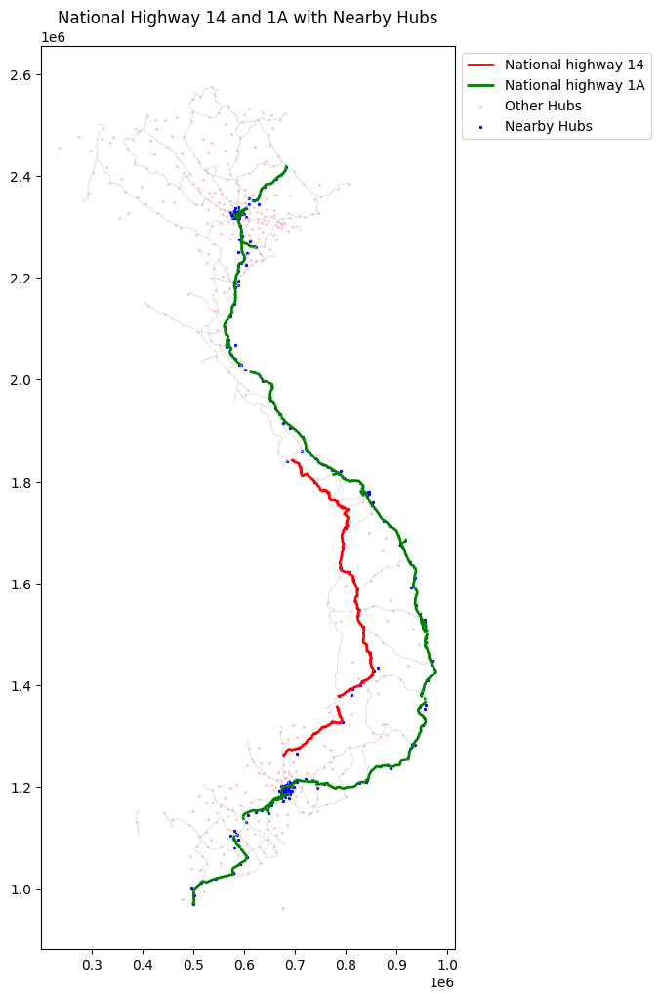

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Lọc các điểm Hub Name có khoảng cách < 10km đến NH1A hoặc NH14
gdf_near_hubs = gdf_stations[(gdf_stations["Distance_to_NH1A"] < 10) | (gdf_stations["Distance_to_NH14"] < 10)]
gdf_other_hubs = gdf_stations[~gdf_stations.index.isin(gdf_near_hubs.index)]

fig, ax = plt.subplots(figsize=(20, 12))
gdf_nh14 = gdf_highways[gdf_highways["Road_name"] == "National highway 14"]
gdf_nh1 = gdf_highways[gdf_highways["Road_name"] == "National highway 1A"]
gdf_main = gdf[gdf["Type"] == "Principal road"]
gdf_main = gdf_main.to_crs(epsg=32648)
# Vẽ mạng lưới giao thông chính
gdf_main.plot(ax=ax, color="lightgrey", linewidth=0.5)
gdf_nh14.plot(ax=ax, color="red", linewidth=2, label="National highway 14")
gdf_nh1.plot(ax=ax, color="green", linewidth=2, label="National highway 1A")

# Vẽ các trạm không gần NH1A hoặc NH14 (hồng nhạt)
gdf_other_hubs.plot(ax=ax, color="pink", markersize=1, marker="x", label="Other Hubs")

# Vẽ các điểm Hub Name gần NH1A hoặc NH14
gdf_near_hubs.plot(ax=ax, color="blue", markersize=2, marker="o", label="Nearby Hubs")

# Tùy chỉnh biểu đồ
ax.set_title("National Highway 14 and 1A with Nearby Hubs")
ax.legend(loc="upper left", bbox_to_anchor=(1, 1))

plt.show()


# Road optimal

In [ ]:
import geopandas as gpd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString

# Đọc dữ liệu mạng lưới đường từ file SHP
g_road = gpd.read_file("/content/vnm_rdsl_2015_OSM.shp")

g_province = gpd.read_file("/content/diaphantinhenglish.shp")

In [ ]:
g_road

,osm_id,name,ref,type,Shape_Leng,geometry
0,9566542,C?u Thê Húc,None,footway,0.000413,"LINESTRING (105.85305 21.03072, 105.85264 21.0..."
1,9656653,Mã Mây,None,residential,0.002599,"LINESTRING (105.85338 21.03383, 105.85342 21.0..."
2,9656730,C?u Chuong Duong,None,primary,0.011551,"LINESTRING (105.86566 21.03972, 105.85491 21.0..."
3,9963509,Hàng Cót,None,secondary,0.001603,"LINESTRING (105.8472 21.04027, 105.84718 21.03..."
4,9963524,Ðinh Li?t,None,residential,0.001613,"LINESTRING (105.85189 21.03231, 105.85194 21.0..."
...,...,...,...,...,...,...
118133,329878186,Pasteur,None,tertiary,0.005535,"LINESTRING (106.69995 10.7768, 106.69961 10.77..."
118134,329878187,Pasteur,None,tertiary,0.000125,"LINESTRING (106.70108 10.77426, 106.70103 10.7..."
118135,329878188,Ph?m Ngu Lão,None,service,0.000466,"LINESTRING (106.6981 10.77064, 106.698 10.7706..."
118136,329878189,Ph?m Ngu Lão,None,tertiary,0.000295,"LINESTRING (106.68867 10.76688, 106.6886 10.76..."


In [ ]:
open = client.open_by_url('https://docs.google.com/spreadsheets/d/1LfwbBriuKAmQM4yV1Kcep3aSfDQzKAXPbCMWsr4GmYE/edit?gid=1694932850#gid=1694932850')
wks_province = open.worksheet('Province')
data_province = wks_province.get_all_values()
df_province = pd.DataFrame(data_province[1:], columns=data_province[0])
# Merge df_coverage vào gdf dựa trên GID_3
g_province = g_province.merge(df_province[["Name","Province"]], on="Name", how="left")

# Kiểm tra kết quả
print(g_province.head())

   Code               Name                                           geometry  \
0  AD01           An Giang  POLYGON ((105.18712 10.91317, 105.18719 10.912...   
1  AD01  Ba Ria - Vung Tau  MULTIPOLYGON (((106.0811 8.57754, 106.08069 8....   
2  AD01          Bac Giang  POLYGON ((106.18304 21.6053, 106.18034 21.6031...   
3  AD01            Bac Kan  POLYGON ((106.18298 22.3883, 106.18589 22.3815...   
4  AD01           Bac Lieu  POLYGON ((105.37226 9.59691, 105.37281 9.59651...   

    Province  
0   An Giang  
1   Vũng Tàu  
2  Bắc Giang  
3    Bắc Kạn  
4   Bạc Liêu  


<ipython-input-17-e94371621590>:6: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper left")


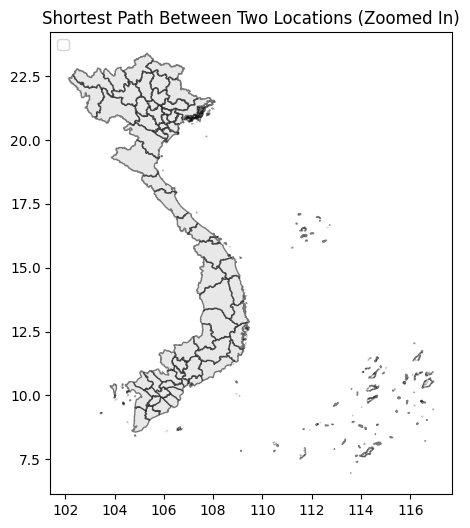

In [ ]:
# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(10, 6))
g_province.plot(ax=ax, color="lightgrey", edgecolor="black", alpha=0.5)  # Mạng lưới đường

ax.set_title("63 province")
ax.legend(loc="upper left")
plt.show()

In [ ]:
import geopandas as gpd


# Chuyển đổi CRS về giống nhau (nếu cần)
if g_road.crs != g_province.crs:
    g_road = g_road.to_crs(g_province.crs)

# Spatial join: Xác định đoạn đường thuộc tỉnh nào
g_road_province = gpd.sjoin(g_road, g_province, how="inner", predicate="intersects")

# # Cắt đoạn đường theo tỉnh (chỉ cần nếu 1 đường nằm trong nhiều tỉnh)
# g_road_province["geometry"] = g_road_province.apply(
#     lambda row: row["geometry"].intersection(g_province[g_province["Province"] == row["Province"]].geometry.unary_union), axis=1
# )

# # Tạo key mới
# g_road_province["osm_id_new"] = g_road_province["osm_id"].astype(str) + "_" + g_road_province["Province"]

# Xuất kết quả
# g_road_province.to_file("g_road_with_province.shp")


In [ ]:
g_road_province

,osm_id,name,ref,type,Shape_Leng,geometry,index_right,Code,Name,Province
0,9566542,C?u Thê Húc,None,footway,0.000413,"LINESTRING (105.85305 21.03072, 105.85264 21.0...",23,AD01,Ha Noi,Hà Nội
1,9656653,Mã Mây,None,residential,0.002599,"LINESTRING (105.85338 21.03383, 105.85342 21.0...",23,AD01,Ha Noi,Hà Nội
2,9656730,C?u Chuong Duong,None,primary,0.011551,"LINESTRING (105.86566 21.03972, 105.85491 21.0...",23,AD01,Ha Noi,Hà Nội
3,9963509,Hàng Cót,None,secondary,0.001603,"LINESTRING (105.8472 21.04027, 105.84718 21.03...",23,AD01,Ha Noi,Hà Nội
4,9963524,Ðinh Li?t,None,residential,0.001613,"LINESTRING (105.85189 21.03231, 105.85194 21.0...",23,AD01,Ha Noi,Hà Nội
...,...,...,...,...,...,...,...,...,...,...
118133,329878186,Pasteur,None,tertiary,0.005535,"LINESTRING (106.69995 10.7768, 106.69961 10.77...",57,AD01,TP. Ho Chi Minh,Hồ Chí Minh
118134,329878187,Pasteur,None,tertiary,0.000125,"LINESTRING (106.70108 10.77426, 106.70103 10.7...",57,AD01,TP. Ho Chi Minh,Hồ Chí Minh
118135,329878188,Ph?m Ngu Lão,None,service,0.000466,"LINESTRING (106.6981 10.77064, 106.698 10.7706...",57,AD01,TP. Ho Chi Minh,Hồ Chí Minh
118136,329878189,Ph?m Ngu Lão,None,tertiary,0.000295,"LINESTRING (106.68867 10.76688, 106.6886 10.76...",57,AD01,TP. Ho Chi Minh,Hồ Chí Minh


<ipython-input-31-278c869fef97>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", len(road_types))


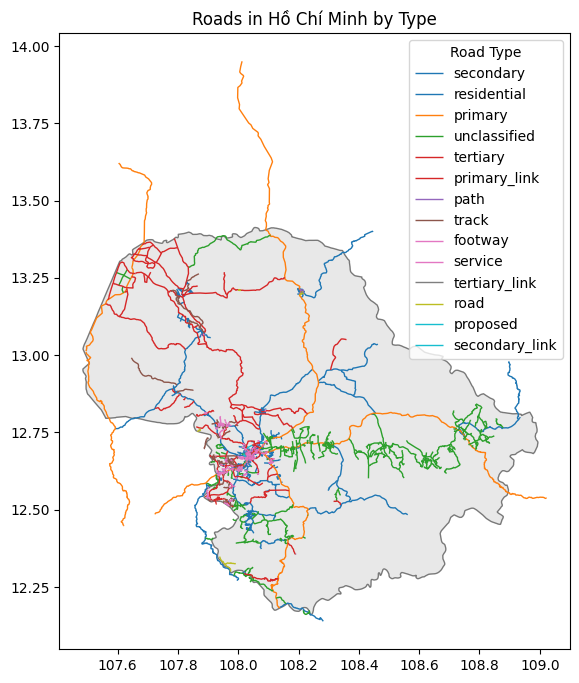

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Lọc các đoạn đường thuộc TP Hồ Chí Minh
province = "Đắk Lắk"
g_road_hcm = g_road_province[g_road_province["Province"] == province]
g_province_hcm = g_province[g_province["Province"] == province]


# Xác định danh sách các loại đường (Type)
road_types = g_road_hcm["type"].unique()

# Ánh xạ màu cho từng loại đường
colors = plt.cm.get_cmap("tab10", len(road_types))

# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(10, 8))
g_province_hcm.plot(ax=ax, color="lightgrey", edgecolor="black", alpha=0.5)  # Cover
for i, road_type in enumerate(road_types):
    subset = g_road_hcm[g_road_hcm["type"] == road_type]
    subset.plot(ax=ax, color=colors(i), linewidth=1, label=road_type)

ax.set_title("Roads in Hồ Chí Minh by Type")
ax.legend(title="Road Type", loc="upper right")

plt.show()


In [ ]:
import networkx as nx
from shapely.geometry import Point
from sklearn.neighbors import NearestNeighbors
import numpy as np

# Tạo đồ thị NetworkX từ dữ liệu SHP
G = nx.Graph()

# Giả sử bạn đã có g_road là GeoDataFrame chứa thông tin đường xá (g_road có cột geometry)
for _, row in g_road.iterrows():
    geom = row.geometry
    if isinstance(geom, LineString):  # Chỉ lấy đường (LineString)
        coords = list(geom.coords)
        for i in range(len(coords) - 1):
            node1, node2 = coords[i], coords[i + 1]
            G.add_edge(node1, node2, weight=Point(node1).distance(Point(node2)))

# Hàm tìm điểm gần nhất trên mạng lưới đường
def get_nearest_node(G, point):
    nodes = np.array(list(G.nodes))
    node_coords = np.array(nodes)

    # Tạo đối tượng NearestNeighbors và tìm kiếm các điểm gần nhất
    nbrs = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(node_coords)

    # Tìm điểm gần nhất từ point
    point_coords = np.array([[point.x, point.y]])  # Chuyển point thành dạng (x, y)
    nearest_node = nbrs.kneighbors(point_coords, return_distance=False)

    # Truy xuất giá trị duy nhất từ nearest_node và trả về
    return tuple(nodes[nearest_node[0][0]])



Shortest path: [(np.float64(106.68252740000003), np.float64(10.762841900000069)), (106.68260760000004, 10.762864500000092), (106.68238960000008, 10.76341460000009), (106.68200190000005, 10.764371900000071), (106.68167200000005, 10.765186400000061), (106.68173920000004, 10.765219100000081), (106.68179420000007, 10.76526860000007), (106.68183360000006, 10.765332600000079), (106.68185330000006, 10.765407400000072), (106.68184270000006, 10.765511900000092), (106.68194660000006, 10.765753200000063), (106.68298660000005, 10.76633170000008), (106.68311300000005, 10.766402000000085), (106.68460700000003, 10.767390000000091), (106.68544810000003, 10.767958000000078), (106.68579920000008, 10.768164200000058), (106.68610300000006, 10.768331000000046), (106.68638390000007, 10.76840130000005), (106.68668500000007, 10.768445000000042), (106.68701140000007, 10.768428000000085), (106.68745130000008, 10.768885100000091), (106.68802800000003, 10.769484400000067), (106.68822080000007, 10.769684700000084)

In [ ]:
# Nhập tọa độ hai điểm (Longitude, Latitude)
start_point = Point(106.6822, 10.7629)  # Điểm bắt đầu
end_point = Point(106.7000, 10.7767)    # Điểm kết thúc

# Tìm nút gần nhất trên mạng lưới đường
start_node = get_nearest_node(G, start_point)
end_node = get_nearest_node(G, end_point)

# Kiểm tra nếu có đường đi từ start_node đến end_node
if start_node in G.nodes and end_node in G.nodes:  # Kiểm tra nếu node có trong đồ thị
    if nx.has_path(G, start_node, end_node):
        # Tìm đường đi ngắn nhất theo thuật toán Dijkstra
        shortest_path = nx.shortest_path(G, source=start_node, target=end_node, weight="weight")

        # In ra đường đi ngắn nhất
        print("Shortest path:", shortest_path)
    else:
        print(f"Không có đường đi từ {start_node} đến {end_node}.")
else:
    print(f"Không tìm thấy {start_node} hoặc {end_node} trong đồ thị.")

Shortest path: [(np.float64(106.68252740000003), np.float64(10.762841900000069)), (106.68260760000004, 10.762864500000092), (106.68238960000008, 10.76341460000009), (106.68200190000005, 10.764371900000071), (106.68167200000005, 10.765186400000061), (106.68173920000004, 10.765219100000081), (106.68179420000007, 10.76526860000007), (106.68183360000006, 10.765332600000079), (106.68185330000006, 10.765407400000072), (106.68184270000006, 10.765511900000092), (106.68194660000006, 10.765753200000063), (106.68298660000005, 10.76633170000008), (106.68311300000005, 10.766402000000085), (106.68460700000003, 10.767390000000091), (106.68544810000003, 10.767958000000078), (106.68579920000008, 10.768164200000058), (106.68610300000006, 10.768331000000046), (106.68638390000007, 10.76840130000005), (106.68668500000007, 10.768445000000042), (106.68701140000007, 10.768428000000085), (106.68745130000008, 10.768885100000091), (106.68802800000003, 10.769484400000067), (106.68822080000007, 10.769684700000084)

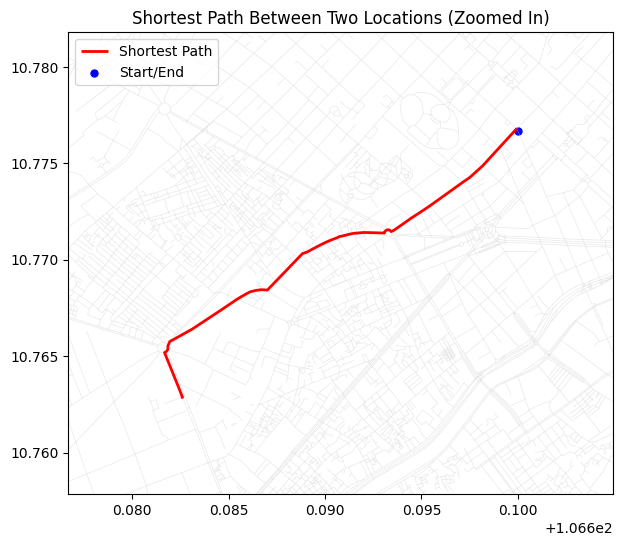

In [ ]:

# Chuyển đường đi thành LineString để vẽ
route_geom = LineString(shortest_path)
route_gdf = gpd.GeoDataFrame(geometry=[route_geom], crs=g_road.crs)

# Vẽ bản đồ
fig, ax = plt.subplots(figsize=(10, 6))
g_road.plot(ax=ax, color="lightgrey", linewidth=0.5, alpha=0.5)  # Mạng lưới đường
route_gdf.plot(ax=ax, color="red", linewidth=2, label="Shortest Path")  # Đường đi ngắn nhất
gpd.GeoSeries([start_point, end_point]).plot(ax=ax, color="blue", markersize=50, marker="o", label="Start/End")  # Điểm đầu & cuối

# Thiết lập giới hạn zoom (tự động theo đường đi)
min_x, min_y, max_x, max_y = route_geom.bounds
ax.set_xlim(min_x - 0.005, max_x + 0.005)
ax.set_ylim(min_y - 0.005, max_y + 0.005)

ax.set_title("Shortest Path Between Two Locations (Zoomed In)")
ax.legend(loc="upper left")
plt.show()



# Subregion map

In [ ]:
open = client.open_by_url('https://docs.google.com/spreadsheets/d/1_uANUsnRykuUCoHpib9d479pG74T6q9o3SN30utjYKQ/edit?gid=389953746#gid=389953746')
wks_Sub_region = open.worksheet('Sub_region')
data_Sub_region = wks_Sub_region.get_all_values()
df_Sub_region = pd.DataFrame(data_Sub_region[1:], columns=data_Sub_region[0])
# Assuming your DataFrame is called 'df_Sub_region'

columns_to_convert = ["Avg_vols"]

for column in columns_to_convert:
    df_Sub_region[column] = pd.to_numeric(df_Sub_region[column], errors='coerce').astype(float)

wks_coverage = open.worksheet('Coverage')
data_coverage = wks_coverage.get_all_values()
df_coverage= pd.DataFrame(data_coverage[1:], columns=data_coverage[0])

In [ ]:
import geopandas as gpd
import pandas as pd

# Đọc file SHP
gdf = gpd.read_file("/content/gadm41_VNM_3.shp")  # Điều chỉnh đường dẫn nếu cần

# Kiểm tra cột để chắc chắn có GID_3
print(gdf.columns)

# Merge df_coverage vào gdf dựa trên GID_3
gdf = gdf.merge(df_coverage[["GID_3","Sub_region"]], on="GID_3", how="left")

# Kiểm tra kết quả
print(gdf.head())

Index(['GID_3', 'GID_0', 'COUNTRY', 'GID_1', 'NAME_1', 'NL_NAME_1', 'GID_2',
       'NAME_2', 'NL_NAME_2', 'NAME_3', 'VARNAME_3', 'NL_NAME_3', 'TYPE_3',
       'ENGTYPE_3', 'CC_3', 'HASC_3', 'geometry'],
      dtype='object')
         GID_3 GID_0  COUNTRY    GID_1    NAME_1 NL_NAME_1      GID_2  NAME_2  \
0  VNM.1.1.1_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
1  VNM.1.1.2_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
2  VNM.1.1.3_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
3  VNM.1.1.4_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   
4  VNM.1.1.5_1   VNM  Vietnam  VNM.1_1  An Giang        NA  VNM.1.1_1  An Phú   

  NL_NAME_2      NAME_3   VARNAME_3 NL_NAME_3    TYPE_3 ENGTYPE_3 CC_3 HASC_3  \
0        NA      An Phú      An Phu        NA  Thị trấn   Townlet   NA     NA   
1        NA    Đa Phước    Da Phuoc        NA        Xã      Ward   NA     NA   
2        NA    Khánh An    Khanh An        N

In [ ]:
import geopandas as gpd
from shapely.ops import unary_union

# 🔹 BƯỚC 1: Hợp nhất vùng phủ của từng Sub_region_name
from shapely.ops import unary_union

buffer_size = 0.01  # Điều chỉnh kích thước buffer theo đơn vị CRS

# 🔹 Bước 1: Tăng buffer từng vùng trước khi hợp nhất
gdf["geometry"] = gdf["geometry"].buffer(buffer_size)

# 🔹 Bước 2: Hợp nhất vùng đã buffer
gdf_merged = gdf.groupby("Sub_region")["geometry"].apply(unary_union).reset_index()


# 🔹 BƯỚC 2: Giữ lại thông tin Sub_region_ID và Region từ df_coverage
df_Sub_region_coverage = df_coverage.groupby("Sub_region").agg(
    Sub_region_ID=("LEVEL_1", "first")
).reset_index()

# 🔹 BƯỚC 3: Merge lại với gdf để gán vùng phủ địa lý đã hợp nhất
gdf_final = df_Sub_region_coverage.merge(gdf_merged[["Sub_region", "geometry"]], on="Sub_region", how="left")

# 🔹 BƯỚC 4: Merge lại vào df_Sub_region để mỗi Sub_region_name chỉ có 1 vùng phủ
df_Sub_region_final = df_Sub_region.merge(gdf_final, on="Sub_region", how="left")

# Kiểm tra kết quả
print(df_Sub_region_final.head())


<ipython-input-66-002728d9aeec>:10: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["geometry"] = gdf["geometry"].buffer(buffer_size)


     LEVEL_1          Sub_region  Avg_vols Cluster Sub_region_ID  \
0   An Giang  Mekong River Delta   44804.0  702905      An Giang   
1   Vũng Tàu          South East   76891.0  613638      Vũng Tàu   
2  Bắc Giang          North East   57653.0  211528     Bắc Giang   
3    Bắc Kạn          North East    8640.0  211528     Bắc Giang   
4   Bạc Liêu  Mekong River Delta   32574.0  702905      An Giang   

                                            geometry  
0  MULTIPOLYGON (((104.87148 8.37389, 104.87078 8...  
1  POLYGON ((106.15058 10.97923, 106.15067 10.980...  
2  POLYGON ((104.84874 21.14212, 104.84805 21.142...  
3  POLYGON ((104.84874 21.14212, 104.84805 21.142...  
4  MULTIPOLYGON (((104.87148 8.37389, 104.87078 8...  


In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
import networkx as nx
from scipy.spatial import KDTree
from sklearn.cluster import SpectralClustering

gdf_Sub_region_final = df_Sub_region_final
# Chuyển DataFrame thành GeoDataFrame (nếu chưa phải)
if not isinstance(gdf_Sub_region_final, gpd.GeoDataFrame):
    gdf_Sub_region_final = gpd.GeoDataFrame(gdf_Sub_region_final, geometry="geometry")

gdf_Sub_region_final = gdf_Sub_region_final.dropna(subset=["geometry"]).reset_index(drop=True)



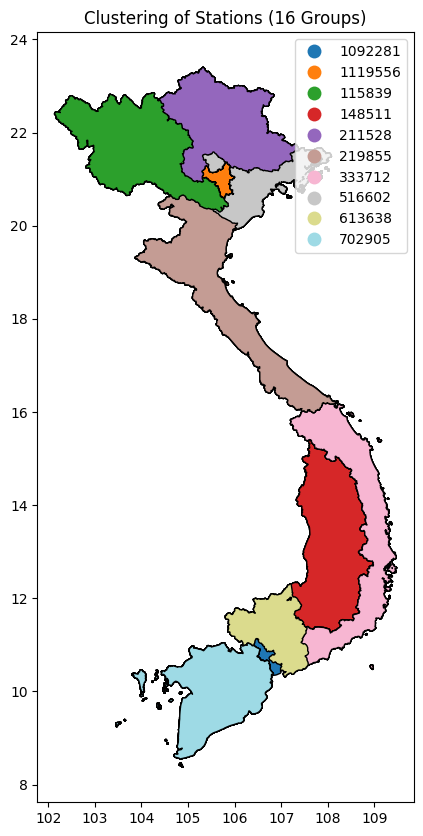

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
gdf_Sub_region_final.plot(column="Cluster", cmap="tab20", legend=True, edgecolor="black", ax=ax)
plt.title("Clustering of Stations (16 Groups)")
plt.show()